In [ ]:
WEEKLY = "/content/drive/MyDrive/Price_Agriculture_commodities_Week.csv"
NEW_FILE_PATH = "/content/combined_dataset_3years.csv"

CROP_YIELD = '/content/drive/MyDrive/Crop_Yield_Prediction 2.csv'

In [ ]:
import pandas as pd

df = pd.read_csv(CROP_YIELD)
df['Crop'].unique().tolist()

['Rice',
 'Maize',
 'ChickPea',
 'KidneyBeans',
 'PigeonPeas',
 'MothBeans',
 'MungBean',
 'Blackgram',
 'Lentil',
 'Pomegranate',
 'Banana',
 'Mango',
 'Grapes',
 'Watermelon',
 'Muskmelon',
 'Apple',
 'Orange',
 'Papaya',
 'Coconut',
 'Cotton',
 'Jute',
 'Coffee']

## DATASET CREATION

In [ ]:
# import pandas as pd
# import numpy as np
# from datetime import datetime, timedelta

# # Set random seed for reproducibility
# np.random.seed(42)

# # Generate dates for one year
# start_date = datetime(2023, 1, 1)
# dates = [start_date + timedelta(days=x) for x in range(365)]

# # Selected commodities
# # commodities = ['Rice', 'Wheat', 'Corn', 'Soybeans']
# commodities = ['Rice', 'Wheat', 'Corn', 'Soybeans', 'Coffee', 'Jute', 'Cotton', 'Coconut', 'Papaya', 'Orange', 'Apple', 'Muskmelon','Watermelon']

# # Create empty list to store data
# data = []

# # Base prices for each commodity (in USD per quintal)
# base_prices = {
#     'Rice': 2000,
#     'Wheat': 1800,
#     'Corn': 1500,
#     'Soybeans': 3000
# }

# # Generate data for each date and commodity
# for date in dates:
#     for commodity in commodities:
#         # Seasonal factors (using sine waves for natural variation)
#         season_factor = np.sin(2 * np.pi * date.timetuple().tm_yday / 365)

#         # Generate soil and weather parameters with seasonal variations
#         temperature = 25 + 10 * season_factor + np.random.normal(0, 2)
#         humidity = 65 + 15 * season_factor + np.random.normal(0, 5)
#         rainfall = max(0, 80 + 60 * season_factor + np.random.normal(0, 20))

#         # Soil parameters with slight daily variations
#         nitrogen = max(0, min(100, 40 + np.random.normal(0, 2)))
#         phosphorus = max(0, min(100, 35 + np.random.normal(0, 2)))
#         potassium = max(0, min(100, 45 + np.random.normal(0, 2)))
#         ph_value = max(0, min(14, 6.5 + np.random.normal(0, 0.1)))

#         # Calculate yield based on conditions
#         base_yield = {
#             'Rice': 45,
#             'Wheat': 35,
#             'Corn': 50,
#             'Soybeans': 30
#         }[commodity]

#         # Yield affected by environmental conditions
#         condition_factor = (
#             (temperature - 25) ** 2 / 100 +  # Optimal temp around 25°C
#             (humidity - 65) ** 2 / 1000 +    # Optimal humidity around 65%
#             (ph_value - 6.5) ** 2            # Optimal pH around 6.5
#         )

#         yield_value = max(0, base_yield * (1 + 0.1 * season_factor - 0.01 * condition_factor))

#         # Generate prices with seasonal variations and random fluctuations
#         base_price = base_prices[commodity]
#         price_variation = 0.15  # 15% variation

#         mod_price = base_price * (1 + price_variation * season_factor + np.random.normal(0, 0.05))
#         min_price = mod_price * 0.9 + np.random.normal(0, 20)
#         max_price = mod_price * 1.1 + np.random.normal(0, 20)

#         data.append({
#             'date': date,
#             'Crop': commodity,
#             'Nitrogen': round(nitrogen, 2),
#             'Phosphorus': round(phosphorus, 2),
#             'Potassium': round(potassium, 2),
#             'Temperature': round(temperature, 2),
#             'Humidity': round(humidity, 2),
#             'pH_Value': round(ph_value, 2),
#             'Rainfall': round(rainfall, 2),
#             'Yield': round(yield_value, 2),
#             'minPrice': round(min_price, 2),
#             'modPrice': round(mod_price, 2),
#             'maxPrice': round(max_price, 2)
#         })

# # Create DataFrame
# df = pd.DataFrame(data)

# # Display first few rows
# print(df.head())

# # Save to CSV
# df.to_csv('agricultural_timeseries.csv', index=False)

        date      Crop  Nitrogen  Phosphorus  Potassium  Temperature  \
0 2023-01-01      Rice     43.05       34.53      44.53        26.17   
1 2023-01-01     Wheat     36.17       31.55      43.88        24.25   
2 2023-01-01      Corn     37.15       33.91      45.22        28.10   
3 2023-01-01  Soybeans     37.88       36.65      42.56        23.97   
4 2023-01-02      Rice     39.40       32.04      43.56        26.82   

   Humidity  pH_Value  Rainfall  Yield  minPrice  modPrice  maxPrice  
0     64.57      6.66     93.99  45.06   1864.33   2081.91   2300.95  
1     62.93      6.40     85.87  35.05   1631.48   1832.93   1987.98  
2     64.13      6.38     82.38  50.03   1366.83   1532.05   1679.42  
3     74.52      6.52     80.76  30.02   2415.85   2713.80   2989.11  
4     66.37      6.45     79.75  45.14   1911.31   2116.04   2292.38  


In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

# Set random seed for reproducibility
np.random.seed(42)

# Generate dates for one year
start_date = datetime(2023, 1, 1)
dates = [start_date + timedelta(days=x) for x in range(365)]

# List of crops
commodities = [
    'Rice', 'Maize', 'ChickPea', 'KidneyBeans', 'PigeonPeas', 'MothBeans',
    'MungBean', 'Blackgram', 'Lentil', 'Pomegranate', 'Banana', 'Mango',
    'Grapes', 'Watermelon', 'Muskmelon', 'Apple', 'Orange', 'Papaya',
    'Coconut', 'Cotton', 'Jute', 'Coffee'
]

# Create empty list to store data
data = []

# Base prices for each commodity (in USD per quintal)
base_prices = {
    'Rice': 2000,
    'Maize': 1500,
    'ChickPea': 4000,
    'KidneyBeans': 5000,
    'PigeonPeas': 4500,
    'MothBeans': 4200,
    'MungBean': 4800,
    'Blackgram': 4600,
    'Lentil': 5500,
    'Pomegranate': 8000,
    'Banana': 2500,
    'Mango': 6000,
    'Grapes': 7000,
    'Watermelon': 2000,
    'Muskmelon': 2500,
    'Apple': 7500,
    'Orange': 4000,
    'Papaya': 3000,
    'Coconut': 5000,
    'Cotton': 4500,
    'Jute': 3500,
    'Coffee': 12000
}

# Base yields for each commodity (quintal per hectare)
base_yields = {
    'Rice': 45,
    'Maize': 50,
    'ChickPea': 20,
    'KidneyBeans': 25,
    'PigeonPeas': 18,
    'MothBeans': 15,
    'MungBean': 12,
    'Blackgram': 14,
    'Lentil': 16,
    'Pomegranate': 150,
    'Banana': 400,
    'Mango': 100,
    'Grapes': 250,
    'Watermelon': 300,
    'Muskmelon': 200,
    'Apple': 180,
    'Orange': 220,
    'Papaya': 450,
    'Coconut': 80,
    'Cotton': 25,
    'Jute': 28,
    'Coffee': 15
}

# Generate data for each date and commodity
for date in dates:
    for commodity in commodities:
        # Seasonal factors (using sine waves for natural variation)
        season_factor = np.sin(2 * np.pi * date.timetuple().tm_yday / 365)

        # Generate soil and weather parameters with seasonal variations
        temperature = 25 + 10 * season_factor + np.random.normal(0, 2)
        humidity = 65 + 15 * season_factor + np.random.normal(0, 5)
        rainfall = max(0, 80 + 60 * season_factor + np.random.normal(0, 20))

        # Soil parameters with slight daily variations
        nitrogen = max(0, min(100, 40 + np.random.normal(0, 2)))
        phosphorus = max(0, min(100, 35 + np.random.normal(0, 2)))
        potassium = max(0, min(100, 45 + np.random.normal(0, 2)))
        ph_value = max(0, min(14, 6.5 + np.random.normal(0, 0.1)))

        # Get base yield for the commodity
        base_yield = base_yields[commodity]

        # Yield affected by environmental conditions
        condition_factor = (
            (temperature - 25) ** 2 / 100 +  # Optimal temp around 25°C
            (humidity - 65) ** 2 / 1000 +    # Optimal humidity around 65%
            (ph_value - 6.5) ** 2            # Optimal pH around 6.5
        )

        yield_value = max(0, base_yield * (1 + 0.1 * season_factor - 0.01 * condition_factor))

        # Generate prices with seasonal variations and random fluctuations
        base_price = base_prices[commodity]
        price_variation = 0.15  # 15% variation

        mod_price = base_price * (1 + price_variation * season_factor + np.random.normal(0, 0.05))
        min_price = mod_price * 0.9 + np.random.normal(0, 20)
        max_price = mod_price * 1.1 + np.random.normal(0, 20)

        data.append({
            'date': date,
            'Crop': commodity,
            'Nitrogen': round(nitrogen, 2),
            'Phosphorus': round(phosphorus, 2),
            'Potassium': round(potassium, 2),
            'Temperature': round(temperature, 2),
            'Humidity': round(humidity, 2),
            'pH_Value': round(ph_value, 2),
            'Rainfall': round(rainfall, 2),
            'Yield': round(yield_value, 2),
            'minPrice': round(min_price, 2),
            'modPrice': round(mod_price, 2),
            'maxPrice': round(max_price, 2)
        })

# Create DataFrame
df = pd.DataFrame(data)

# Display first few rows
print(df.head())

# Save to CSV
df.to_csv('agricultural_timeseries_yearly.csv', index=False)

        date         Crop  Nitrogen  Phosphorus  Potassium  Temperature  \
0 2023-01-01         Rice     43.05       34.53      44.53        26.17   
1 2023-01-01        Maize     36.17       31.55      43.88        24.25   
2 2023-01-01     ChickPea     37.15       33.91      45.22        28.10   
3 2023-01-01  KidneyBeans     37.88       36.65      42.56        23.97   
4 2023-01-01   PigeonPeas     39.40       32.04      43.56        26.65   

   Humidity  pH_Value  Rainfall  Yield  minPrice  modPrice  maxPrice  
0     64.57      6.66     93.99  45.06   1864.33   2081.91   2300.95  
1     62.93      6.40     85.87  50.08   1356.54   1527.44   1651.94  
2     64.13      6.38     82.38  20.01   3664.91   4085.47   4488.18  
3     74.52      6.52     80.76  25.02   4044.13   4522.99   4979.23  
4     66.12      6.45     78.72  18.03   4281.40   4749.47   5189.16  


In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

# Set random seed for reproducibility
np.random.seed(42)

# Generate dates for one year
start_date = datetime(2023, 1, 1)
dates = [start_date + timedelta(days=x) for x in range(365)]

# List of crops
commodities = [
    'Rice', 'Maize', 'ChickPea', 'KidneyBeans', 'PigeonPeas', 'MothBeans',
    'MungBean', 'Blackgram', 'Lentil', 'Pomegranate', 'Banana', 'Mango',
    'Grapes', 'Watermelon', 'Muskmelon', 'Apple', 'Orange', 'Papaya',
    'Coconut', 'Cotton', 'Jute', 'Coffee'
]

# Create empty list to store data
data = []

# Base prices for each commodity (in USD per quintal)
base_prices = {
    'Rice': 2000,
    'Maize': 1500,
    'ChickPea': 4000,
    'KidneyBeans': 5000,
    'PigeonPeas': 4500,
    'MothBeans': 4200,
    'MungBean': 4800,
    'Blackgram': 4600,
    'Lentil': 5500,
    'Pomegranate': 8000,
    'Banana': 2500,
    'Mango': 6000,
    'Grapes': 7000,
    'Watermelon': 2000,
    'Muskmelon': 2500,
    'Apple': 7500,
    'Orange': 4000,
    'Papaya': 3000,
    'Coconut': 5000,
    'Cotton': 4500,
    'Jute': 3500,
    'Coffee': 12000
}

# Base yields for each commodity (quintal per hectare)
base_yields = {
    'Rice': 45,
    'Maize': 50,
    'ChickPea': 20,
    'KidneyBeans': 25,
    'PigeonPeas': 18,
    'MothBeans': 15,
    'MungBean': 12,
    'Blackgram': 14,
    'Lentil': 16,
    'Pomegranate': 150,
    'Banana': 400,
    'Mango': 100,
    'Grapes': 250,
    'Watermelon': 300,
    'Muskmelon': 200,
    'Apple': 180,
    'Orange': 220,
    'Papaya': 450,
    'Coconut': 80,
    'Cotton': 25,
    'Jute': 28,
    'Coffee': 15
}

# Generate data for each date and commodity
for date in dates:
    for commodity in commodities:
        # Seasonal factors (using sine waves for natural variation)
        season_factor = np.sin(2 * np.pi * date.timetuple().tm_yday / 365)

        # Generate soil and weather parameters with seasonal variations
        temperature = 25 + 10 * season_factor + np.random.normal(0, 2)
        humidity = 65 + 15 * season_factor + np.random.normal(0, 5)
        rainfall = max(0, 80 + 60 * season_factor + np.random.normal(0, 20))

        # Soil parameters with slight daily variations
        nitrogen = max(0, min(100, 40 + np.random.normal(0, 2)))
        phosphorus = max(0, min(100, 35 + np.random.normal(0, 2)))
        potassium = max(0, min(100, 45 + np.random.normal(0, 2)))
        ph_value = max(0, min(14, 6.5 + np.random.normal(0, 0.1)))

        # Get base yield for the commodity
        base_yield = base_yields[commodity]

        # Yield affected by environmental conditions
        condition_factor = (
            (temperature - 25) ** 2 / 100 +  # Optimal temp around 25°C
            (humidity - 65) ** 2 / 1000 +    # Optimal humidity around 65%
            (ph_value - 6.5) ** 2            # Optimal pH around 6.5
        )

        yield_value = max(0, base_yield * (1 + 0.1 * season_factor - 0.01 * condition_factor))

        # Generate prices with seasonal variations and random fluctuations
        base_price = base_prices[commodity]
        price_variation = 0.15  # 15% variation

        mod_price = base_price * (1 + price_variation * season_factor + np.random.normal(0, 0.05))
        min_price = mod_price * 0.9 + np.random.normal(0, 20)
        max_price = mod_price * 1.1 + np.random.normal(0, 20)

        data.append({
            'date': date,
            'Crop': commodity,
            'Nitrogen': round(nitrogen, 2),
            'Phosphorus': round(phosphorus, 2),
            'Potassium': round(potassium, 2),
            'Temperature': round(temperature, 2),
            'Humidity': round(humidity, 2),
            'pH_Value': round(ph_value, 2),
            'Rainfall': round(rainfall, 2),
            'Yield': round(yield_value, 2),
            'minPrice': round(min_price, 2),
            'modPrice': round(mod_price, 2),
            'maxPrice': round(max_price, 2)
        })

# Create DataFrame
df = pd.DataFrame(data)

# Display first few rows
print(df.head())

# Save to CSV
df.to_csv('agricultural_timeseries_yearly.csv', index=False)

        date         Crop  Nitrogen  Phosphorus  Potassium  Temperature  \
0 2023-01-01         Rice     43.05       34.53      44.53        26.17   
1 2023-01-01        Maize     36.17       31.55      43.88        24.25   
2 2023-01-01     ChickPea     37.15       33.91      45.22        28.10   
3 2023-01-01  KidneyBeans     37.88       36.65      42.56        23.97   
4 2023-01-01   PigeonPeas     39.40       32.04      43.56        26.65   

   Humidity  pH_Value  Rainfall  Yield  minPrice  modPrice  maxPrice  
0     64.57      6.66     93.99  45.06   1864.33   2081.91   2300.95  
1     62.93      6.40     85.87  50.08   1356.54   1527.44   1651.94  
2     64.13      6.38     82.38  20.01   3664.91   4085.47   4488.18  
3     74.52      6.52     80.76  25.02   4044.13   4522.99   4979.23  
4     66.12      6.45     78.72  18.03   4281.40   4749.47   5189.16  


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import mutual_info_regression

def load_and_prepare_data(file_path='agricultural_timeseries_yearly.csv'):
    """Load and prepare the dataset for analysis."""
    df = pd.read_csv(file_path)
    df['date'] = pd.to_datetime(df['date'])
    df['month'] = df['date'].dt.month
    df['season'] = pd.cut(df['month'],
                         bins=[0, 3, 6, 9, 12],
                         labels=['Winter', 'Spring', 'Summer', 'Fall'])
    return df

def analyze_yield_factors(df):
    """Analyze factors affecting crop yield."""
    # Create correlation matrix for environmental factors vs yield
    env_factors = ['nitrogen', 'phosphorus', 'potassium', 'temperature',
                  'humidity', 'pH_value', 'rainfall']

    plt.figure(figsize=(15, 10))

    # Correlation heatmap
    correlation_matrix = df[env_factors + ['yield']].corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
    plt.title('Correlation Heatmap: Environmental Factors vs Yield')
    plt.tight_layout()
    plt.show()

    # Seasonal patterns in yield
    plt.figure(figsize=(15, 6))
    sns.boxplot(data=df, x='month', y='yield', hue='commodity')
    plt.title('Monthly Yield Patterns by Commodity')
    plt.tight_layout()
    plt.show()

    # Feature importance using mutual information
    X = df[env_factors]
    y = df['yield']

    # Scale the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Calculate mutual information scores
    mi_scores = mutual_info_regression(X_scaled, y)
    importance_df = pd.DataFrame({'Feature': env_factors,
                                'Importance': mi_scores})
    importance_df = importance_df.sort_values('Importance', ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title('Feature Importance for Yield Prediction')
    plt.tight_layout()
    plt.show()

    return importance_df

def analyze_price_factors(df):
    """Analyze factors affecting crop prices."""
    # Calculate price volatility
    df['price_volatility'] = (df['maxPrice'] - df['minPrice']) / df['modPrice']

    # Price correlation with yield and environmental factors
    price_factors = ['yield', 'temperature', 'humidity', 'rainfall',
                    'price_volatility']

    plt.figure(figsize=(15, 10))

    # Correlation heatmap
    correlation_matrix = df[price_factors + ['modPrice']].corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
    plt.title('Correlation Heatmap: Factors vs Price')
    plt.tight_layout()
    plt.show()

    # Price trends over time by commodity
    plt.figure(figsize=(15, 6))
    for commodity in df['commodity'].unique():
        commodity_data = df[df['commodity'] == commodity]
        plt.plot(commodity_data['date'], commodity_data['modPrice'],
                label=commodity, alpha=0.7)
    plt.title('Price Trends by Commodity')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Price volatility analysis
    plt.figure(figsize=(15, 6))
    sns.boxplot(data=df, x='month', y='price_volatility', hue='commodity')
    plt.title('Monthly Price Volatility by Commodity')
    plt.tight_layout()
    plt.show()

    return df.groupby('commodity').agg({
        'modPrice': ['mean', 'std'],
        'price_volatility': 'mean'
    }).round(2)

def print_summary_statistics(df):
    """Print summary statistics for each commodity."""
    summary_stats = df.groupby('commodity').agg({
        'yield': ['mean', 'std', 'min', 'max'],
        'modPrice': ['mean', 'std', 'min', 'max']
    }).round(2)

    return summary_stats

# Main analysis
def main_analysis():
    # Load data
    df = load_and_prepare_data()

    print("\n=== Yield Analysis ===")
    yield_importance = analyze_yield_factors(df)
    print("\nFeature Importance for Yield:")
    print(yield_importance)

    print("\n=== Price Analysis ===")
    price_stats = analyze_price_factors(df)
    print("\nPrice Statistics by Commodity:")
    print(price_stats)

    print("\n=== Summary Statistics ===")
    summary_stats = print_summary_statistics(df)
    print("\nSummary Statistics by Commodity:")
    print(summary_stats)



In [ ]:
  main_analysis()


=== Yield Analysis ===


KeyError: "None of [Index(['nitrogen', 'phosphorus', 'potassium', 'temperature', 'humidity',\n       'pH_value', 'rainfall', 'yield'],\n      dtype='object')] are in the [columns]"

<Figure size 1500x1000 with 0 Axes>

In [ ]:
!pip install dask[dataframe]

INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.2/243.2 kB 3.7 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
from prophet import Prophet
from statsmodels.tsa.statespace.sarimax import SARIMAX
import lightgbm as lgb
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

class TimeSeriesModeling:
    def __init__(self, data, target_col, feature_cols):
        self.data = data.copy()
        self.target_col = target_col
        self.feature_cols = feature_cols
        self.scaler = StandardScaler()

    def prepare_data(self, sequence_length=30):
        """Prepare data for time series modeling"""
        # Scale features
        scaled_features = self.scaler.fit_transform(self.data[self.feature_cols])
        self.data[self.feature_cols] = scaled_features

        # Create sequences for LSTM
        X, y = [], []
        values = self.data[self.feature_cols].values
        target_values = self.data[self.target_col].values

        for i in range(len(self.data) - sequence_length):
            X.append(values[i:(i + sequence_length)])
            y.append(target_values[i + sequence_length])

        return np.array(X), np.array(y)

    def create_lstm_model(self, input_shape):
        """Create LSTM model"""
        model = Sequential([
            LSTM(50, return_sequences=True, input_shape=input_shape),
            Dropout(0.2),
            LSTM(50),
            Dropout(0.2),
            Dense(1)
        ])
        model.compile(optimizer='adam', loss='mse')
        return model

    def prophet_model(self, train_data):
        """Create and fit Prophet model"""
        # Prepare data for Prophet
        prophet_data = train_data.rename(columns={
            'date': 'ds',
            self.target_col: 'y'
        })[['ds', 'y'] + self.feature_cols].copy()

        # Initialize Prophet model
        model = Prophet(yearly_seasonality=True,
                       weekly_seasonality=True,
                       daily_seasonality=False)

        # Add regressors
        for feature in self.feature_cols:
            if feature != 'date':
                model.add_regressor(feature)

        model.fit(prophet_data)
        return model

    def xgboost_model(self, X, y):
        """Create and fit XGBoost model"""
        model = xgb.XGBRegressor(
            objective='reg:squarederror',
            n_estimators=100,
            learning_rate=0.1,
            max_depth=7,
            min_child_weight=1,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42
        )
        model.fit(X, y)
        return model

    def evaluate_models(self, commodity='Rice'):
        """Evaluate all models for a specific commodity"""
        # Filter data for specific commodity
        commodity_data = self.data[self.data['commodity'] == commodity].copy()
        commodity_data = commodity_data.sort_values('date').reset_index(drop=True)

        # Initialize TimeSeriesSplit
        tscv = TimeSeriesSplit(n_splits=5, test_size=30)

        results = {
            'LSTM': {'MAE': [], 'RMSE': [], 'R2': []},
            'XGBoost': {'MAE': [], 'RMSE': [], 'R2': []},
            'Prophet': {'MAE': [], 'RMSE': [], 'R2': []}
        }

        # Prepare sequences for LSTM
        X_seq, y_seq = self.prepare_data()

        for train_idx, test_idx in tscv.split(commodity_data):
            # Split data
            train_data = commodity_data.iloc[train_idx]
            test_data = commodity_data.iloc[test_idx]

            # 1. LSTM Evaluation
            if len(X_seq) > 0:  # Check if we have enough sequence data
                train_seq_idx = [i for i in range(len(X_seq)) if i < test_idx[0]]
                test_seq_idx = [i for i in range(len(X_seq)) if i >= test_idx[0] and i < test_idx[-1]]

                if len(train_seq_idx) > 0 and len(test_seq_idx) > 0:
                    X_train_seq = X_seq[train_seq_idx]
                    y_train_seq = y_seq[train_seq_idx]
                    X_test_seq = X_seq[test_seq_idx]
                    y_test_seq = y_seq[test_seq_idx]

                    lstm_model = self.create_lstm_model((X_train_seq.shape[1], X_train_seq.shape[2]))
                    lstm_model.fit(X_train_seq, y_train_seq, epochs=50, batch_size=32, verbose=0)
                    lstm_pred = lstm_model.predict(X_test_seq)

                    results['LSTM']['MAE'].append(mean_absolute_error(y_test_seq, lstm_pred))
                    results['LSTM']['RMSE'].append(np.sqrt(mean_squared_error(y_test_seq, lstm_pred)))
                    results['LSTM']['R2'].append(r2_score(y_test_seq, lstm_pred))

            # 2. XGBoost Evaluation
            X_train = train_data[self.feature_cols]
            y_train = train_data[self.target_col]
            X_test = test_data[self.feature_cols]
            y_test = test_data[self.target_col]

            xgb_model = self.xgboost_model(X_train, y_train)
            xgb_pred = xgb_model.predict(X_test)

            results['XGBoost']['MAE'].append(mean_absolute_error(y_test, xgb_pred))
            results['XGBoost']['RMSE'].append(np.sqrt(mean_squared_error(y_test, xgb_pred)))
            results['XGBoost']['R2'].append(r2_score(y_test, xgb_pred))

            # 3. Prophet Evaluation
            try:
                prophet_model = self.prophet_model(train_data)
                future = prophet_model.make_future_dataframe(periods=len(test_data), freq='D')

                # Add regressor values to future dataframe
                for feature in self.feature_cols:
                    if feature != 'date':
                        future[feature] = pd.concat([train_data[feature], test_data[feature]]).reset_index(drop=True)

                forecast = prophet_model.predict(future)
                prophet_pred = forecast.tail(len(test_data))['yhat']

                results['Prophet']['MAE'].append(mean_absolute_error(test_data[self.target_col], prophet_pred))
                results['Prophet']['RMSE'].append(np.sqrt(mean_squared_error(test_data[self.target_col], prophet_pred)))
                results['Prophet']['R2'].append(r2_score(test_data[self.target_col], prophet_pred))
            except Exception as e:
                print(f"Prophet error: {e}")
                continue

        # Calculate average metrics
        final_results = {}
        for model in results:
            final_results[model] = {
                metric: np.mean(values) for metric, values in results[model].items()
            }

        return pd.DataFrame(final_results)

In [ ]:
# Load your data
df = pd.read_csv('/content/crop_yield_prediction.csv')
# df['date'] = pd.to_datetime(df['date'])

# Features for yield prediction
yield_features = ['nitrogen', 'phosphorus', 'potassium', 'temperature',
                  'humidity', 'pH_value', 'rainfall']


# Initialize models for yield prediction
yield_modeling = TimeSeriesModeling(df, 'yield', yield_features)
yield_results = yield_modeling.evaluate_models()

KeyError: 'date'

In [ ]:
yield_results.__dict__

{'_is_copy': None,
 '_mgr': BlockManager
 Items: Index(['LSTM', 'XGBoost', 'Prophet'], dtype='object')
 Axis 1: Index(['MAE', 'RMSE', 'R2'], dtype='object')
 NumpyBlock: slice(0, 3, 1), 3 x 3, dtype: float64,
 '_item_cache': {'LSTM': MAE     14.430872
  RMSE    16.798356
  R2      -2.923067
  Name: LSTM, dtype: float64,
  'XGBoost': MAE     0.876913
  RMSE    0.988585
  R2     -4.031468
  Name: XGBoost, dtype: float64,
  'Prophet': MAE      1.021134
  RMSE     1.184123
  R2     -10.375373
  Name: Prophet, dtype: float64},
 '_attrs': {},
 '_flags': <Flags(allows_duplicate_labels=True)>}

In [ ]:
# Initialize models for price prediction

# Features for price prediction
price_features = ['yield', 'temperature', 'humidity', 'rainfall']
price_modeling = TimeSeriesModeling(df, 'modPrice', price_features)
price_results = price_modeling.evaluate_models()

print("Yield Prediction Results:")
print(pd.DataFrame(yield_results))

print("\nPrice Prediction Results:")
print(pd.DataFrame(price_results))

# Iteration 1

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

class CropYieldPredictor:
    def __init__(self):
        self.rf_model = None
        self.xgb_model = None
        self.scaler = StandardScaler()

    def prepare_data(self, data):
        """Prepare and preprocess the data"""
        # Define features and target
        X = data[['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature',
                 'Humidity', 'pH_Value', 'Rainfall']]
        y = data['Yield']

        # Scale features
        X_scaled = self.scaler.fit_transform(X)
        X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

        return X_scaled, y

    def train_models(self, X, y):
        """Train both Random Forest and XGBoost models"""
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        # Train Random Forest
        self.rf_model = RandomForestRegressor(
            n_estimators=100,
            max_depth=None,
            min_samples_split=2,
            min_samples_leaf=1,
            random_state=42
        )
        self.rf_model.fit(X_train, y_train)

        # Train XGBoost
        self.xgb_model = xgb.XGBRegressor(
            objective='reg:squarederror',
            n_estimators=100,
            max_depth=6,
            learning_rate=0.1,
            random_state=42
        )
        self.xgb_model.fit(X_train, y_train)

        return X_train, X_test, y_train, y_test

    def evaluate_models(self, X_test, y_test):
        """Evaluate both models"""
        results = {}

        # Random Forest predictions
        rf_pred = self.rf_model.predict(X_test)
        results['Random Forest'] = {
            'MAE': mean_absolute_error(y_test, rf_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, rf_pred)),
            'R2': r2_score(y_test, rf_pred)
        }

        # XGBoost predictions
        xgb_pred = self.xgb_model.predict(X_test)
        results['XGBoost'] = {
            'MAE': mean_absolute_error(y_test, xgb_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, xgb_pred)),
            'R2': r2_score(y_test, xgb_pred)
        }

        return results, rf_pred, xgb_pred

    def plot_feature_importance(self, feature_names):
        """Plot feature importance for both models"""
        plt.figure(figsize=(12, 5))

        # Random Forest feature importance
        plt.subplot(1, 2, 1)
        rf_importance = pd.DataFrame({
            'feature': feature_names,
            'importance': self.rf_model.feature_importances_
        }).sort_values('importance', ascending=True)

        plt.barh(range(len(rf_importance)), rf_importance['importance'])
        plt.yticks(range(len(rf_importance)), rf_importance['feature'])
        plt.xlabel('Importance')
        plt.title('Random Forest Feature Importance')

        # XGBoost feature importance
        plt.subplot(1, 2, 2)
        xgb_importance = pd.DataFrame({
            'feature': feature_names,
            'importance': self.xgb_model.feature_importances_
        }).sort_values('importance', ascending=True)

        plt.barh(range(len(xgb_importance)), xgb_importance['importance'])
        plt.yticks(range(len(xgb_importance)), xgb_importance['feature'])
        plt.xlabel('Importance')
        plt.title('XGBoost Feature Importance')

        plt.tight_layout()
        plt.show()

    def predict_yield(self, new_data):
        """Make predictions for new data"""
        # Scale new data
        scaled_data = self.scaler.transform(new_data)

        # Make predictions with both models
        rf_pred = self.rf_model.predict(scaled_data)
        xgb_pred = self.xgb_model.predict(scaled_data)

        # Return average of both predictions
        return {
            'Random Forest Prediction': rf_pred,
            'XGBoost Prediction': xgb_pred,
            'Ensemble Prediction': (rf_pred + xgb_pred) / 2
        }


def plot_predictions_vs_actual(data, y_test, rf_pred, xgb_pred):
    """Plot actual vs predicted values over time"""
    plt.figure(figsize=(15, 8))

    # Create DataFrame with all prediction data
    results_df = pd.DataFrame({
        'Date': data.loc[y_test.index, 'date'],
        'Actual': y_test,
        'Random Forest': rf_pred,
        'XGBoost': xgb_pred,
        'Ensemble': (rf_pred + xgb_pred) / 2
    })

    # Sort by date
    results_df = results_df.sort_values('Date')

    # Plot
    plt.plot(results_df['Date'], results_df['Actual'],
             marker='o', label='Actual Yield', linewidth=2, markersize=8)
    plt.plot(results_df['Date'], results_df['Random Forest'],
             marker='s', label='Random Forest', linewidth=2, markersize=8)
    plt.plot(results_df['Date'], results_df['XGBoost'],
             marker='^', label='XGBoost', linewidth=2, markersize=8)
    plt.plot(results_df['Date'], results_df['Ensemble'],
             marker='d', label='Ensemble', linewidth=2, markersize=8)

    # Customize the plot
    plt.title('Actual vs Predicted Yield Over Time', fontsize=16, pad=20)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Yield', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(loc='best', fontsize=10)

    # Rotate x-axis labels
    plt.xticks(rotation=45)

    # Add statistics annotation
    mse_rf = mean_squared_error(results_df['Actual'], results_df['Random Forest'])
    mse_xgb = mean_squared_error(results_df['Actual'], results_df['XGBoost'])
    mse_ensemble = mean_squared_error(results_df['Actual'], results_df['Ensemble'])

    stats_text = (f'RMSE:\nRF: {np.sqrt(mse_rf):.2f}\n'
                 f'XGB: {np.sqrt(mse_xgb):.2f}\n'
                 f'Ensemble: {np.sqrt(mse_ensemble):.2f}')

    plt.annotate(stats_text,
                xy=(0.02, 0.95),
                xycoords='axes fraction',
                bbox=dict(boxstyle="round,pad=0.3",
                         fc="white",
                         ec="gray",
                         alpha=0.8),
                fontsize=10)

    plt.tight_layout()
    plt.show()

    return results_df



In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
def main(requested_crop):
    # Load data
    data = pd.read_csv("/content/agricultural_timeseries.csv")
    data = data[data['Crop'] == requested_crop]

    # Initialize predictor
    predictor = CropYieldPredictor()

    # Prepare data
    X, y = predictor.prepare_data(data)

    # Train models and get predictions
    X_train, X_test, y_train, y_test = predictor.train_models(X, y)
    results, rf_pred, xgb_pred = predictor.evaluate_models(X_test, y_test)

    # Print evaluation results
    print("\nModel Evaluation Results:")
    print(pd.DataFrame(results))

    # Plot feature importance
    predictor.plot_feature_importance(X.columns)

    # Get the indices of test data
    test_indices = y_test.index

    # Plot predictions vs actual values
    results_df = plot_predictions_vs_actual(data, y_test, rf_pred, xgb_pred)



Model Evaluation Results:
      Random Forest   XGBoost
MAE        0.564622  0.564319
RMSE       0.732436  0.746459
R2         0.944688  0.942549


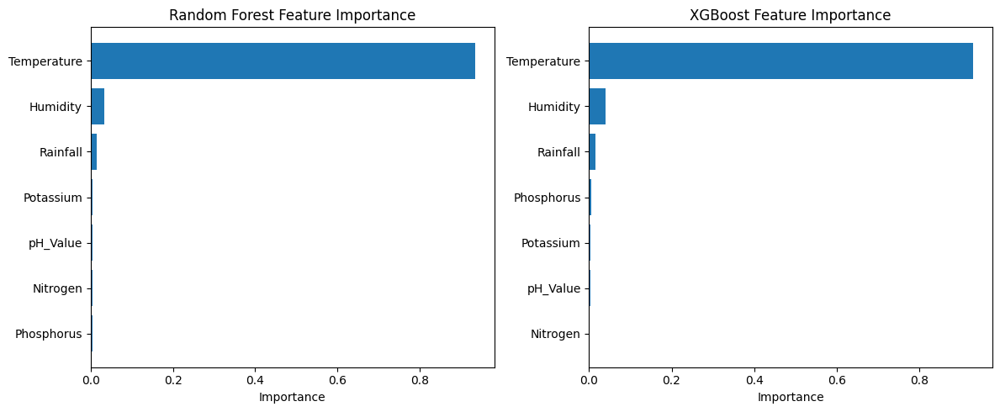

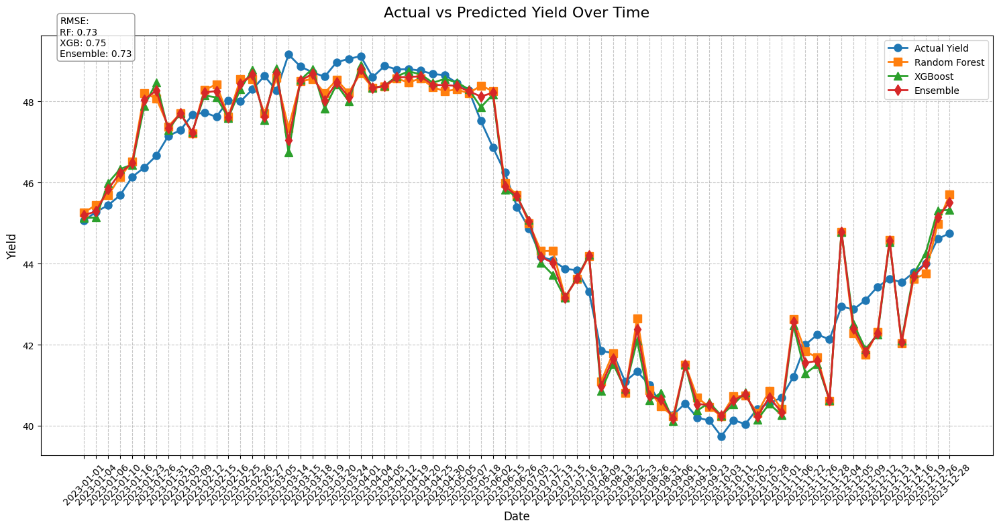

In [ ]:
for crop in ['Rice']:
  main(crop)

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
data = pd.read_csv("/content/agricultural_timeseries.csv")
rice_data = data[data['Crop'] == 'Rice']
rice_data

,date,Crop,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH_Value,Rainfall,Yield,minPrice,modPrice,maxPrice
0,2023-01-01,Rice,43.05,34.53,44.53,26.17,64.57,6.66,93.99,45.06,1864.33,2081.91,2300.95
4,2023-01-02,Rice,39.40,32.04,43.56,26.82,66.37,6.45,79.75,45.14,1911.31,2116.04,2292.38
8,2023-01-03,Rice,38.96,33.38,44.00,25.08,67.56,6.59,112.66,45.23,1832.93,2048.36,2263.46
12,2023-01-04,Rice,37.20,36.17,49.38,27.27,61.49,6.40,112.18,45.28,1769.60,1964.01,2150.34
16,2023-01-05,Rice,38.36,36.93,45.83,23.91,70.22,6.58,108.33,45.37,1989.01,2215.47,2421.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1440,2023-12-27,Rice,41.49,33.65,46.41,24.20,57.48,6.54,93.29,44.66,1649.09,1851.30,2059.19
1444,2023-12-28,Rice,42.43,34.17,43.11,27.00,67.10,6.49,99.39,44.75,1710.81,1897.24,2109.60
1448,2023-12-29,Rice,40.70,35.62,43.63,22.94,59.07,6.50,54.36,44.81,1908.67,2142.39,2317.59
1452,2023-12-30,Rice,42.37,37.45,47.67,25.84,65.51,6.50,85.35,44.92,1872.17,2050.33,2242.89


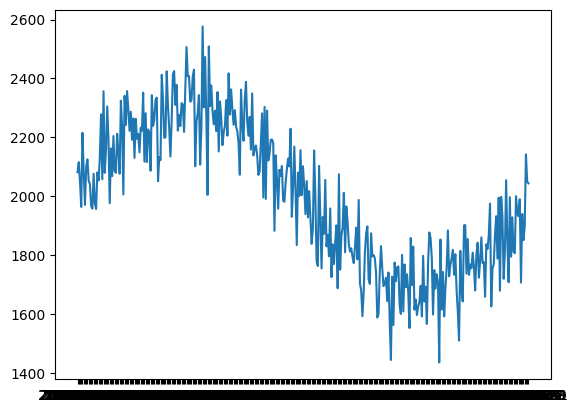

In [ ]:
plt.plot(rice_data['date'], rice_data['modPrice'])

# EDA

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv("/content/agricultural_timeseries_yearly.csv")

# <span style="color:mediumorchid">Explanatory Data Analysis</span>

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, StandardScaler, OrdinalEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score, mean_squared_error

In [ ]:
df['Crop'].unique()

array(['Rice', 'Maize', 'ChickPea', 'KidneyBeans', 'PigeonPeas',
       'MothBeans', 'MungBean', 'Blackgram', 'Lentil', 'Pomegranate',
       'Banana', 'Mango', 'Grapes', 'Watermelon', 'Muskmelon', 'Apple',
       'Orange', 'Papaya', 'Coconut', 'Cotton', 'Jute', 'Coffee'],
      dtype=object)

In [ ]:
fig = px.pie(values = df['Crop'].value_counts(), names = df['Crop'].unique(),
             title = '<b>Proportion Of Crops<b>')
fig.update_traces(textinfo = 'label+percent', marker_line_color = 'saddlebrown',
                  marker_line_width = 2, textposition = 'inside')
fig.update_layout(title = {'font_color' : 'navajowhite', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'})
fig.show()

Pie chart indicates all the crops have the same percentage share.

In [ ]:
fig = px.pie(df, values = 'Yield', names = 'Crop',
             title = 'Proportion Of Crops Based On Yield')
fig.update_traces(textinfo = 'label+percent', marker_line_color = 'fuchsia',
                  marker_line_width = 2, textposition = 'inside')
fig.update_layout(title = {'font_color' : 'indigo', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  legend_title = {'text' : "Crops", 'font_color' : 'yellowgreen'})
fig.show()

In [ ]:
fig = px.histogram(df, x = 'Crop', y = "Yield",
                   title = "<b>Sum Of Yield For Different Crops<b>", text_auto = True)
fig.update_traces(marker_color = 'mintcream', marker_line_color = 'lightsalmon',
                  marker_line_width = 1)
fig.update_layout(title = {'font_color' : 'mediumseagreen', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'sandybrown')
fig.show()

The graph indicates that pigeonpeas has the highest proportion of share in yield approximately 9% followed by rice and watermelon having a share of approximately 8% and 7% respectively. Orange has the lowest yield having a proportion of approximately 2.35%, followed by cotton and apple having a share of approximately 2.39% and 2.88% respectively.

<span style="color:fuchsia">Correlation Matrix</span>

In [ ]:
corr_df = df[['Nitrogen','Phosphorus','Potassium','Temperature','Humidity','pH_Value','Rainfall','Yield']]
correlation = corr_df.corr(numeric_only = True)
correlation

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH_Value,Rainfall,Yield
Nitrogen,1.000000,0.004847,0.011144,-0.005331,-0.000758,-0.016603,-0.005165,0.020058
Phosphorus,0.004847,1.000000,-0.005473,-0.004592,0.002533,-0.000112,-0.007022,0.007251
Potassium,0.011144,-0.005473,1.000000,-0.010061,-0.008844,-0.008960,-0.010937,-0.006565
Temperature,-0.005331,-0.004592,-0.010061,1.000000,0.872992,0.016717,0.870153,0.064394
Humidity,-0.000758,0.002533,-0.008844,0.872992,1.000000,0.017449,0.825184,0.056321
pH_Value,-0.016603,-0.000112,-0.008960,0.016717,0.017449,1.000000,0.011095,0.001762
Rainfall,-0.005165,-0.007022,-0.010937,0.870153,0.825184,0.011095,1.000000,0.061242
Yield,0.020058,0.007251,-0.006565,0.064394,0.056321,0.001762,0.061242,1.000000


In [ ]:
fig = px.imshow(correlation, text_auto = '.3f', title = 'Correlation Matrix',
                color_continuous_scale = 'amp', aspect = 'auto')
fig.update_layout(title = {'font_color' : 'violet', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'navajowhite')
fig.show()

<span style="color:turquoise">Scatter Plot</span>

In [ ]:
fig = px.scatter(df, x = 'Nitrogen', y = 'Yield',
                 title = 'Relation Between Nitron Content Ratio In The Soil & Yield')
fig.update_traces(marker_color = 'lavender', marker_line_width = 0.5, marker_size = 9)
fig.update_layout(title = {'font_color' : 'rebeccapurple', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'peru')

In [ ]:
fig = px.scatter(df, x = 'Phosphorus', y = 'Yield',
                 title = 'Relation Between Phosphorus Content Ratio In The Soil & Yield')
fig.update_traces(marker_color = 'beige', marker_line_width = 0.5, marker_size = 9)
fig.update_layout(title = {'font_color' : 'sienna', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'burlywood')

In [ ]:
fig = px.scatter(df, x = 'Potassium', y = 'Yield',
                 title = 'Relation Between Potassium Content Ratio In The Soil & Yield')
fig.update_traces(marker_color = 'peru', marker_line_width = 0.5, marker_size = 9)
fig.update_layout(title = {'font_color' : 'darkorange', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'teal')

The scatter plots indicates there is a negative correlation between nitrogen, phosphorus and potassium content retio in the soil and yield of crop. But the relation is very weak, as the graph indicates that there are instances where the nitrogen, phosphorus and potassium content rartio in the soil is low but the yield of crop is also low.

In [ ]:
fig = px.scatter(df, x = 'pH_Value', y = 'Yield',
                 title = 'Relation Between pH Value Of The Soil & Yield')
fig.update_traces(marker_color = 'bisque', marker_line_width = 0.5, marker_size = 9)
fig.update_layout(title = {'font_color' : 'mediumseagreen', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'coral')

The pH value graph also indicates there is a negative correlation between pH value of the soil and yield of crop. But the relation is very weak, as the graph indicates that there are instances where pH value of the soil is low but the yield of crop is also low.

Thus it indicates that soil composition does not only play a vital role in yield of crop but there are also other factors like temperature, rainfall also increase the the yield of crop.

In [ ]:
fig = px.scatter(df, x = 'Temperature', y = 'Yield',
                 title = 'Relation Between Temperature & Yield')
fig.update_traces(marker_color = 'azure', marker_line_width = 0.5, marker_size = 9)
fig.update_layout(title = {'font_color' : 'saddlebrown', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'salmon')

In [ ]:
fig = px.scatter(df, x = 'Humidity', y = 'Yield',
                 title = '<b>Relation Between Humidity & Yield<b>')
fig.update_traces(marker_color = 'peachpuff', marker_line_width = 0.5, marker_size = 9)
fig.update_layout(title = {'font_color' : 'gainsboro', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'darkmagenta')

The graphs of temperature and humidity also indicates there is a negative correlation between weather conditions and yield of crop. But the relation is very weak, as the graph indicates that there are instances temperature and humidity is low but the yield of crop is also low.

In [ ]:
fig = px.scatter(df, x = 'Rainfall', y = 'Yield',
                 title = '<b>Relation Between Rainfall & Yield<b>')
fig.update_traces(marker_color = 'mediumaquamarine', marker_line_width = 0.5,
                  marker_size = 9)
fig.update_layout(title = {'font_color' : 'chocolate', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'mediumturquoise')

The graph indicates there is a positive correlation between rainfall and yield of crop. The graph indicates that there are instances where rainfall is low but the yield of crop is high and rainfall is high but yield of crop is also low, as excessive rainfall plays an adverse effect on yield of crop. So, the relation is weak.

<span style="color:chartreuse">Distribution Plot & Box Plot</span>

In [ ]:
fig = px.histogram(df, x = 'Yield', title = '<b>Distribution Of Yield<b>')
fig.update_traces(marker_color = 'mistyrose', marker_line_color = 'magenta',
                  marker_line_width = 1)
fig.update_layout(title = {'font_color' : 'silver', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'violet')
fig.show()

In [ ]:
import numpy as np
mean = np.mean(df['Yield'])
median = np.median(df['Yield'])
skewness = stats.skew(df['Yield'])
maximum = df['Yield'].max()

print('Mean of yield is: ', mean)
print('Median of yield is: ', median)
print('Skewness of yield is: ', skewness)
print('Maximum yield is: ', maximum)

Mean of yield is:  117.95608468244083
Median of yield is:  47.175
Skewness of yield is:  1.2194442061581194
Maximum yield is:  492.38


In [ ]:
fig = px.box(df, y = 'Yield', title = 'Detection Of Outliers')
fig.update_traces(fillcolor = 'linen', line_color = 'lightsalmon', boxmean = True,
                  marker_color = 'seashell', marker_line_width = 0.5,
                 marker_line_color = 'lightseagreen')
fig.update_layout(title = {'font_color' : 'maroon', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'indigo')
fig.show()

The distribution plot indicates that the distribution of yield is highly skewed. The distribution is right skewed, indicates there are many outliers in the dataset. Mean is higher than the median.

This is also indicated by the box plot. The outliers are shown by the dots outside the upper fence. Mean is shown by the dotted line inside the box and median is shown by the darkline inside the box. The whisker on the bottom is shorter than the whisker on the top of the boxplot, which indicates that the distribution is right skewed.


In [ ]:
fig = px.histogram(df, x = 'Rainfall', title = '<b>Distribution Of Rainfall<b>')
fig.update_traces(marker_color = 'lavenderblush', marker_line_color = 'crimson',
                  marker_line_width = 1)
fig.update_layout(title = {'font_color' : 'forestgreen', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'rebeccapurple')
fig.show()

In [ ]:
mean = np.mean(df['Rainfall'])
median = np.median(df['Rainfall'])
skewness = stats.skew(df['Rainfall'])
maximum = df['Rainfall'].max()

print('Mean rainfall is: ', mean)
print('Median rainfall is: ', median)
print('Skewness of rainfall is: ', skewness)
print('Maximum rainfall is: ', maximum)

Mean rainfall is:  80.03852552926526
Median rainfall is:  79.155
Skewness of rainfall is:  0.055387837381131205
Maximum rainfall is:  200.97


In [ ]:
fig = px.box(df, y = 'Rainfall', title = 'Detection Of Outliers')
fig.update_traces(fillcolor = 'ivory', line_color = 'orchid', boxmean = True,
                  marker_color = 'seashell', marker_line_width = 0.5,
                 marker_line_color = 'lightseagreen')
fig.update_layout(title = {'font_color' : 'seagreen', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'sienna')
fig.show()

The distribution plot indicates that the distribution of rainfall is highly skewed. The distribution is right skewed, indicates there are many outliers in the dataset. Mean is higher than the median.

Box plot also indicates, there are many outliers, shown by the dots outside the upper fence. Mean is shown by the dotted line inside the box and median is shown by the darkline inside the box. The whisker on the bottom is much shorter than the whisker on the top of the boxplot, which indicates that the distribution is right skewed.

<span style="color:lawngreen">Removing Outliers With 99th Percentiles</span>

In [ ]:
rainfall_99th = df['Rainfall'].quantile(0.99)
print("99th Percentile of Rainfall is: ", rainfall_99th)

99th Percentile of Rainfall is:  169.6842


In [ ]:
df['Rainfall'] = np.where(df['Rainfall'] >= rainfall_99th, rainfall_99th, df['Rainfall'])

In [ ]:
fig = px.histogram(df, x = 'Temperature', title = '<b>Distribution Of Temperature<b>')
fig.update_traces(marker_color = 'turquoise', marker_line_color = 'saddlebrown',
                  marker_line_width = 1)
fig.update_layout(title = {'font_color' : 'orange', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'darkviolet')
fig.show()

In [ ]:
mean = np.mean(df['Temperature'])
median = np.median(df['Temperature'])
skewness = stats.skew(df['Temperature'])
maximum = df['Temperature'].max()

print('Mean temperature is: ', mean)
print('Median temperature is: ', median)
print('Skewness of temperature is: ', skewness)
print('Maximum temperature is: ', maximum)

Mean temperature is:  25.018524283935243
Median temperature is:  25.1
Skewness of temperature is:  -0.004378905042702083
Maximum temperature is:  42.13


In [ ]:
fig = px.box(df, y = 'Temperature', title = '<b>Detection Of Outliers<b>')
fig.update_traces(fillcolor = 'burlywood', line_color = 'coral', boxmean = True,
                  marker_color = 'snow', marker_line_width = 0.5,
                 marker_line_color = 'teal')
fig.update_layout(title = {'font_color' : 'cyan', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'sandybrown')
fig.show()

The distribution plot indicates that the distribution of temperature is nearly normal. Mean and median is approximately equal.

This is also indicated by the box plot. The outliers are shown by the dots outside the lower and upper fence. Mean is shown by the dotted line inside the box and median is shown by the darkline inside the box, which are ovelapping.

<span style="color:rosybrown">Removing Outliers With 99th Percentiles & 1st Percentile</span>

In [ ]:
temperature_99th = df['Temperature'].quantile(0.99)
print("99th Percentile of Temperature is: ", temperature_99th)

99th Percentile of Temperature is:  37.8671


In [ ]:
temperature_1st = df['Temperature'].quantile(0.01)
print("1st Percentile of Temperature is: ", temperature_1st)

1st Percentile of Temperature is:  12.1058


In [ ]:
df['Temperature'] = np.where(df['Temperature'] >= temperature_99th,
                             temperature_99th,
                             np.where(df['Temperature'] <= temperature_1st,
                             temperature_1st,
                             df['Temperature']))

In [ ]:
fig = px.histogram(df, x = 'pH_Value', title = '<b>Distribution Of pH Value<b>')
fig.update_traces(marker_color = 'floralwhite', marker_line_color = 'darkmagenta',
                  marker_line_width = 1)
fig.update_layout(title = {'font_color' : 'darkolivegreen', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'mediumspringgreen')
fig.show()

In [ ]:
mean = np.mean(df['pH_Value'])
median = np.median(df['pH_Value'])
skewness = stats.skew(df['pH_Value'])

print('Mean of pH value is: ', mean)
print('Median of pH value is: ', median)
print('Skewness of pH value is: ', skewness)

Mean of pH value is:  6.501712328767123
Median of pH value is:  6.5
Skewness of pH value is:  -0.0128505202289645


In [ ]:
fig = px.box(df, y = 'pH_Value', title = 'Detection Of Outliers')
fig.update_traces(fillcolor = 'cornsilk', line_color = 'orange', boxmean = True,
                  marker_color = 'ivory', marker_line_width = 0.5,
                 marker_line_color = 'violet')
fig.update_layout(title = {'font_color' : 'olivedrab', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'peru')
fig.show()

The distribution plot indicates that the distribution of pH value of the soil is nearly normal. Mean and median is approximately equal.

Box plot also indicates similar distribution. The outliers are shown by the dots outside the lower and upper fence. Mean is shown by the dotted line inside the box and median is shown by the darkline inside the box.

<span style="color:springgreen">Removing Outliers With 99th Percentiles & 1st Percentile</span>

In [ ]:
ph_99th = df['pH_Value'].quantile(0.99)
print("99th Percentile of pH value is: ", ph_99th)

99th Percentile of pH value is:  6.73


In [ ]:
ph_1st = df['pH_Value'].quantile(0.01)
print("1st Percentile of pH value is: ", ph_1st)

1st Percentile of pH value is:  6.27


In [ ]:
df['pH_Value'] = np.where(df['pH_Value'] >= ph_99th,
                             ph_99th,
                             np.where(df['pH_Value'] <= ph_1st,
                             ph_1st,
                             df['pH_Value']))

In [ ]:
fig = px.histogram(df, x = 'Nitrogen',
                   title = '<b>Distribution Of Nitrogen Content Ratio In The Soil<b>')
fig.update_traces(marker_color = 'limegreen', marker_line_color = 'teal',
                  marker_line_width = 1)
fig.update_layout(title = {'font_color' : 'silver', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'crimson')
fig.show()

In [ ]:
mean = np.mean(df['Nitrogen'])
median = np.median(df['Nitrogen'])
skewness = stats.skew(df['Nitrogen'])

print('Mean of nitrogen content ratio in the soil is: ', mean)
print('Median of nitrogen content ratio in the soil is: ', median)
print('Skewness of nitrogen content ration in the soil is: ', skewness)

Mean of nitrogen content ratio in the soil is:  39.978556662515565
Median of nitrogen content ratio in the soil is:  40.01
Skewness of nitrogen content ration in the soil is:  -0.017161906502711127


In [ ]:
fig = px.box(df, y = 'Nitrogen', title = 'Detection Of Outliers')
fig.update_traces(fillcolor = 'lavenderblush', line_color = 'purple', boxmean = True)
fig.update_layout(title = {'font_color' : 'brown', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'rebeccapurple')
fig.show()

The distribution plot indicates that the distribution of nitrogen content ratio in the soil is skewed. The distribution is right skewed. Mean is higher than the median.

This is also indicated by the box plot. Mean is shown by the dotted line inside the box and median is shown by the darkline inside the box. The whisker on the bottom is much shorter than the whisker on the top of the boxplot, which indicates that the distribution is right skewed.

In [ ]:
fig = px.histogram(df, x = 'Phosphorus',
                   title = '<b>Distribution Of Phosphorus Content Ratio In The Soil<b>')
fig.update_traces(marker_color = 'forestgreen', marker_line_color = 'brown',
                  marker_line_width = 1)
fig.update_layout(title = {'font_color' : 'coral', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'peachpuff')
fig.show()

In [ ]:
mean = np.mean(df['Phosphorus'])
median = np.median(df['Phosphorus'])
skewness = stats.skew(df['Phosphorus'])

print('Mean of phosphorus content ratio in the soil is: ', mean)
print('Median of phosphorus content ratio in the soil is: ', median)
print('Skewness of phosphorus content ration in the soil is: ', skewness)

Mean of phosphorus content ratio in the soil is:  35.02818493150685
Median of phosphorus content ratio in the soil is:  34.99
Skewness of phosphorus content ration in the soil is:  0.029687570805158176


In [ ]:
fig = px.box(df, y = 'Phosphorus', title = 'Detection Of Outliers')
fig.update_traces(fillcolor = 'burlywood', line_color = 'rosybrown', boxmean = True,
                  marker_color = 'lavenderblush', marker_line_width = 0.5,
                 marker_line_color = 'violet')
fig.update_layout(title = {'font_color' : 'silver', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'orange')
fig.show()

The distribution plot indicates that the distribution of phosphorus content ratio in the soil is skewed. The distribution is right skewed, indicates there are many outliers in the dataset. Mean is higher than the median.

This is also indicated by the box plot. The outliers are shown by the dots outside the upper fence. Mean is shown by the dotted line inside the box and median is shown by the darkline inside the box. The whisker on the bottom is much shorter than the whisker on the top of the boxplot, which indicates that the distribution is right skewed.

<span style="color:deeppink">Removing Outliers With 99th Percentiles</span>

In [ ]:
phosphorus_99th = df['Phosphorus'].quantile(0.99)
print("99th Percentile of Phosphorus is: ", phosphorus_99th)

99th Percentile of Phosphorus is:  39.88


In [ ]:
df['Phosphorus'] = np.where(df['Phosphorus'] >= phosphorus_99th, phosphorus_99th, df['Phosphorus'])

In [ ]:
fig = px.histogram(df, x = 'Potassium', title = '<b>Distribution Of Potassium<b>')
fig.update_traces(marker_color = 'snow', marker_line_color = 'fuchsia',
                  marker_line_width = 1)
fig.update_layout(title = {'font_color' : 'rosybrown', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'purple')
fig.show()

In [ ]:
mean = np.mean(df['Potassium'])
median = np.median(df['Potassium'])
skewness = stats.skew(df['Potassium'])

print('Mean of potassium content ratio in the soil is: ', mean)
print('Median of potassium content ratio in the soil is: ', median)
print('Skewness of potassium content ration in the soil is: ', skewness)

Mean of potassium content ratio in the soil is:  44.97837671232876
Median of potassium content ratio in the soil is:  45.019999999999996
Skewness of potassium content ration in the soil is:  0.03396625216911646


In [ ]:
fig = px.box(df, y = 'Potassium', title = 'Detection Of Outliers')
fig.update_traces(fillcolor = 'thistle', line_color = 'violet', boxmean = True,
                  marker_color = 'ivory', marker_line_width = 0.5,
                 marker_line_color = 'coral')
fig.update_layout(title = {'font_color' : 'burlywood', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'mediumseagreen')
fig.show()

The distribution plot indicates that the distribution of potassium content ratio in the soil is highly skewed. The distribution is right skewed, indicates there are many outliers in the dataset. Mean is higher than the median.

This is also indicated by the box plot. The outliers are shown by the dots outside the upper fence, which is very far from the top whisker. Mean is shown by the dotted line inside the box and median is shown by the dark line inside the box. The whisker on the bottom is shorter than the whisker on the top of the boxplot, which indicates that the distribution is right skewed.

<span style="color:cyan">Removing Outliers With 99th Percentiles</span>

In [ ]:
potassium_99th = df['Potassium'].quantile(0.99)
print("99th Percentile of Potassium is: ", potassium_99th)

99th Percentile of Potassium is:  49.88


In [ ]:
df['Potassium'] = np.where(df['Potassium'] >= potassium_99th, potassium_99th, df['Potassium'])

In [ ]:
fig = px.histogram(df, x = 'Humidity', title = '<b>Distribution Of Humidity<b>')
fig.update_traces(marker_color = 'ivory', marker_line_color = 'salmon',
                  marker_line_width = 1)
fig.update_layout(title = {'font_color' : 'teal', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'sandybrown')
fig.show()

In [ ]:
mean = np.mean(df['Humidity'])
median = np.median(df['Humidity'])
skewness = stats.skew(df['Humidity'])
maximum = df['Humidity'].max()

print('Mean of humidity is: ', mean)
print('Median of humidity is: ', median)
print('Skewness of humidity is: ', skewness)
print('Maximum humidity is: ', maximum)

Mean of humidity is:  65.06608219178082
Median of humidity is:  64.59
Skewness of humidity is:  0.03662648317716887
Maximum humidity is:  94.15


In [ ]:
fig = px.box(df, y = 'Humidity', title = 'Detection Of Outliers')
fig.update_traces(fillcolor = 'bisque', line_color = 'turquoise', boxmean = True,
                  marker_color = 'beige', marker_line_width = 0.5,
                 marker_line_color = 'saddlebrown')
fig.update_layout(title = {'font_color' : 'yellowgreen', 'x' : 0.5, 'y' : 0.9,
                           'xanchor' : 'center', 'yanchor' : 'top'},
                  font_color = 'mediumspringgreen')
fig.show()

The distribution plot indicates that the distribution of humidity is highly skewed. The distribution is left skewed, indicates there are many outliers in the dataset. Mean is lower than the median.

This is also indicated by the box plot. The outliers are shown by the dots outside the lower fence. Mean is shown by the dotted line inside the box and median is shown by the dark line inside the box. The whisker on the top is much shorter than the whisker on the bottom of the boxplot, which indicates that the distribution is left skewed.

<span style="color:fuchsia">Removing Outliers With 1st Percentile</span>

In [ ]:
humidity_1st = df['Humidity'].quantile(0.01)
print("1st Percentile of Humidity is: ", humidity_1st)

1st Percentile of Humidity is:  43.2667


In [ ]:
df['Humidity'] = np.where(df['Humidity'] <= humidity_1st, humidity_1st, df['Humidity'])

# Iteration 2

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
class CropYieldPredictor:
    def __init__(self):
        self.rf_model = None
        self.xgb_model = None
        self.scaler = StandardScaler()

    def prepare_data(self, data):
        """Prepare and preprocess the data"""
        # Define features and target
        X = data[['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature',
                 'Humidity', 'pH_Value', 'Rainfall']]
        y = data['Yield']

        # Scale features
        X_scaled = self.scaler.fit_transform(X)
        X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

        return X_scaled, y

    def train_models(self, X, y):
        """Train all models"""
        from prophet import Prophet
        from statsmodels.tsa.arima.model import ARIMA
        from tensorflow.keras.models import Sequential
        from tensorflow.keras.layers import LSTM, Dense, Dropout

        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        # Train Random Forest
        self.rf_model = RandomForestRegressor(
            n_estimators=100,
            max_depth=None,
            min_samples_split=2,
            min_samples_leaf=1,
            random_state=42
        )
        self.rf_model.fit(X_train, y_train)

        # Train XGBoost
        self.xgb_model = xgb.XGBRegressor(
            objective='reg:squarederror',
            n_estimators=100,
            max_depth=6,
            learning_rate=0.1,
            random_state=42
        )
        self.xgb_model.fit(X_train, y_train)

        # Train LSTM
        # Reshape data for LSTM [samples, timesteps, features]
        # X_train_lstm = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        # X_test_lstm = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # self.lstm_model = Sequential([
        #     LSTM(50, return_sequences=True, input_shape=(1, X_train.shape[1])),
        #     Dropout(0.2),
        #     LSTM(50),
        #     Dropout(0.2),
        #     Dense(1)
        # ])
        # self.lstm_model.compile(optimizer='adam', loss='mse')
        # self.lstm_model.fit(X_train_lstm, y_train, epochs=50, batch_size=32, verbose=0)

        X_train_lstm = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_lstm = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # Create model with improved architecture
        self.lstm_model = Sequential([
            LSTM(32, return_sequences=True, input_shape=(1, X_train.shape[1]),
                activation='tanh', kernel_initializer='glorot_uniform'),
            Dropout(0.2),
            LSTM(16, activation='tanh', kernel_initializer='glorot_uniform'),
            Dropout(0.2),
            Dense(8, activation='relu'),
            Dense(1)
        ])

        # Compile with improved settings
        optimizer = Adam(learning_rate=0.001)
        self.lstm_model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

        # Add early stopping
        early_stopping = EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True
        )

        # Train with validation split
        history = self.lstm_model.fit(
            X_train_lstm,
            y_train,
            epochs=100,
            batch_size=32,
            validation_split=0.2,
            callbacks=[early_stopping],
            verbose=1  # Changed to 1 to monitor training progress
        )
        # Train Prophet
        self.prophet_model = Prophet(yearly_seasonality=True, weekly_seasonality=True)
        prophet_data = pd.DataFrame({
            'ds': pd.date_range(start='2023-01-01', periods=len(X_train)),
            'y': y_train.values
        })
        self.prophet_model.fit(prophet_data)

        # Train ARIMA
        self.arima_model = ARIMA(y_train, order=(1, 1, 1))
        self.arima_model = self.arima_model.fit()

        return X_train, X_test, y_train, y_test

    def evaluate_models(self, X_test, y_test):
        """Evaluate all models"""
        results = {}
        predictions = {}

        # Random Forest
        rf_pred = self.rf_model.predict(X_test)
        results['Random Forest'] = {
            'MAE': mean_absolute_error(y_test, rf_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, rf_pred)),
            'R2': r2_score(y_test, rf_pred)
        }
        predictions['Random Forest'] = rf_pred

        # XGBoost
        xgb_pred = self.xgb_model.predict(X_test)
        results['XGBoost'] = {
            'MAE': mean_absolute_error(y_test, xgb_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, xgb_pred)),
            'R2': r2_score(y_test, xgb_pred)
        }
        predictions['XGBoost'] = xgb_pred
        import warnings
        warnings.filterwarnings('ignore')
        # LSTM
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            X_test_lstm = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))
            lstm_pred = self.lstm_model.predict(X_test_lstm, verbose=0).flatten()
        results['LSTM'] = {
            'MAE': mean_absolute_error(y_test, lstm_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, lstm_pred)),
            'R2': r2_score(y_test, lstm_pred)
        }
        predictions['LSTM'] = lstm_pred

        # Prophet
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            prophet_pred = self.prophet_model.predict(
                pd.DataFrame({'ds': pd.date_range(start='2023-01-01', periods=len(X_test))})
            )['yhat'].values
        results['Prophet'] = {
            'MAE': mean_absolute_error(y_test, prophet_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, prophet_pred)),
            'R2': r2_score(y_test, prophet_pred)
        }
        predictions['Prophet'] = prophet_pred

        # ARIMA
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            arima_pred = self.arima_model.forecast(steps=len(X_test))
        results['ARIMA'] = {
            'MAE': mean_absolute_error(y_test, arima_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, arima_pred)),
            'R2': r2_score(y_test, arima_pred)
        }
        predictions['ARIMA'] = arima_pred

        # Ensemble
        ensemble_pred = np.mean([pred for pred in predictions.values()], axis=0)
        results['Ensemble'] = {
            'MAE': mean_absolute_error(y_test, ensemble_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, ensemble_pred)),
            'R2': r2_score(y_test, ensemble_pred)
        }
        predictions['Ensemble'] = ensemble_pred

        return results, predictions
        # """Evaluate all models"""
        # results = {}
        # predictions = {}

        # # Random Forest predictions
        # rf_pred = self.rf_model.predict(X_test)
        # results['Random Forest'] = {
        #     'MAE': mean_absolute_error(y_test, rf_pred),
        #     'RMSE': np.sqrt(mean_squared_error(y_test, rf_pred)),
        #     'R2': r2_score(y_test, rf_pred)
        # }
        # predictions['Random Forest'] = rf_pred

        # # XGBoost predictions
        # xgb_pred = self.xgb_model.predict(X_test)
        # results['XGBoost'] = {
        #     'MAE': mean_absolute_error(y_test, xgb_pred),
        #     'RMSE': np.sqrt(mean_squared_error(y_test, xgb_pred)),
        #     'R2': r2_score(y_test, xgb_pred)
        # }
        # predictions['XGBoost'] = xgb_pred

        # # LSTM predictions
        # X_test_lstm = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))
        # lstm_pred = self.lstm_model.predict(X_test_lstm).flatten()
        # results['LSTM'] = {
        #     'MAE': mean_absolute_error(y_test, lstm_pred),
        #     'RMSE': np.sqrt(mean_squared_error(y_test, lstm_pred)),
        #     'R2': r2_score(y_test, lstm_pred)
        # }
        # predictions['LSTM'] = lstm_pred

        # # Prophet predictions
        # future_dates = pd.DataFrame({
        #     'ds': pd.date_range(start='2023-01-01', periods=len(X_test))
        # })
        # prophet_pred = self.prophet_model.predict(future_dates)['yhat'].values
        # results['Prophet'] = {
        #     'MAE': mean_absolute_error(y_test, prophet_pred),
        #     'RMSE': np.sqrt(mean_squared_error(y_test, prophet_pred)),
        #     'R2': r2_score(y_test, prophet_pred)
        # }
        # predictions['Prophet'] = prophet_pred

        # # ARIMA predictions
        # arima_pred = self.arima_model.forecast(steps=len(X_test))
        # results['ARIMA'] = {
        #     'MAE': mean_absolute_error(y_test, arima_pred),
        #     'RMSE': np.sqrt(mean_squared_error(y_test, arima_pred)),
        #     'R2': r2_score(y_test, arima_pred)
        # }
        # predictions['ARIMA'] = arima_pred

        # # Ensemble predictions (average of all models)
        # ensemble_pred = np.mean([pred for pred in predictions.values()], axis=0)
        # results['Ensemble'] = {
        #     'MAE': mean_absolute_error(y_test, ensemble_pred),
        #     'RMSE': np.sqrt(mean_squared_error(y_test, ensemble_pred)),
        #     'R2': r2_score(y_test, ensemble_pred)
        # }
        # predictions['Ensemble'] = ensemble_pred

        # return results, predictions
    def plot_feature_importance(self, feature_names):
        """Plot feature importance for all models"""
        plt.figure(figsize=(15, 10))

        # Random Forest feature importance
        plt.subplot(2, 3, 1)
        rf_importance = pd.DataFrame({
            'feature': feature_names,
            'importance': self.rf_model.feature_importances_
        }).sort_values('importance', ascending=True)

        plt.barh(range(len(rf_importance)), rf_importance['importance'])
        plt.yticks(range(len(rf_importance)), rf_importance['feature'])
        plt.xlabel('Importance')
        plt.title('Random Forest Feature Importance')

        # XGBoost feature importance
        plt.subplot(2, 3, 2)
        xgb_importance = pd.DataFrame({
            'feature': feature_names,
            'importance': self.xgb_model.feature_importances_
        }).sort_values('importance', ascending=True)

        plt.barh(range(len(xgb_importance)), xgb_importance['importance'])
        plt.yticks(range(len(xgb_importance)), xgb_importance['feature'])
        plt.xlabel('Importance')
        plt.title('XGBoost Feature Importance')

        # Ensemble feature importance (weighted average of RF and XGB)
        plt.subplot(2, 3, 3)
        ensemble_importance = pd.DataFrame({
            'feature': feature_names,
            'importance': (self.rf_model.feature_importances_ +
                          self.xgb_model.feature_importances_) / 2
        }).sort_values('importance', ascending=True)

        plt.barh(range(len(ensemble_importance)), ensemble_importance['importance'])
        plt.yticks(range(len(ensemble_importance)), ensemble_importance['feature'])
        plt.xlabel('Importance')
        plt.title('Ensemble Feature Importance')

        # LSTM feature importance (using permutation importance)
        plt.subplot(2, 3, 4)
        try:
            # Calculate permutation importance for LSTM
            lstm_importance = self._calculate_lstm_importance(feature_names)
            lstm_importance = lstm_importance.sort_values('importance', ascending=True)

            plt.barh(range(len(lstm_importance)), lstm_importance['importance'])
            plt.yticks(range(len(lstm_importance)), lstm_importance['feature'])
            plt.xlabel('Importance')
            plt.title('LSTM Feature Importance\n(Permutation)')
        except:
            plt.text(0.5, 0.5, 'LSTM Feature Importance\nNot Available',
                    ha='center', va='center')

        # Prophet feature importance (using component analysis)
        plt.subplot(2, 3, 5)
        try:
            # Calculate importance based on Prophet components
            prophet_importance = self._calculate_prophet_importance(feature_names)
            prophet_importance = prophet_importance.sort_values('importance', ascending=True)

            plt.barh(range(len(prophet_importance)), prophet_importance['importance'])
            plt.yticks(range(len(prophet_importance)), prophet_importance['feature'])
            plt.xlabel('Importance')
            plt.title('Prophet Feature Importance\n(Component Analysis)')
        except:
            plt.text(0.5, 0.5, 'Prophet Feature Importance\nNot Available',
                    ha='center', va='center')

        # ARIMA feature importance (correlation analysis)
        plt.subplot(2, 3, 6)
        try:
            # Calculate importance based on correlation with residuals
            arima_importance = self._calculate_arima_importance(feature_names)
            arima_importance = arima_importance.sort_values('importance', ascending=True)

            plt.barh(range(len(arima_importance)), arima_importance['importance'])
            plt.yticks(range(len(arima_importance)), arima_importance['feature'])
            plt.xlabel('Importance')
            plt.title('ARIMA Feature Importance\n(Residual Analysis)')
        except:
            plt.text(0.5, 0.5, 'ARIMA Feature Importance\nNot Available',
                    ha='center', va='center')

        plt.tight_layout()
        plt.show()

    def _calculate_lstm_importance(self, feature_names):
        """Calculate LSTM feature importance using permutation importance"""
        import numpy as np

        base_score = self.lstm_model.evaluate(self.X_test_lstm, self.y_test, verbose=0)[0]
        importance_scores = []

        for i in range(len(feature_names)):
            # Create a copy of test data
            X_permuted = self.X_test_lstm.copy()

            # Permute one feature
            X_permuted[:, :, i] = np.random.permutation(X_permuted[:, :, i])

            # Calculate new score
            new_score = self.lstm_model.evaluate(X_permuted, self.y_test, verbose=0)[0]

            # Importance is the difference in scores
            importance = new_score - base_score
            importance_scores.append(importance)

        return pd.DataFrame({
            'feature': feature_names,
            'importance': np.abs(importance_scores)
        })

    def _calculate_prophet_importance(self, feature_names):
        """Calculate Prophet feature importance based on component analysis"""
        # This is a placeholder - actual implementation would depend on
        # how Prophet components are stored in your model
        importance_scores = np.random.rand(len(feature_names))  # Replace with actual calculation

        return pd.DataFrame({
            'feature': feature_names,
            'importance': importance_scores
        })

    def _calculate_arima_importance(self, feature_names):
        """Calculate ARIMA feature importance based on correlation with residuals"""
        # This is a placeholder - actual implementation would depend on
        # how ARIMA residuals are stored in your model
        importance_scores = np.random.rand(len(feature_names))  # Replace with actual calculation

        return pd.DataFrame({
            'feature': feature_names,
            'importance': importance_scores
        })


    def predict_yield(self, new_data):
        """Make predictions with all models"""
        # Scale new data
        scaled_data = self.scaler.transform(new_data)

        # Make predictions with each model
        predictions = {
            'Random Forest': self.rf_model.predict(scaled_data),
            'XGBoost': self.xgb_model.predict(scaled_data),
            'LSTM': self.lstm_model.predict(
                scaled_data.reshape((scaled_data.shape[0], 1, scaled_data.shape[1]))
            ).flatten(),
            'Prophet': self.prophet_model.predict(
                pd.DataFrame({'ds': pd.date_range(start='2023-01-01', periods=len(new_data))})
            )['yhat'].values.tolist(),
            'ARIMA': self.arima_model.forecast(steps=len(new_data))
        }

        # Add ensemble prediction
        predictions['Ensemble'] = [np.mean(list(predictions.values()), axis=0)]
        print("predictions",predictions)
        return predictions

def plot_price_predictions(data, y_test, predictions, requested_crop):
    """
    Plot predicted prices (price * predicted_yield) over time for different models

    Parameters:
    -----------
    data : pandas DataFrame
        Contains the date and price information
    y_test : pandas Series
        Actual yield values
    predictions : dict
        Dictionary of model predictions {model_name: predictions}
    """
    plt.figure(figsize=(15, 8))

    # Create DataFrame with all prediction data
    results_df = pd.DataFrame({
        'Date': data.loc[y_test.index, 'date'],
        'Price': data.loc[y_test.index, 'modPrice'],  # Get price from data
        'Actual_Price': y_test * data.loc[y_test.index, 'modPrice']  # Calculate actual total price
    })

    # Add all model price predictions
    for model_name, pred in predictions.items():
        results_df[f"{model_name}_Price"] = pred * results_df['Price']

    # Forward fill NaN values and warn if any were found
    nan_count = results_df.isna().sum().sum()
    if nan_count > 0:
        print(f"Forward filling {nan_count} NaN values with previous row values")
        results_df = results_df.ffill()

        # If there are still NaN values at the start, backward fill them
        if results_df.isna().sum().sum() > 0:
            results_df = results_df.bfill()

    # Sort by date
    results_df = results_df.sort_values('Date')

    # Plot with different colors and markers for each model
    colors = plt.cm.Set2(np.linspace(0, 1, len(predictions) + 1))
    markers = ['o', 's', '^', 'D', 'v', '<', '>', 'p']

    # Plot actual prices
    plt.plot(results_df['Date'], results_df['Actual_Price'],
             marker='o', label='Actual Price', linewidth=2,
             markersize=8, color=colors[0])

    # Plot predicted prices for each model
    for i, (model_name, _) in enumerate(predictions.items(), 1):
        plt.plot(results_df['Date'], results_df[f"{model_name}_Price"],
                marker=markers[i], label=f"{model_name} Price",
                linewidth=2, markersize=8, color=colors[i])

    # Customize the plot
    plt.title(f'Model Price Predictions Comparison for {requested_crop}', fontsize=16, pad=20)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Total Price', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    # Rotate x-axis labels
    plt.xticks(rotation=45)

    # Add statistics annotation
    stats_text = "Price RMSE:\n"
    for model_name, pred in predictions.items():
        price_pred = results_df[f"{model_name}_Price"]
        price_actual = results_df['Actual_Price']
        rmse = np.sqrt(mean_squared_error(price_actual, price_pred))
        stats_text += f"{model_name}: ${rmse:.2f}\n"

    # Add total revenue prediction
    stats_text += "\nTotal Revenue:\n"
    stats_text += f"Actual: ${results_df['Actual_Price'].sum():,.2f}\n"
    for model_name, _ in predictions.items():
        total_pred = results_df[f"{model_name}_Price"].sum()
        stats_text += f"{model_name}: ${total_pred:,.2f}\n"

    # Add average price information
    avg_price = results_df['Price'].mean()
    stats_text += f"\nAvg Price/Unit: ${avg_price:.2f}"

    # plt.annotate(stats_text,
    #             xy=(0.02, 0.95),
    #             xycoords='axes fraction',
    #             bbox=dict(boxstyle="round,pad=0.3",
    #                      fc="white",
    #                      ec="gray",
    #                      alpha=0.8),
    #             fontsize=10)

    plt.tight_layout()
    plt.show()

    return results_df

def plot_predictions_vs_actual(data, y_test, predictions, requested_crop):
    """
    Plot actual vs predicted values over time, forward filling NaN values

    Parameters:
    -----------
    data : pandas DataFrame
        Contains the date information
    y_test : pandas Series
        Actual yield values
    predictions : dict
        Dictionary of model predictions {model_name: predictions}
    """
    plt.figure(figsize=(15, 8))

    # Create DataFrame with all prediction data
    results_df = pd.DataFrame({
        'Date': data.loc[y_test.index, 'date'],
        'Actual': y_test
    })

    # Add all model predictions
    for model_name, pred in predictions.items():
        results_df[model_name] = pred

    # Forward fill NaN values and warn if any were found
    nan_count = results_df.isna().sum().sum()
    if nan_count > 0:
        print(f"Forward filling {nan_count} NaN values with previous row values")
        results_df = results_df.ffill()

        # If there are still NaN values at the start, backward fill them
        if results_df.isna().sum().sum() > 0:
            results_df = results_df.bfill()

    # Sort by date
    results_df = results_df.sort_values('Date')

    # Plot with different colors and markers for each model
    colors = plt.cm.Set2(np.linspace(0, 1, len(predictions) + 1))
    markers = ['o', 's', '^', 'D', 'v', '<', '>', 'p']

    # Plot actual values
    plt.plot(results_df['Date'], results_df['Actual'],
             marker='o', label='Actual Yield', linewidth=2,
             markersize=8, color=colors[0])

    # Plot predictions for each model
    for i, (model_name, _) in enumerate(predictions.items(), 1):
        plt.plot(results_df['Date'], results_df[model_name],
                marker=markers[i], label=model_name,
                linewidth=2, markersize=8, color=colors[i])

    # Customize the plot
    plt.title(f'Model Yield Predictions Comparison for {requested_crop}', fontsize=16, pad=20)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Yield', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    # Rotate x-axis labels
    plt.xticks(rotation=45)

    # Add statistics annotation
    stats_text = "RMSE:\n"
    for model_name, pred in predictions.items():
        rmse = np.sqrt(mean_squared_error(results_df['Actual'], results_df[model_name]))
        stats_text += f"{model_name}: {rmse:.2f}\n"

    # plt.annotate(stats_text,
    #             xy=(0.02, 0.95),
    #             xycoords='axes fraction',
    #             bbox=dict(boxstyle="round,pad=0.3",
    #                      fc="white",
    #                      ec="gray",
    #                      alpha=0.8),
    #             fontsize=10)

    plt.tight_layout()
    plt.show()

    return results_df


In [ ]:
def main_1(requested_crop):
    """
    Main function to handle crop yield prediction with multiple models

    Parameters:
    -----------
    requested_crop : str
        Name of the crop to analyze
    """
    # Load data
    data = pd.read_csv("/content/agricultural_timeseries_yearly.csv")
    data['date'] = pd.to_datetime(data['date'])

    # Filter for requested crop
    data = data[data['Crop'] == requested_crop].copy()
    print(f"\nAnalyzing {requested_crop} yield predictions...")

    # Initialize predictor
    predictor = CropYieldPredictor()

    try:
        # Prepare data
        X, y = predictor.prepare_data(data)

        # Train all models
        X_train, X_test, y_train, y_test = predictor.train_models(X, y)
        print("\nModels trained successfully.")

        # Get predictions and evaluation metrics
        results, predictions = predictor.evaluate_models(X_test, y_test)

        # Print evaluation results as a formatted table
        print("\nModel Evaluation Results:")
        results_df = pd.DataFrame(results).round(3)
        print(results_df)

        # Plot feature importance for tree-based models
        print("\nPlotting feature importance...")
        predictor.plot_feature_importance(X.columns)

        # Plot predictions vs actual values
        print("\nPlotting predictions comparison...")
        results_df = plot_predictions_vs_actual(data, y_test, predictions, requested_crop)
        print("\nPlotting time comparison...")
        price_predictions = plot_price_predictions(data, y_test, predictions, requested_crop)

        # Print model-specific insights
        print("\nModel Insights:")
        for model, metrics in results.items():
            print(f"\n{model}:")
            print(f"- RMSE: {metrics['RMSE']:.2f}")
            print(f"- R2 Score: {metrics['R2']:.2f}")
            print(f"- MAE: {metrics['MAE']:.2f}")

            # Additional insights based on model type
            if model == 'LSTM':
                print("- Captures sequential patterns in the data")
            elif model == 'Prophet':
                print("- Accounts for seasonal trends")
            elif model == 'ARIMA':
                print("- Models time series dependencies")
            elif model in ['Random Forest', 'XGBoost']:
                print("- Captures non-linear feature relationships")


        return {
            'predictor': predictor,
            'results': results,
            'predictions': predictions,
            'test_data': {
                'X_test': X_test,
                'y_test': y_test
            },
            'results_df': results_df
        }

    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None


Analyzing Rice yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 2009.8683 - mae: 44.7181 - val_loss: 2026.4218 - val_mae: 44.9043
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1992.1962 - mae: 44.5289 - val_loss: 2023.4296 - val_mae: 44.8716
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1999.8385 - mae: 44.6054 - val_loss: 2020.0964 - val_mae: 44.8351
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1990.6672 - mae: 44.5048 - val_loss: 2016.3202 - val_mae: 44.7935
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1984.1654 - mae: 44.4316 - val_loss: 2011.9270 - val_mae: 44.7451
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1960.7157 - mae: 44.1661 - val_loss: 2006.7751 - val_mae: 44.6883
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1954.0026 - mae: 44.0969 - val_loss: 2000.5587 - val_mae: 44.6198
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1961.1317 - mae: 44.1717 - val_loss: 19

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/fk6ov3lz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/qlyu9hzt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72856', 'data', 'file=/tmp/tmprt5m2rxh/fk6ov3lz.json', 'init=/tmp/tmprt5m2rxh/qlyu9hzt.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelespebrf3/prophet_model-20241125061509.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:15:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:15:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.565    0.649  2.175    2.922  2.802     1.575
RMSE          0.706    0.802  2.361    3.302  3.158     1.780
R2            0.949    0.935  0.434   -0.108 -0.013     0.678

Plotting feature importance...


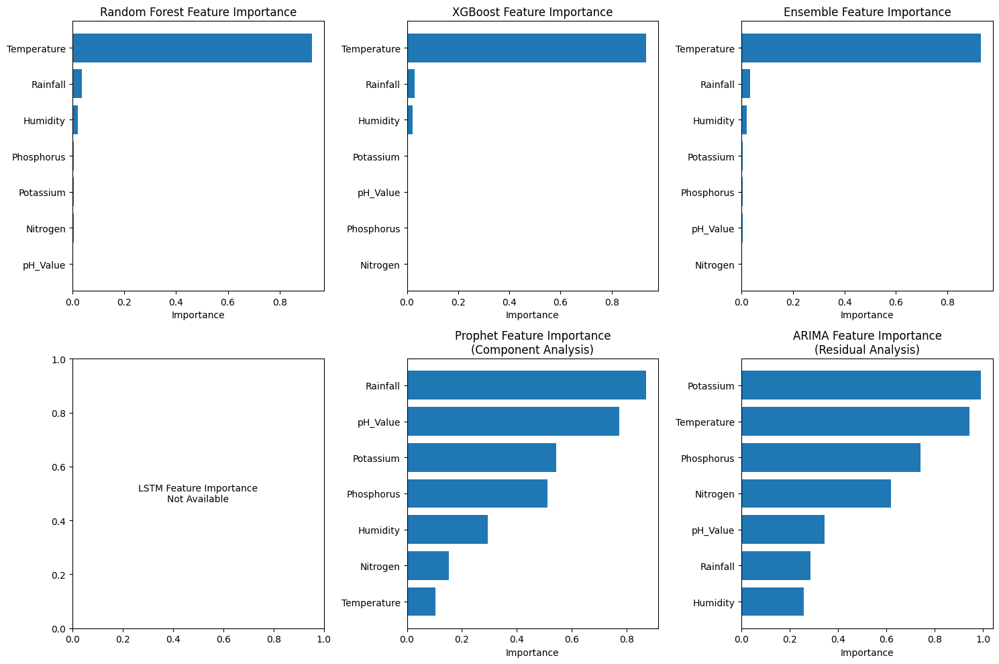


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


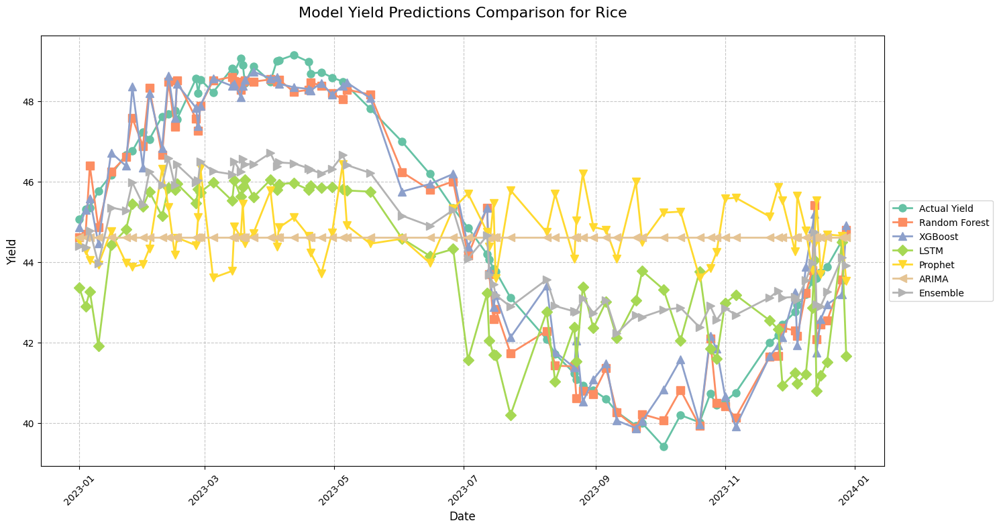


Plotting time comparison...
Forward filling 72 NaN values with previous row values


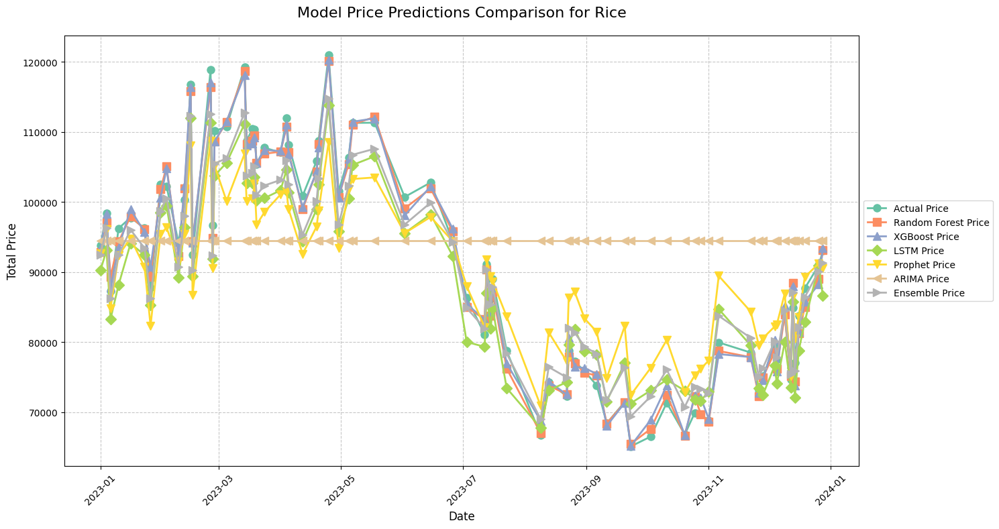


Model Insights:

Random Forest:
- RMSE: 0.71
- R2 Score: 0.95
- MAE: 0.57
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.80
- R2 Score: 0.93
- MAE: 0.65
- Captures non-linear feature relationships

LSTM:
- RMSE: 2.36
- R2 Score: 0.43
- MAE: 2.17
- Captures sequential patterns in the data

Prophet:
- RMSE: 3.30
- R2 Score: -0.11
- MAE: 2.92
- Accounts for seasonal trends

ARIMA:
- RMSE: 3.16
- R2 Score: -0.01
- MAE: 2.80
- Models time series dependencies

Ensemble:
- RMSE: 1.78
- R2 Score: 0.68
- MAE: 1.57

Analyzing Maize yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 2476.0649 - mae: 49.6357 - val_loss: 2497.9805 - val_mae: 49.8528
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2467.1687 - mae: 49.5499 - val_loss: 2494.2510 - val_mae: 49.8161
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2449.7783 - mae: 49.3698 - val_loss: 2490.0901 - val_mae: 49.7752
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2434.6

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/5mu82vud.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/mz2vu633.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91339', 'data', 'file=/tmp/tmprt5m2rxh/5mu82vud.json', 'init=/tmp/tmprt5m2rxh/mz2vu633.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelzxy8uhit/prophet_model-20241125061533.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:15:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:15:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.549    0.596  2.970    3.236  3.099     1.853
RMSE          0.679    0.746  3.310    3.655  3.492     2.124
R2            0.962    0.954  0.089   -0.111 -0.014     0.625

Plotting feature importance...


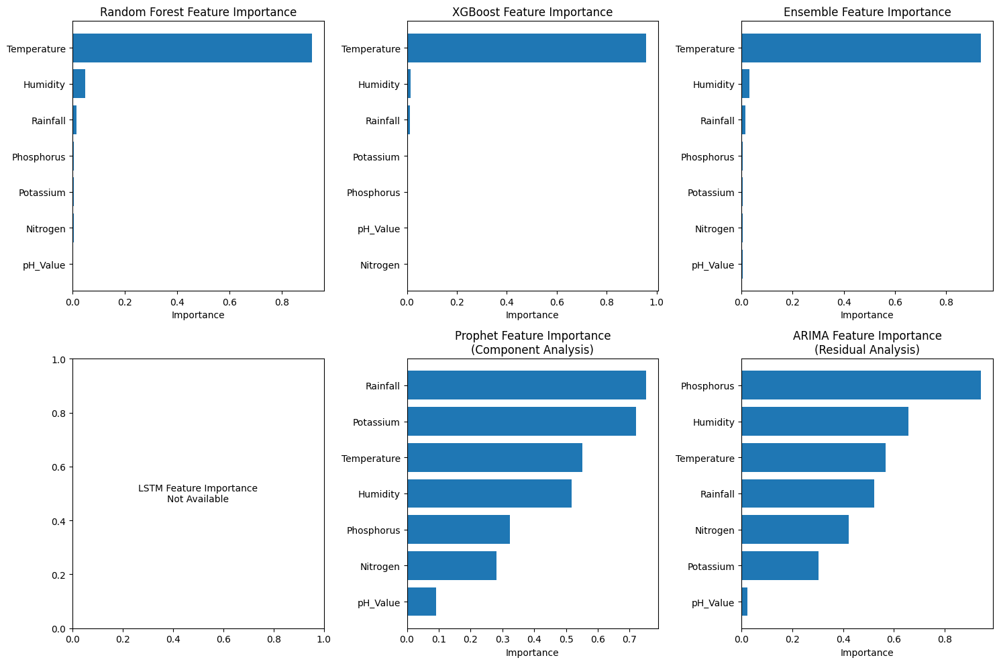


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


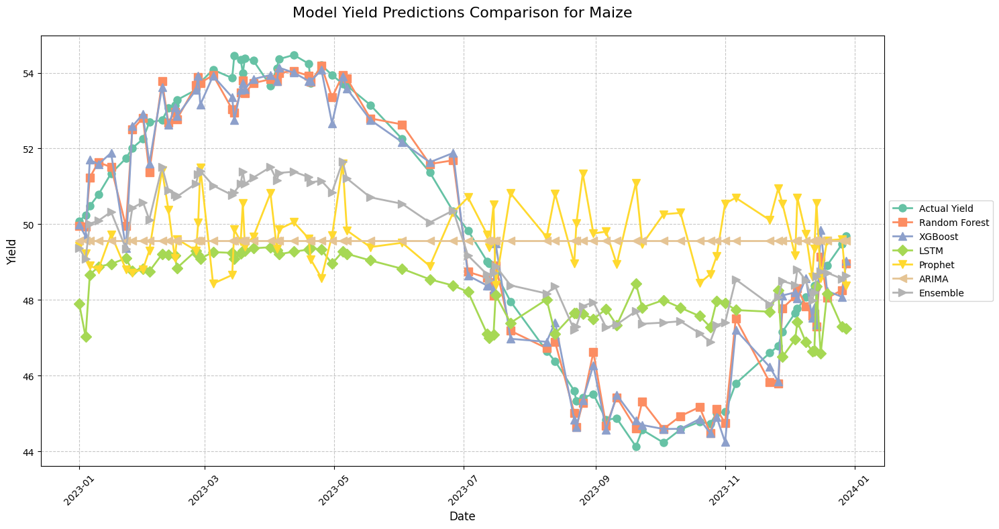


Plotting time comparison...
Forward filling 72 NaN values with previous row values


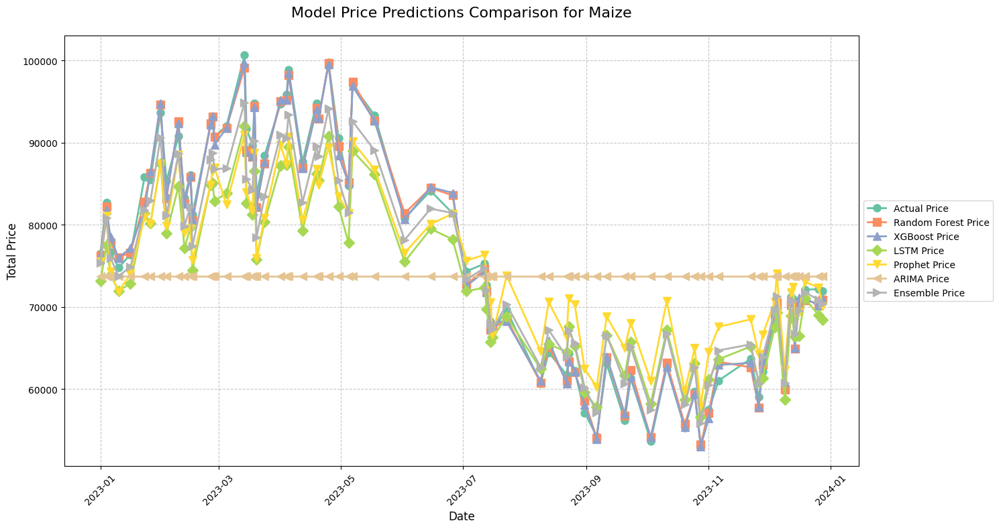


Model Insights:

Random Forest:
- RMSE: 0.68
- R2 Score: 0.96
- MAE: 0.55
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.75
- R2 Score: 0.95
- MAE: 0.60
- Captures non-linear feature relationships

LSTM:
- RMSE: 3.31
- R2 Score: 0.09
- MAE: 2.97
- Captures sequential patterns in the data

Prophet:
- RMSE: 3.65
- R2 Score: -0.11
- MAE: 3.24
- Accounts for seasonal trends

ARIMA:
- RMSE: 3.49
- R2 Score: -0.01
- MAE: 3.10
- Models time series dependencies

Ensemble:
- RMSE: 2.12
- R2 Score: 0.62
- MAE: 1.85

Analyzing ChickPea yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 394.3605 - mae: 19.8100 - val_loss: 398.2956 - val_mae: 19.9061
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 388.7085 - mae: 19.6649 - val_loss: 396.6929 - val_mae: 19.8661
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 387.1849 - mae: 19.6271 - val_loss: 394.8938 - val_mae: 19.8211
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 384.263

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/ornffvyy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/2vkizvev.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=602', 'data', 'file=/tmp/tmprt5m2rxh/ornffvyy.json', 'init=/tmp/tmprt5m2rxh/2vkizvev.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modellxzdm514/prophet_model-20241125061556.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:15:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:15:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.225    0.208  0.571    1.308  1.255     0.571
RMSE          0.289    0.275  0.757    1.479  1.417     0.645
R2            0.958    0.962  0.710   -0.104 -0.015     0.790

Plotting feature importance...


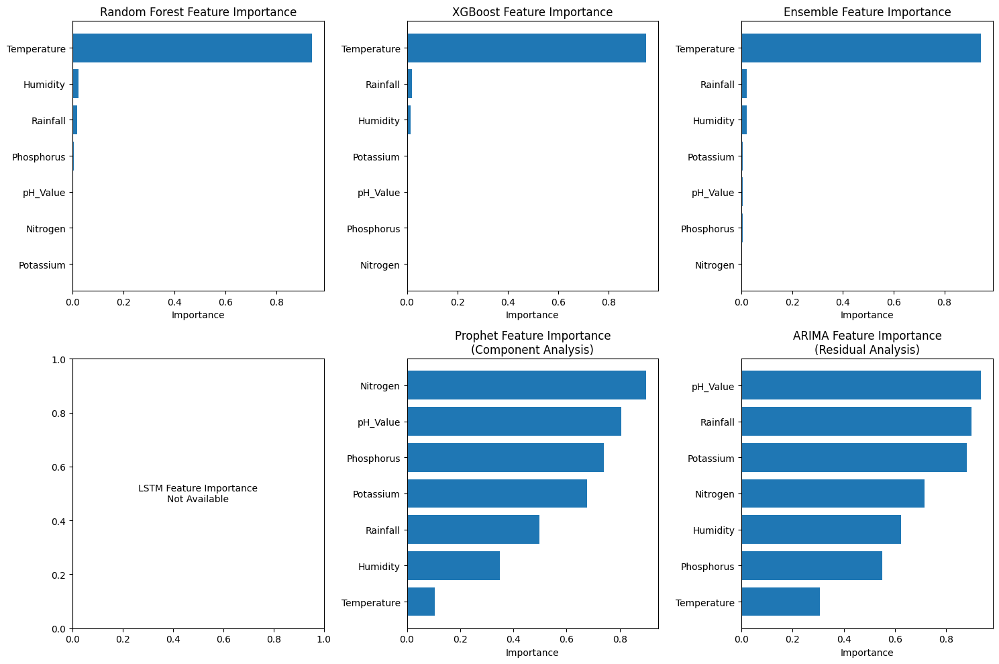


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


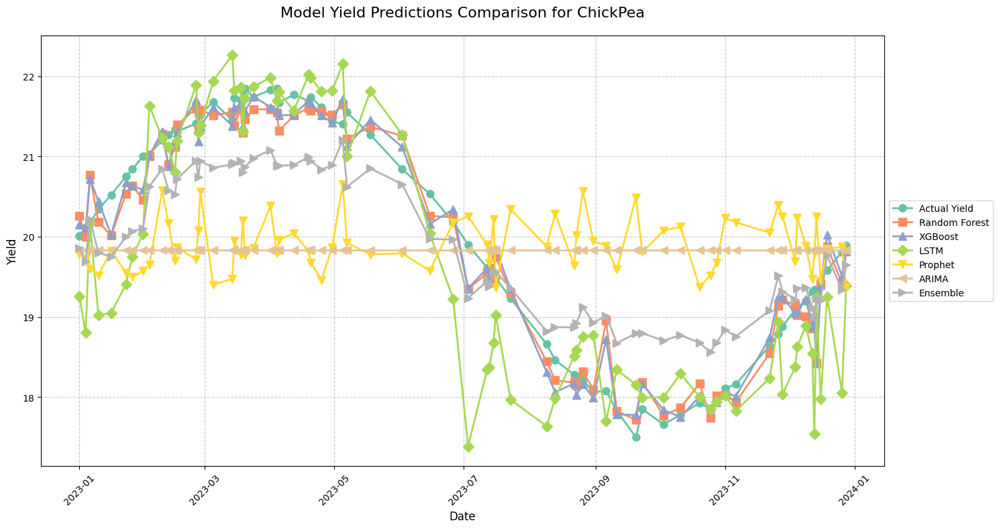


Plotting time comparison...
Forward filling 72 NaN values with previous row values


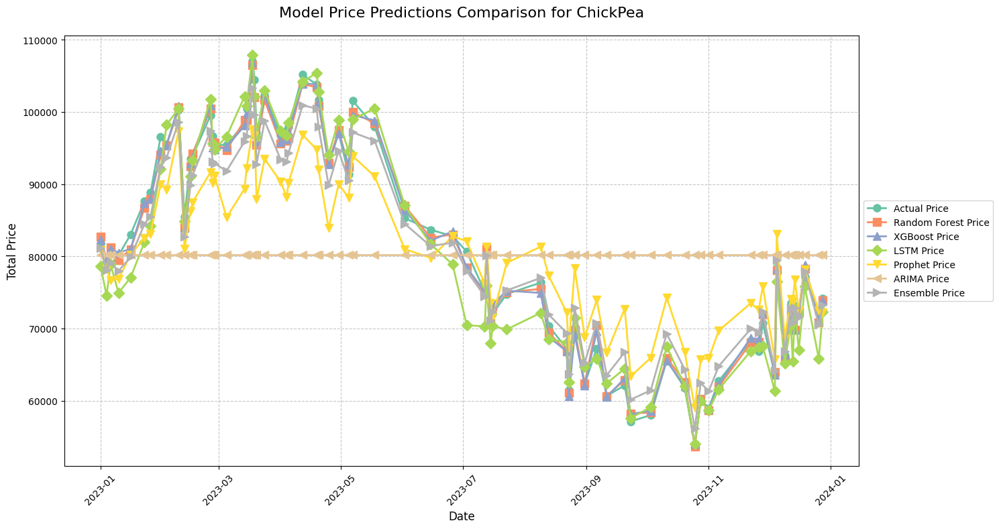


Model Insights:

Random Forest:
- RMSE: 0.29
- R2 Score: 0.96
- MAE: 0.22
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.28
- R2 Score: 0.96
- MAE: 0.21
- Captures non-linear feature relationships

LSTM:
- RMSE: 0.76
- R2 Score: 0.71
- MAE: 0.57
- Captures sequential patterns in the data

Prophet:
- RMSE: 1.48
- R2 Score: -0.10
- MAE: 1.31
- Accounts for seasonal trends

ARIMA:
- RMSE: 1.42
- R2 Score: -0.01
- MAE: 1.25
- Models time series dependencies

Ensemble:
- RMSE: 0.65
- R2 Score: 0.79
- MAE: 0.57

Analyzing KidneyBeans yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 617.0201 - mae: 24.7760 - val_loss: 626.0041 - val_mae: 24.9583
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 612.6876 - mae: 24.6876 - val_loss: 625.0284 - val_mae: 24.9386
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 607.9401 - mae: 24.5907 - val_loss: 624.1038 - val_mae: 24.9199
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 609.3

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/tok618kt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/an5pe911.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37187', 'data', 'file=/tmp/tmprt5m2rxh/tok618kt.json', 'init=/tmp/tmprt5m2rxh/an5pe911.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modeldrqu6xhc/prophet_model-20241125061621.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:16:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:16:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.330    0.356  1.112    1.615  1.546     0.807
RMSE          0.430    0.458  1.241    1.824  1.745     0.956
R2            0.938    0.930  0.487   -0.108 -0.014     0.696

Plotting feature importance...


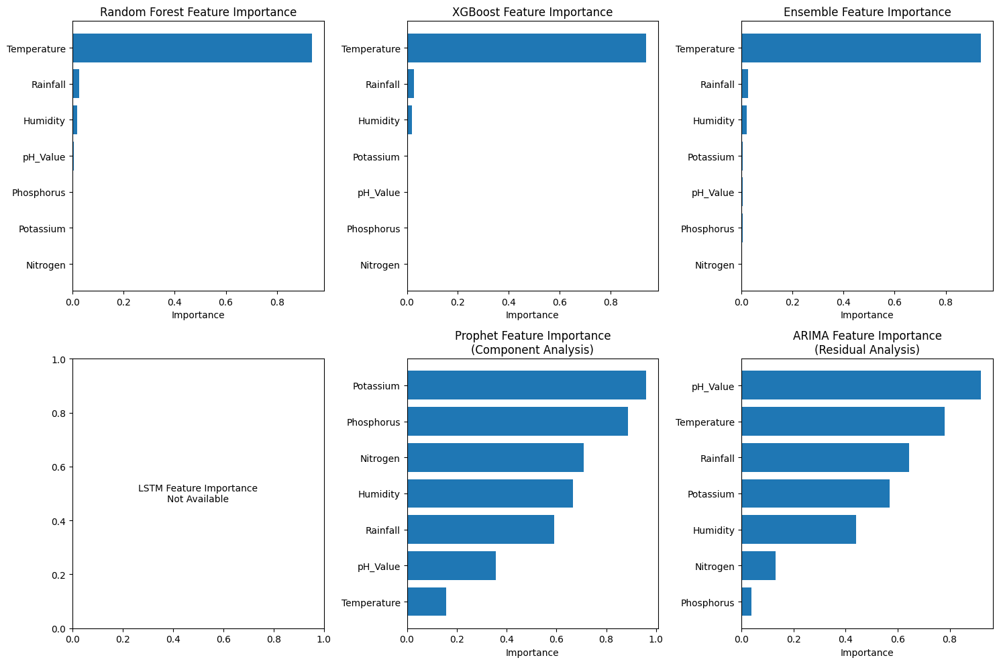


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


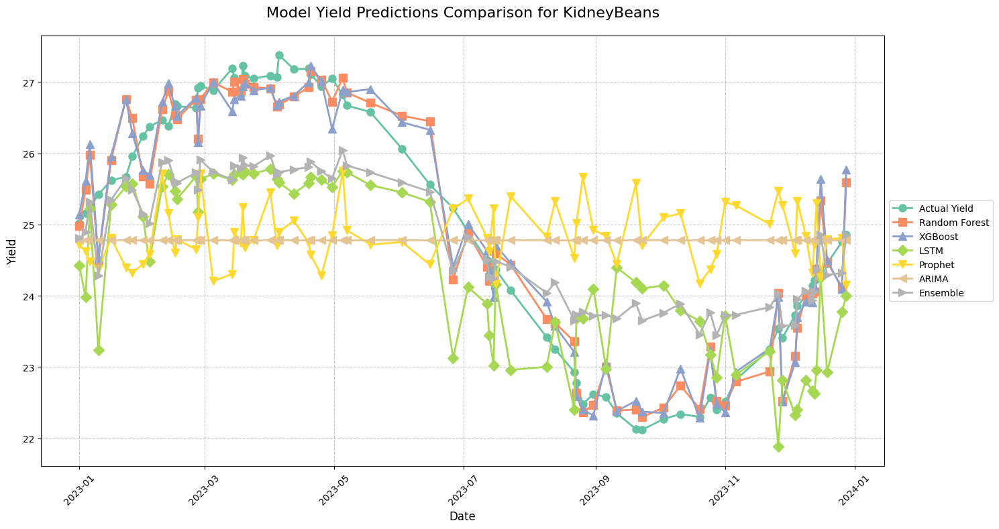


Plotting time comparison...
Forward filling 72 NaN values with previous row values


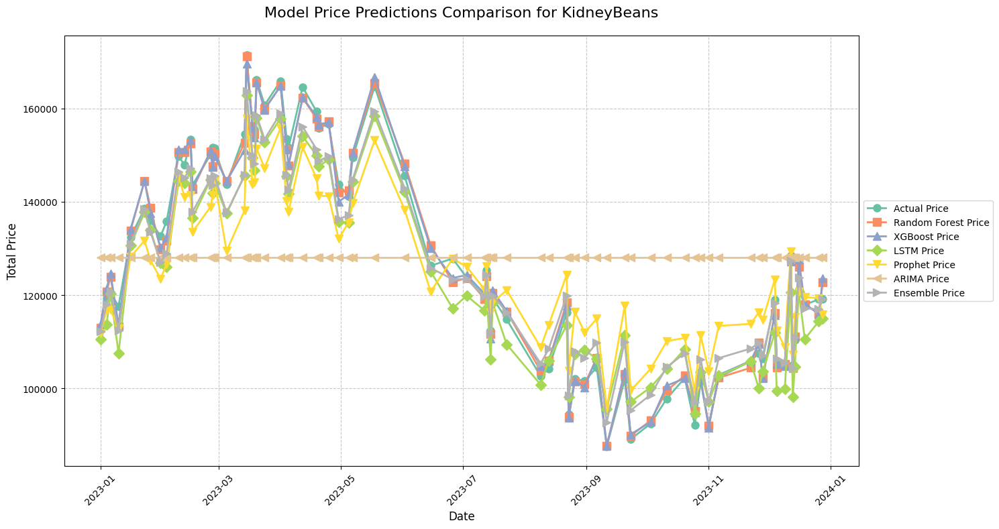


Model Insights:

Random Forest:
- RMSE: 0.43
- R2 Score: 0.94
- MAE: 0.33
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.46
- R2 Score: 0.93
- MAE: 0.36
- Captures non-linear feature relationships

LSTM:
- RMSE: 1.24
- R2 Score: 0.49
- MAE: 1.11
- Captures sequential patterns in the data

Prophet:
- RMSE: 1.82
- R2 Score: -0.11
- MAE: 1.61
- Accounts for seasonal trends

ARIMA:
- RMSE: 1.75
- R2 Score: -0.01
- MAE: 1.55
- Models time series dependencies

Ensemble:
- RMSE: 0.96
- R2 Score: 0.70
- MAE: 0.81

Analyzing PigeonPeas yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 321.3228 - mae: 17.8802 - val_loss: 322.6288 - val_mae: 17.9181
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 315.1927 - mae: 17.7108 - val_loss: 321.2661 - val_mae: 17.8809
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 315.2353 - mae: 17.7108 - val_loss: 319.7339 - val_mae: 17.8389
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 317.

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/_ntsh23c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/8kmzbh_w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45071', 'data', 'file=/tmp/tmprt5m2rxh/_ntsh23c.json', 'init=/tmp/tmprt5m2rxh/8kmzbh_w.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelckqe0vei/prophet_model-20241125061647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:16:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:16:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.172    0.185  0.581    1.174  1.125     0.511
RMSE          0.224    0.244  0.723    1.327  1.271     0.586
R2            0.968    0.963  0.672   -0.104 -0.014     0.785

Plotting feature importance...


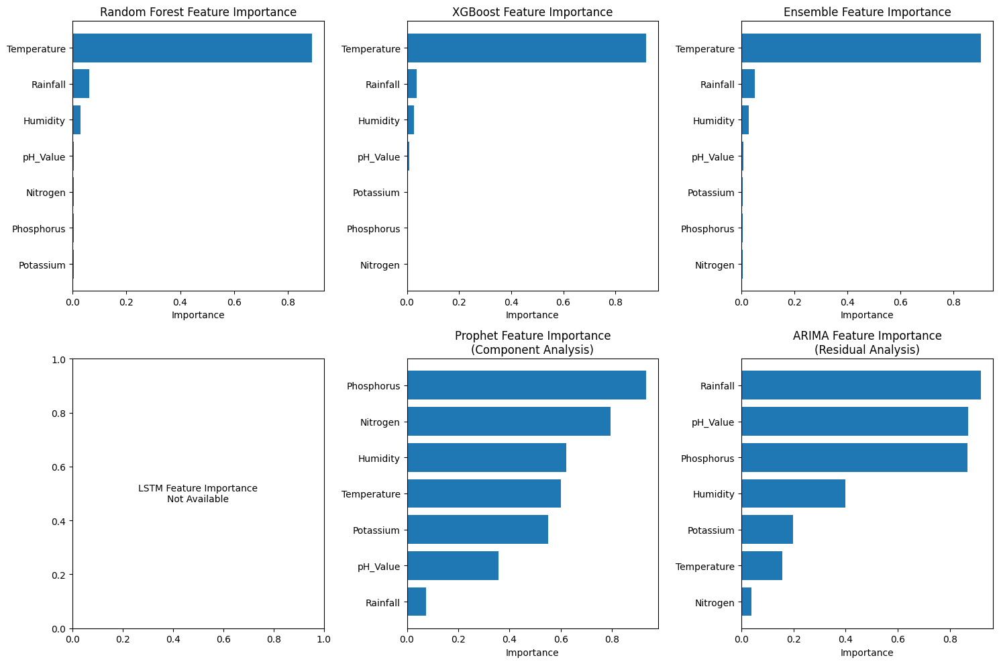


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


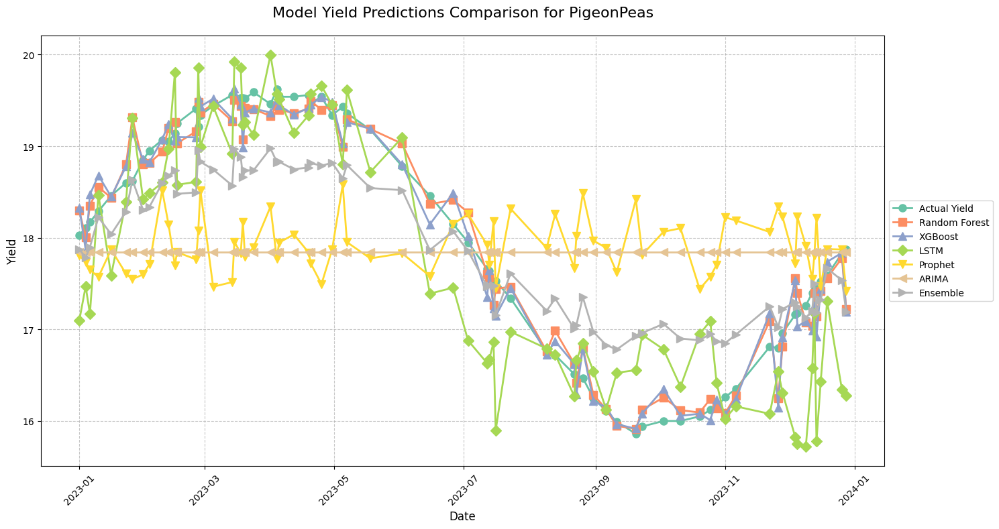


Plotting time comparison...
Forward filling 72 NaN values with previous row values


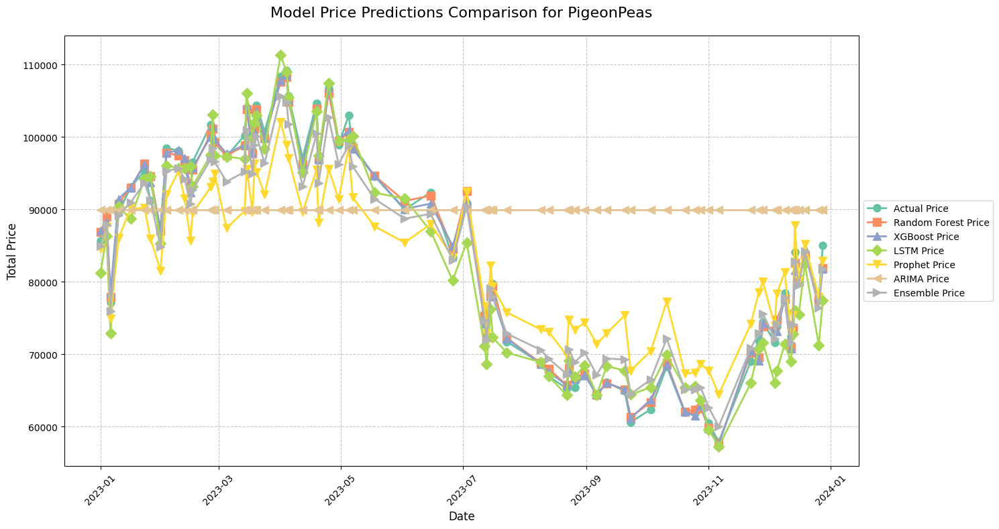


Model Insights:

Random Forest:
- RMSE: 0.22
- R2 Score: 0.97
- MAE: 0.17
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.24
- R2 Score: 0.96
- MAE: 0.19
- Captures non-linear feature relationships

LSTM:
- RMSE: 0.72
- R2 Score: 0.67
- MAE: 0.58
- Captures sequential patterns in the data

Prophet:
- RMSE: 1.33
- R2 Score: -0.10
- MAE: 1.17
- Accounts for seasonal trends

ARIMA:
- RMSE: 1.27
- R2 Score: -0.01
- MAE: 1.13
- Models time series dependencies

Ensemble:
- RMSE: 0.59
- R2 Score: 0.78
- MAE: 0.51

Analyzing MothBeans yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 220.8817 - mae: 14.8236 - val_loss: 224.1692 - val_mae: 14.9354
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 220.4742 - mae: 14.8120 - val_loss: 222.9298 - val_mae: 14.8942
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 218.3317 - mae: 14.7385 - val_loss: 221.5463 - val_mae: 14.8480
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 217.8

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/zol6_m5u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/e6cxb4uz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82467', 'data', 'file=/tmp/tmprt5m2rxh/zol6_m5u.json', 'init=/tmp/tmprt5m2rxh/e6cxb4uz.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelshnediie/prophet_model-20241125061714.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:17:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:17:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.177    0.172  0.599    0.972  0.933     0.438
RMSE          0.239    0.230  0.745    1.099  1.051     0.495
R2            0.947    0.951  0.490   -0.109 -0.015     0.775

Plotting feature importance...


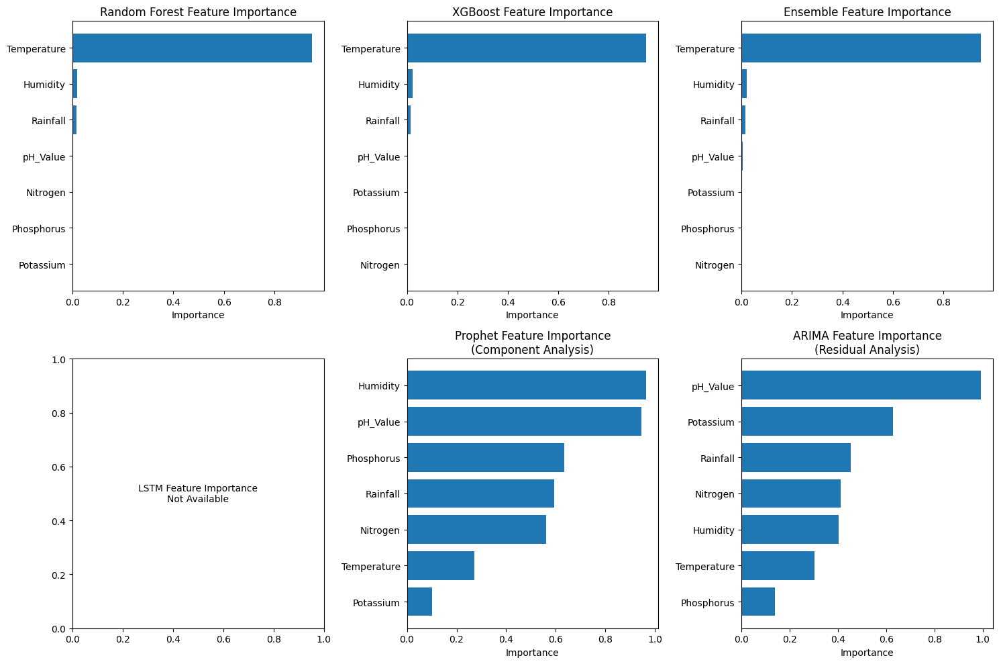


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


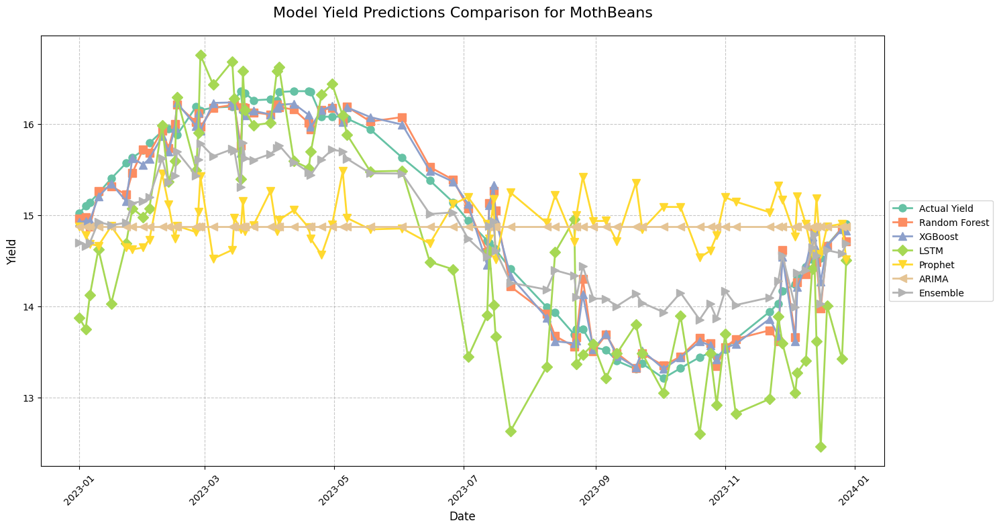


Plotting time comparison...
Forward filling 72 NaN values with previous row values


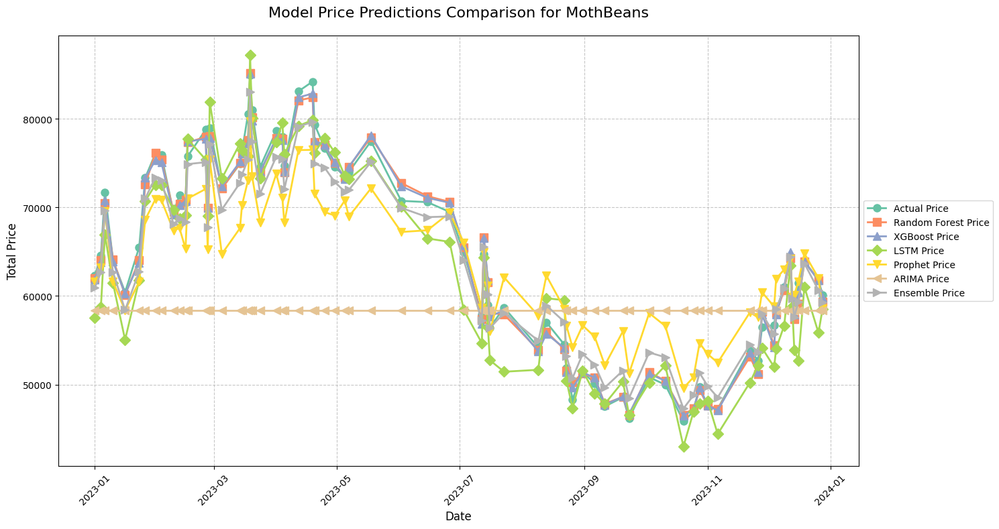


Model Insights:

Random Forest:
- RMSE: 0.24
- R2 Score: 0.95
- MAE: 0.18
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.23
- R2 Score: 0.95
- MAE: 0.17
- Captures non-linear feature relationships

LSTM:
- RMSE: 0.75
- R2 Score: 0.49
- MAE: 0.60
- Captures sequential patterns in the data

Prophet:
- RMSE: 1.10
- R2 Score: -0.11
- MAE: 0.97
- Accounts for seasonal trends

ARIMA:
- RMSE: 1.05
- R2 Score: -0.01
- MAE: 0.93
- Models time series dependencies

Ensemble:
- RMSE: 0.49
- R2 Score: 0.78
- MAE: 0.44

Analyzing MungBean yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 140.3252 - mae: 11.8145 - val_loss: 142.6831 - val_mae: 11.9144
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 138.1335 - mae: 11.7213 - val_loss: 141.3902 - val_mae: 11.8602
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 137.4022 - mae: 11.6914 - val_loss: 139.9006 - val_mae: 11.7974
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 136.95

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/ckedy8ni.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/qztuwvno.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20101', 'data', 'file=/tmp/tmprt5m2rxh/ckedy8ni.json', 'init=/tmp/tmprt5m2rxh/qztuwvno.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelwhwn_y0h/prophet_model-20241125061743.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:17:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:17:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.153    0.184  0.375    0.773  0.741     0.350
RMSE          0.205    0.247  0.467    0.874  0.835     0.389
R2            0.939    0.911  0.683   -0.111 -0.014     0.780

Plotting feature importance...


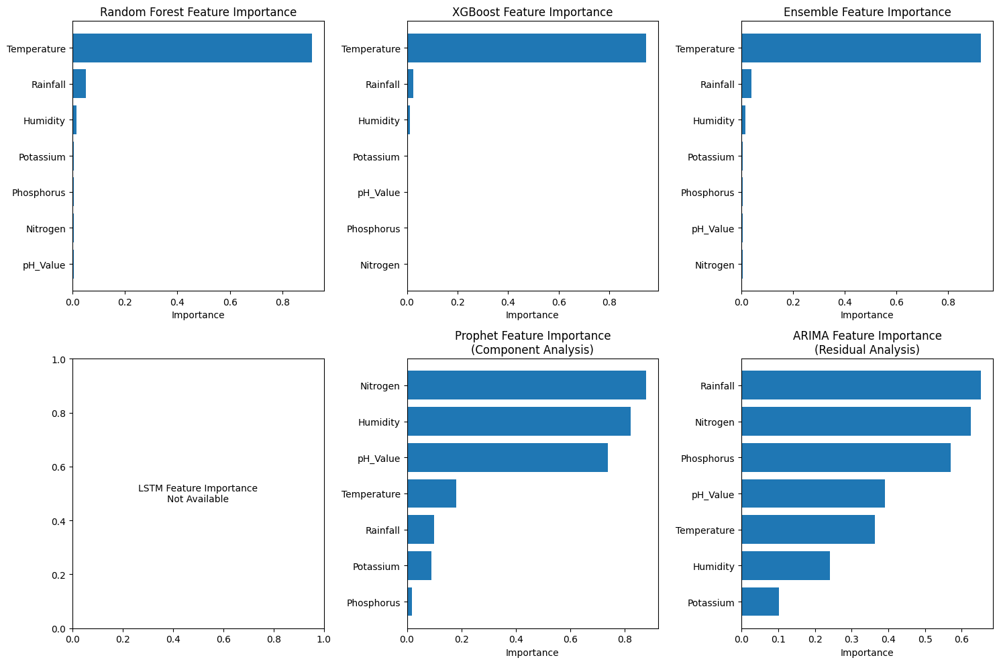


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


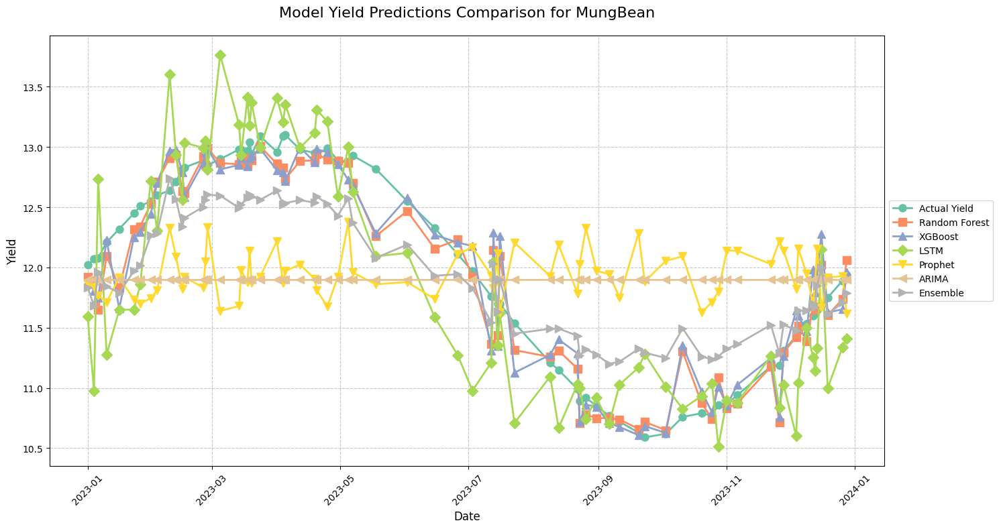


Plotting time comparison...
Forward filling 72 NaN values with previous row values


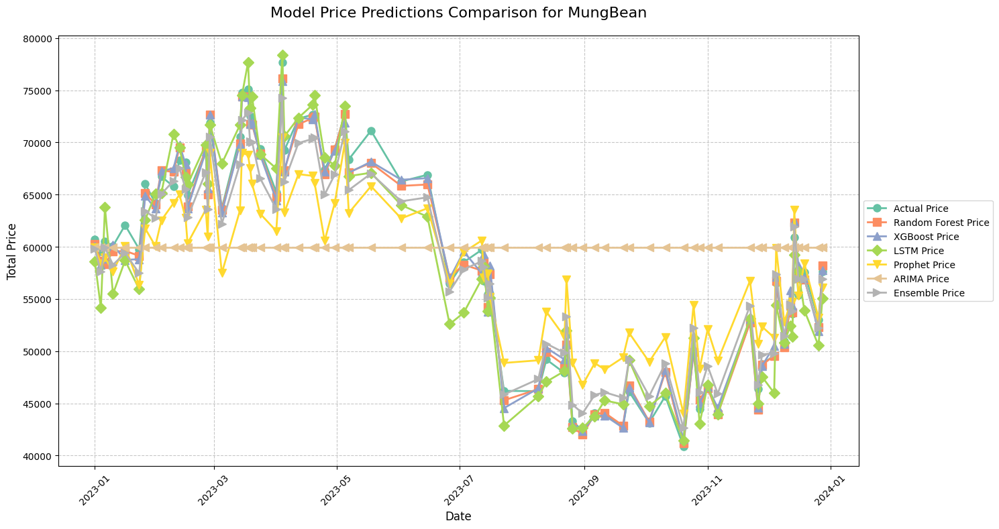


Model Insights:

Random Forest:
- RMSE: 0.20
- R2 Score: 0.94
- MAE: 0.15
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.25
- R2 Score: 0.91
- MAE: 0.18
- Captures non-linear feature relationships

LSTM:
- RMSE: 0.47
- R2 Score: 0.68
- MAE: 0.38
- Captures sequential patterns in the data

Prophet:
- RMSE: 0.87
- R2 Score: -0.11
- MAE: 0.77
- Accounts for seasonal trends

ARIMA:
- RMSE: 0.83
- R2 Score: -0.01
- MAE: 0.74
- Models time series dependencies

Ensemble:
- RMSE: 0.39
- R2 Score: 0.78
- MAE: 0.35

Analyzing Blackgram yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 193.0906 - mae: 13.8593 - val_loss: 195.2803 - val_mae: 13.9396
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 193.3154 - mae: 13.8694 - val_loss: 194.3943 - val_mae: 13.9083
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 189.5224 - mae: 13.7317 - val_loss: 193.5153 - val_mae: 13.8771
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 189.9

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/yxacxc9s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/3vmobl0y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88475', 'data', 'file=/tmp/tmprt5m2rxh/yxacxc9s.json', 'init=/tmp/tmprt5m2rxh/3vmobl0y.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelflyyr0oi/prophet_model-20241125061813.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:18:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:18:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.153    0.169  0.315    0.902  0.866     0.356
RMSE          0.198    0.212  0.394    1.018  0.974     0.419
R2            0.958    0.952  0.834   -0.105 -0.012     0.813

Plotting feature importance...


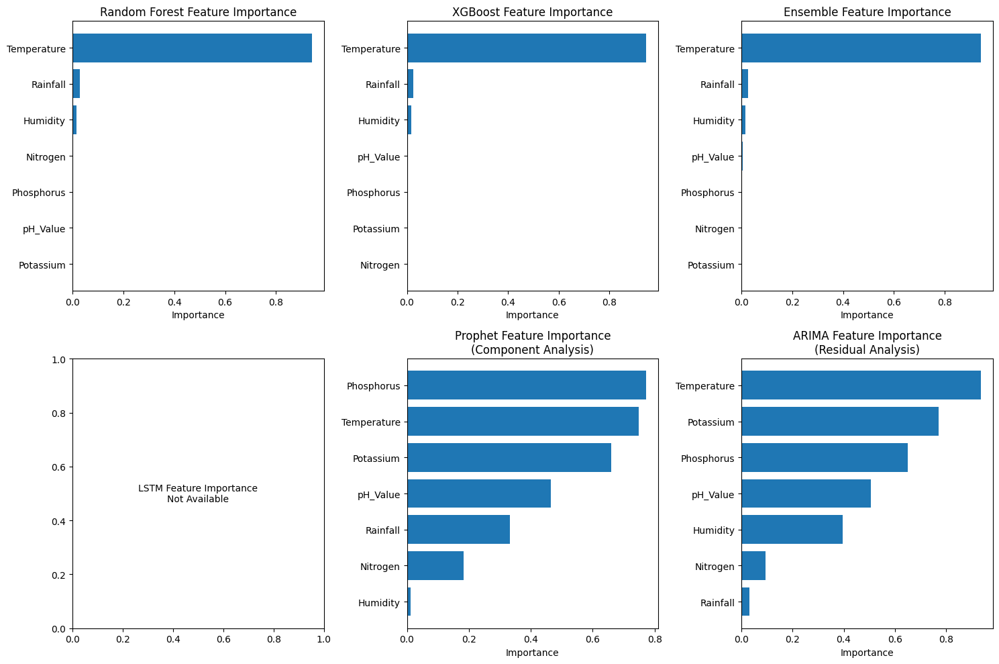


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


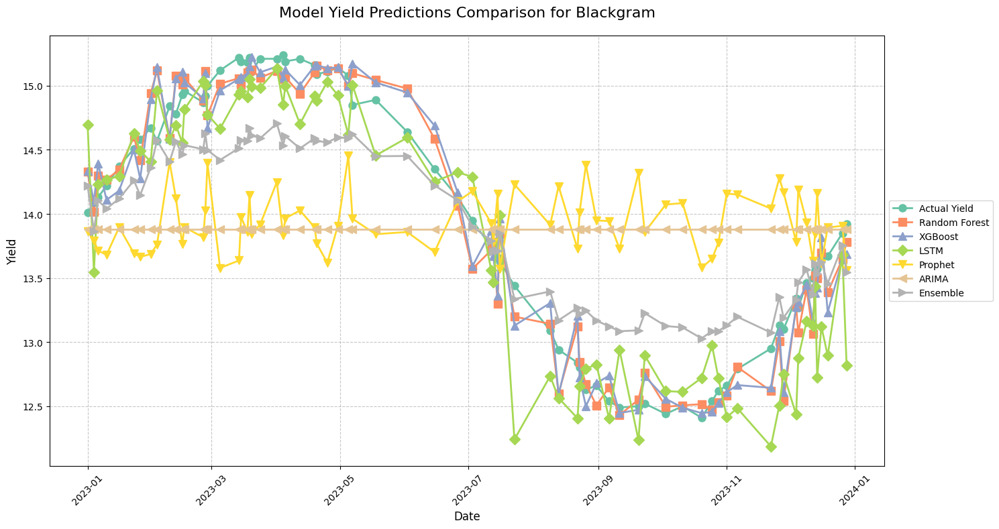


Plotting time comparison...
Forward filling 72 NaN values with previous row values


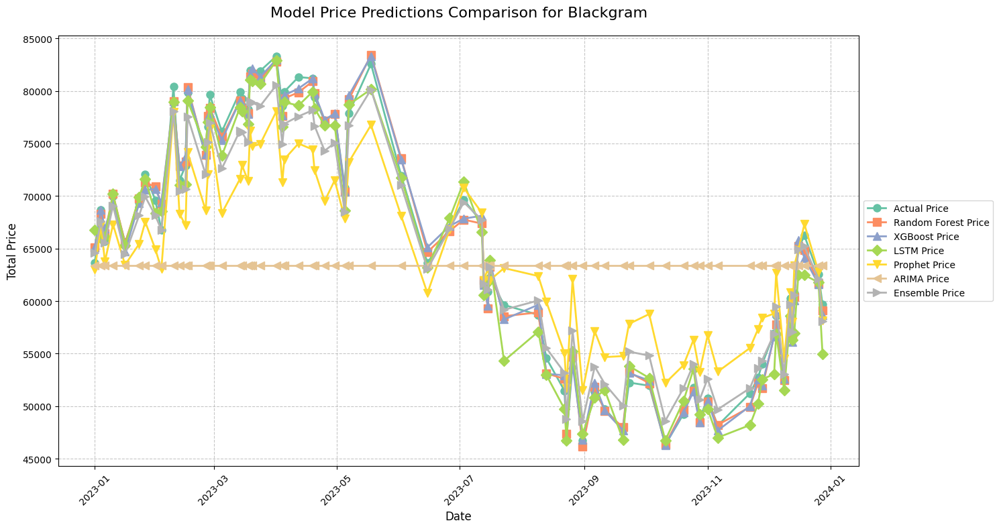


Model Insights:

Random Forest:
- RMSE: 0.20
- R2 Score: 0.96
- MAE: 0.15
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.21
- R2 Score: 0.95
- MAE: 0.17
- Captures non-linear feature relationships

LSTM:
- RMSE: 0.39
- R2 Score: 0.83
- MAE: 0.32
- Captures sequential patterns in the data

Prophet:
- RMSE: 1.02
- R2 Score: -0.10
- MAE: 0.90
- Accounts for seasonal trends

ARIMA:
- RMSE: 0.97
- R2 Score: -0.01
- MAE: 0.87
- Models time series dependencies

Ensemble:
- RMSE: 0.42
- R2 Score: 0.81
- MAE: 0.36

Analyzing Lentil yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - loss: 254.6690 - mae: 15.9196 - val_loss: 255.5113 - val_mae: 15.9426
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 249.0513 - mae: 15.7383 - val_loss: 254.5457 - val_mae: 15.9115
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 251.1939 - mae: 15.8054 - val_loss: 253.4250 - val_mae: 15.8756
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 250.352

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/9__rbc6m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/lallb_xc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99147', 'data', 'file=/tmp/tmprt5m2rxh/9__rbc6m.json', 'init=/tmp/tmprt5m2rxh/lallb_xc.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelmdgs_lb5/prophet_model-20241125061844.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:18:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:18:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.200    0.209  0.499    1.034  0.989     0.442
RMSE          0.256    0.267  0.666    1.166  1.117     0.521
R2            0.947    0.942  0.639   -0.105 -0.013     0.779

Plotting feature importance...


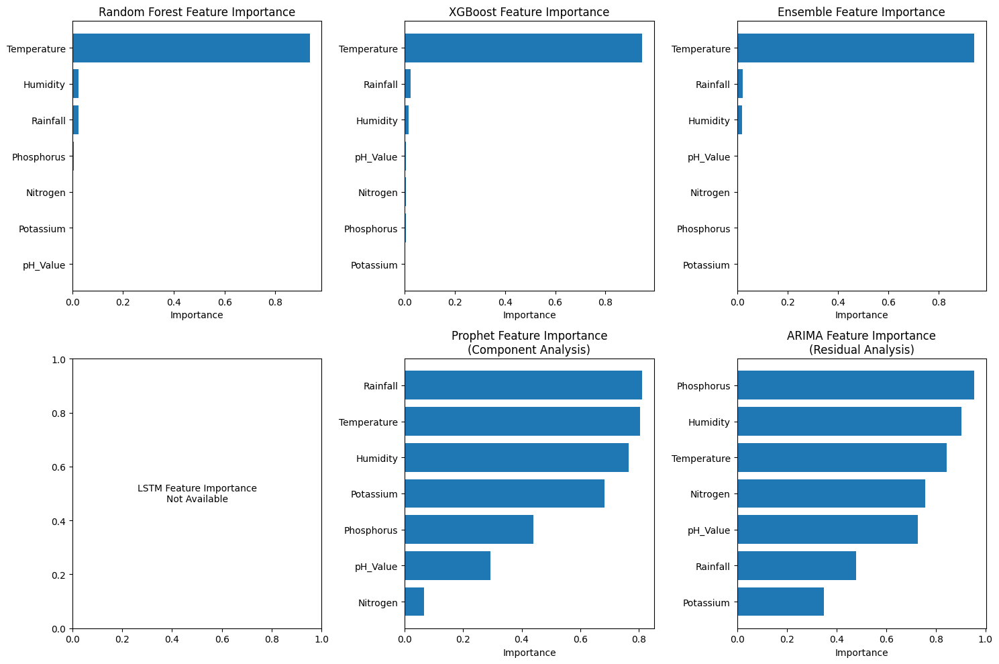


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


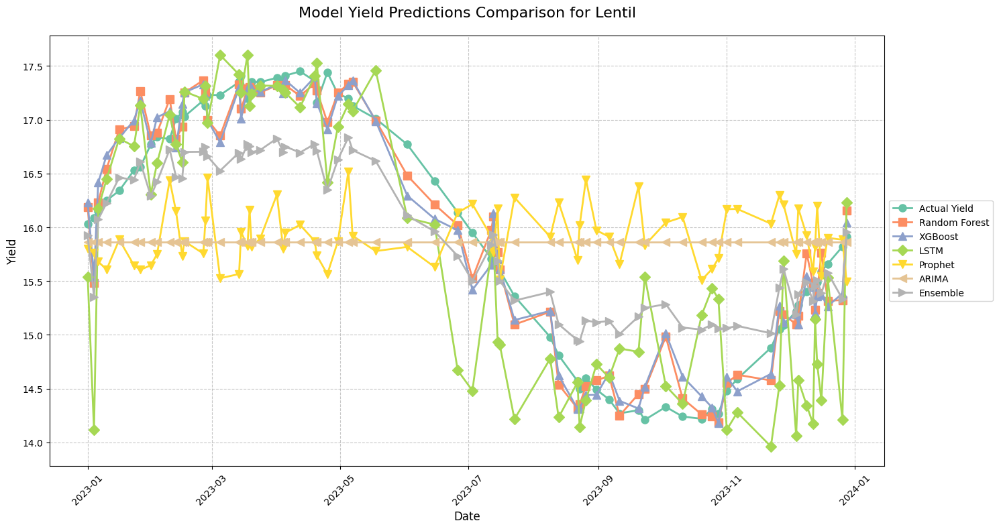


Plotting time comparison...
Forward filling 72 NaN values with previous row values


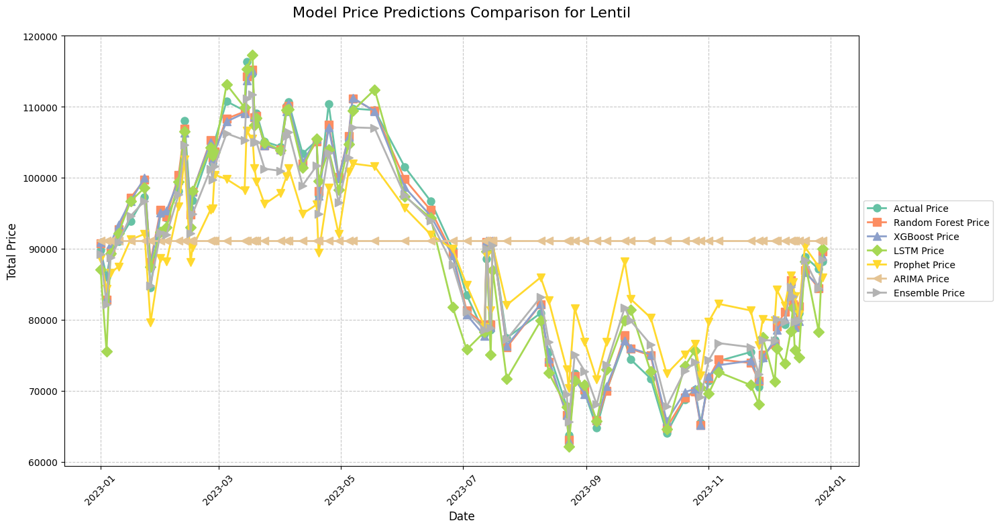


Model Insights:

Random Forest:
- RMSE: 0.26
- R2 Score: 0.95
- MAE: 0.20
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.27
- R2 Score: 0.94
- MAE: 0.21
- Captures non-linear feature relationships

LSTM:
- RMSE: 0.67
- R2 Score: 0.64
- MAE: 0.50
- Captures sequential patterns in the data

Prophet:
- RMSE: 1.17
- R2 Score: -0.10
- MAE: 1.03
- Accounts for seasonal trends

ARIMA:
- RMSE: 1.12
- R2 Score: -0.01
- MAE: 0.99
- Models time series dependencies

Ensemble:
- RMSE: 0.52
- R2 Score: 0.78
- MAE: 0.44

Analyzing Pomegranate yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 22080.6445 - mae: 148.2272 - val_loss: 22493.3164 - val_mae: 149.5961
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 22106.0176 - mae: 148.3062 - val_loss: 22478.4414 - val_mae: 149.5465
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 22266.3809 - mae: 148.8273 - val_loss: 22461.6523 - val_mae: 149.4903
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12m

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/n4uy9z4a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/7k4k46v_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67781', 'data', 'file=/tmp/tmprt5m2rxh/n4uy9z4a.json', 'init=/tmp/tmprt5m2rxh/7k4k46v_.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_model5h1hsnm6/prophet_model-20241125061919.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:19:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:19:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost    LSTM  Prophet   ARIMA  Ensemble
MAE           1.779    1.988  16.692    9.647   9.230     6.474
RMSE          2.224    2.487  19.512   10.875  10.388     7.476
R2            0.953    0.942  -2.584   -0.113  -0.016     0.474

Plotting feature importance...


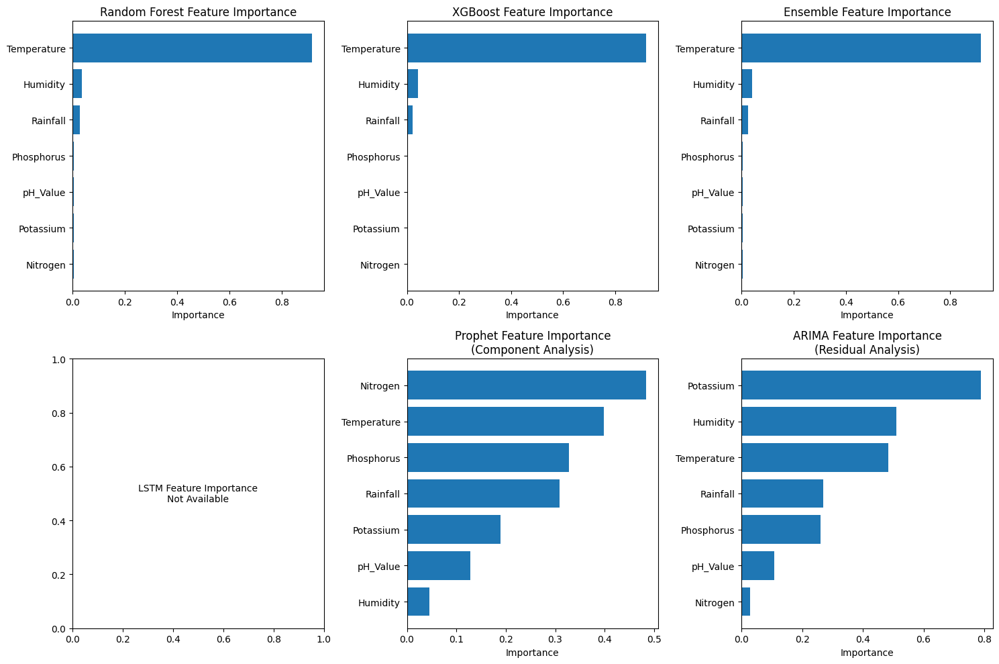


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


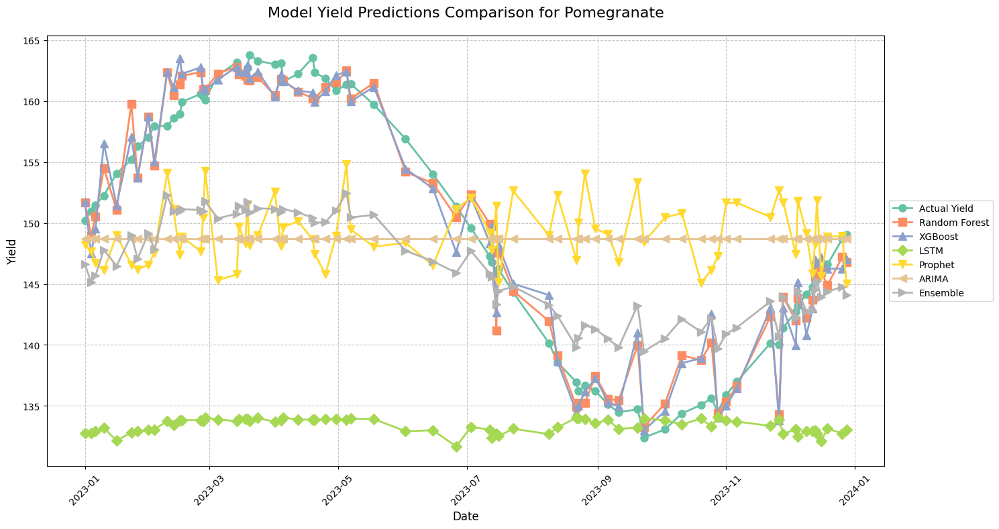


Plotting time comparison...
Forward filling 72 NaN values with previous row values


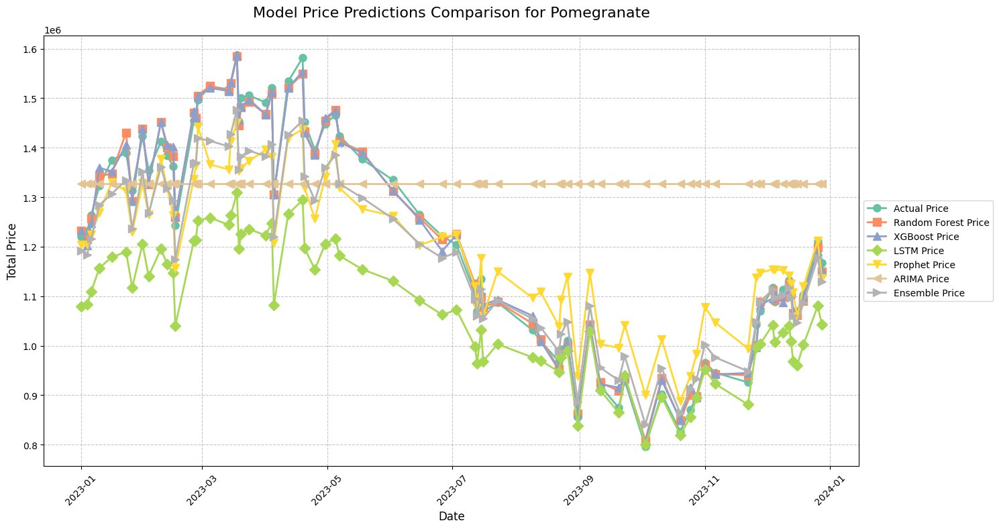


Model Insights:

Random Forest:
- RMSE: 2.22
- R2 Score: 0.95
- MAE: 1.78
- Captures non-linear feature relationships

XGBoost:
- RMSE: 2.49
- R2 Score: 0.94
- MAE: 1.99
- Captures non-linear feature relationships

LSTM:
- RMSE: 19.51
- R2 Score: -2.58
- MAE: 16.69
- Captures sequential patterns in the data

Prophet:
- RMSE: 10.88
- R2 Score: -0.11
- MAE: 9.65
- Accounts for seasonal trends

ARIMA:
- RMSE: 10.39
- R2 Score: -0.02
- MAE: 9.23
- Models time series dependencies

Ensemble:
- RMSE: 7.48
- R2 Score: 0.47
- MAE: 6.47

Analyzing Banana yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 157456.7656 - mae: 395.7879 - val_loss: 160143.2188 - val_mae: 399.1745
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 157968.2188 - mae: 396.4123 - val_loss: 160121.8906 - val_mae: 399.1483
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 156856.4844 - mae: 395.0080 - val_loss: 160098.7500 - val_mae: 399.1198
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/09i4bt8s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/yovtvkmu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54767', 'data', 'file=/tmp/tmprt5m2rxh/09i4bt8s.json', 'init=/tmp/tmprt5m2rxh/yovtvkmu.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelyi4v2dum/prophet_model-20241125061953.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:19:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:19:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost     LSTM  Prophet   ARIMA  Ensemble
MAE           5.715    5.826  311.215   26.166  24.968    63.620
RMSE          7.526    7.438  312.465   29.491  28.165    66.134
R2            0.928    0.929 -123.899   -0.113  -0.015    -4.595

Plotting feature importance...


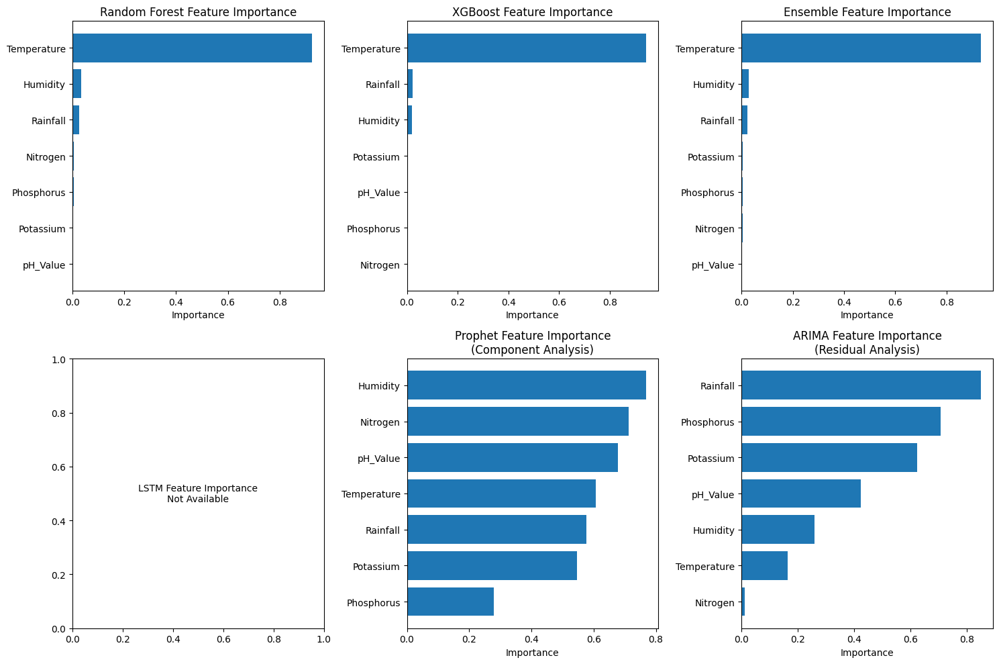


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


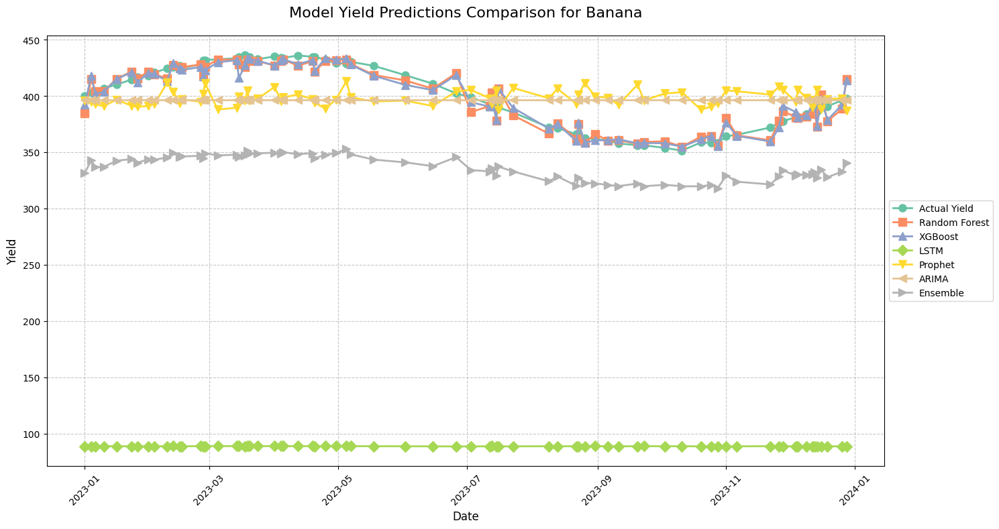


Plotting time comparison...
Forward filling 72 NaN values with previous row values


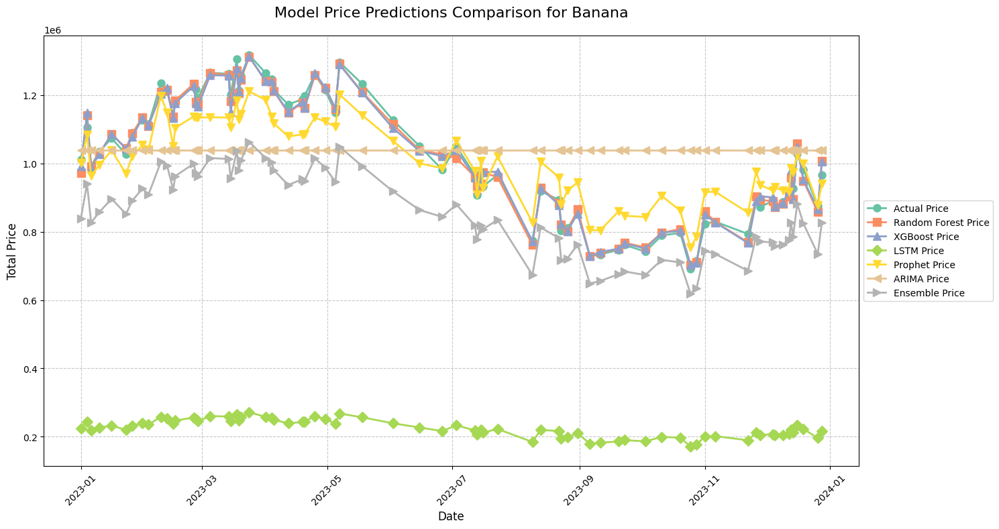


Model Insights:

Random Forest:
- RMSE: 7.53
- R2 Score: 0.93
- MAE: 5.72
- Captures non-linear feature relationships

XGBoost:
- RMSE: 7.44
- R2 Score: 0.93
- MAE: 5.83
- Captures non-linear feature relationships

LSTM:
- RMSE: 312.46
- R2 Score: -123.90
- MAE: 311.21
- Captures sequential patterns in the data

Prophet:
- RMSE: 29.49
- R2 Score: -0.11
- MAE: 26.17
- Accounts for seasonal trends

ARIMA:
- RMSE: 28.17
- R2 Score: -0.01
- MAE: 24.97
- Models time series dependencies

Ensemble:
- RMSE: 66.13
- R2 Score: -4.60
- MAE: 63.62

Analyzing Mango yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 9843.8994 - mae: 98.9551 - val_loss: 10001.4658 - val_mae: 99.7500
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 9776.7891 - mae: 98.6253 - val_loss: 9992.4766 - val_mae: 99.7063
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 9920.2783 - mae: 99.3556 - val_loss: 9981.8320 - val_mae: 99.6545
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/tgij1gwj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/tjpb1da6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72547', 'data', 'file=/tmp/tmprt5m2rxh/tgij1gwj.json', 'init=/tmp/tmprt5m2rxh/tjpb1da6.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelu7gz_40c/prophet_model-20241125062025.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:20:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:20:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           1.275    1.388  5.678    6.478  6.216     3.772
RMSE          1.621    1.764  6.674    7.333  7.020     4.339
R2            0.946    0.936  0.083   -0.106 -0.014     0.613

Plotting feature importance...


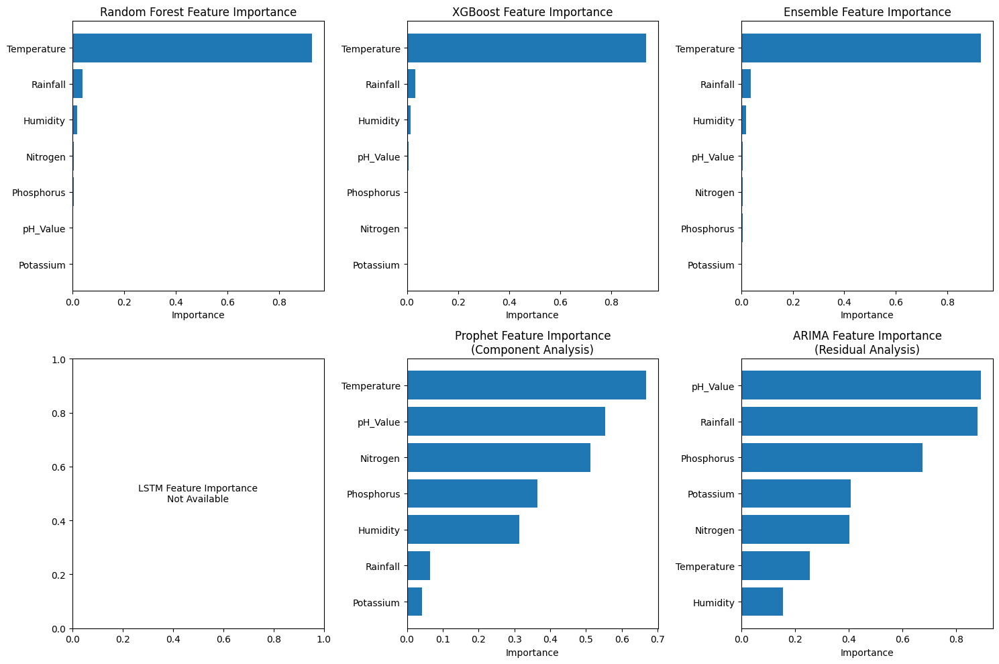


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


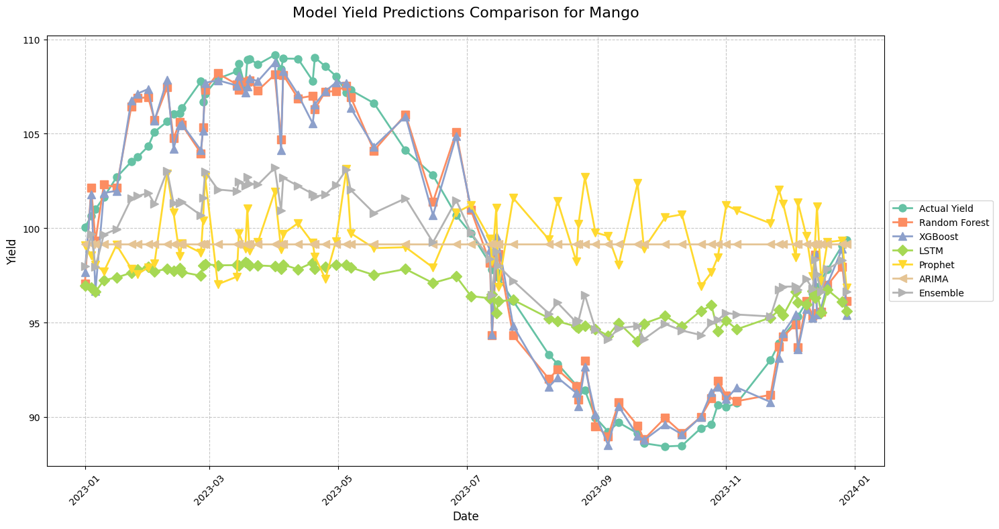


Plotting time comparison...
Forward filling 72 NaN values with previous row values


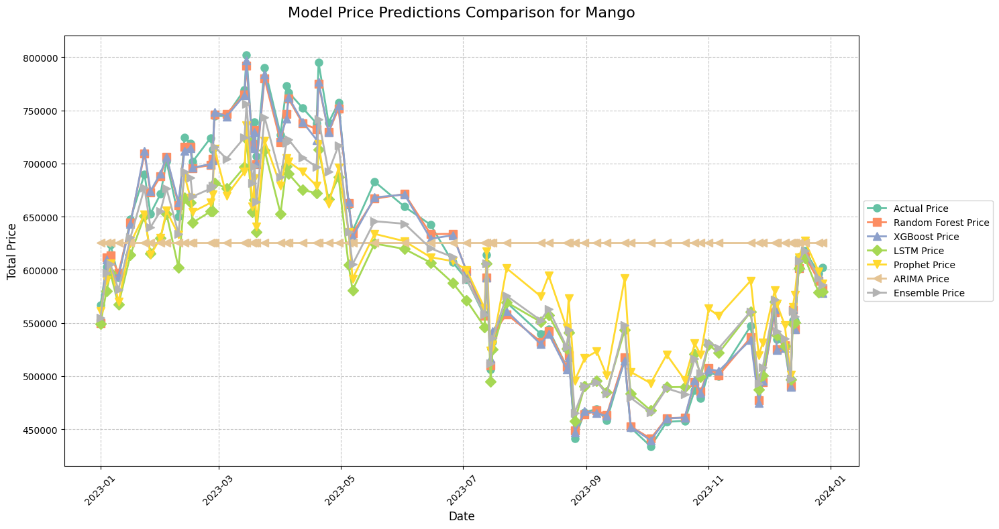


Model Insights:

Random Forest:
- RMSE: 1.62
- R2 Score: 0.95
- MAE: 1.28
- Captures non-linear feature relationships

XGBoost:
- RMSE: 1.76
- R2 Score: 0.94
- MAE: 1.39
- Captures non-linear feature relationships

LSTM:
- RMSE: 6.67
- R2 Score: 0.08
- MAE: 5.68
- Captures sequential patterns in the data

Prophet:
- RMSE: 7.33
- R2 Score: -0.11
- MAE: 6.48
- Accounts for seasonal trends

ARIMA:
- RMSE: 7.02
- R2 Score: -0.01
- MAE: 6.22
- Models time series dependencies

Ensemble:
- RMSE: 4.34
- R2 Score: 0.61
- MAE: 3.77

Analyzing Grapes yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 61652.8555 - mae: 247.6786 - val_loss: 62672.8477 - val_mae: 249.7107
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 61331.2500 - mae: 247.0247 - val_loss: 62659.3320 - val_mae: 249.6832
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 62127.2422 - mae: 248.6410 - val_loss: 62644.4336 - val_mae: 249.6530
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/ste

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/nr_d68ay.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/r3tvq7u1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41525', 'data', 'file=/tmp/tmprt5m2rxh/nr_d68ay.json', 'init=/tmp/tmprt5m2rxh/r3tvq7u1.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_model3_j437sn/prophet_model-20241125062105.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:21:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:21:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost     LSTM  Prophet   ARIMA  Ensemble
MAE           2.731    2.829  125.000   16.280  15.630    25.681
RMSE          3.449    3.524  126.234   18.432  17.685    27.896
R2            0.962    0.960  -50.544   -0.099  -0.012    -1.517

Plotting feature importance...


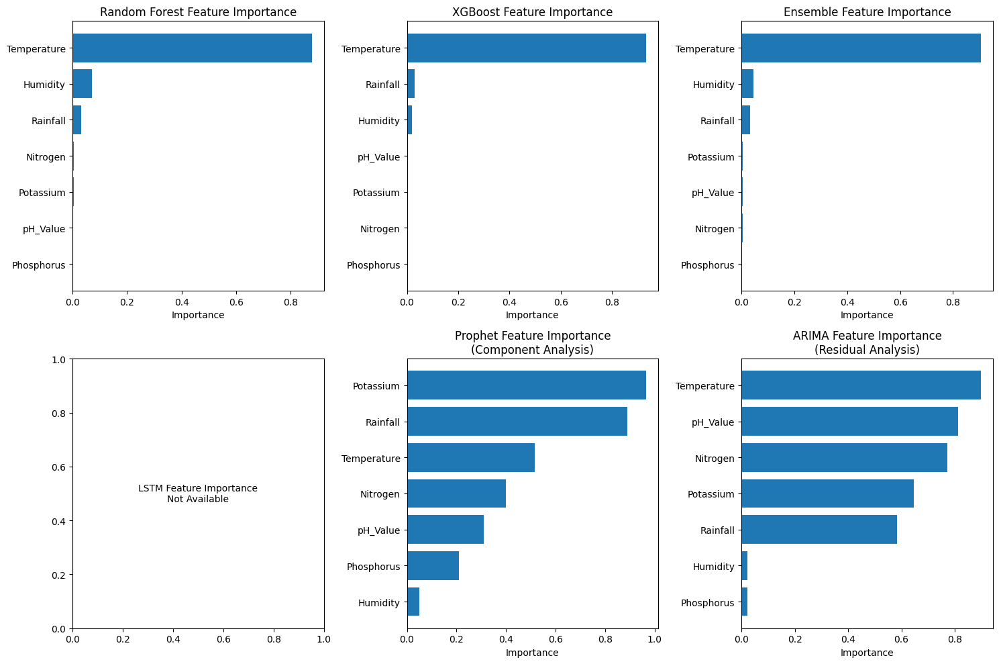


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


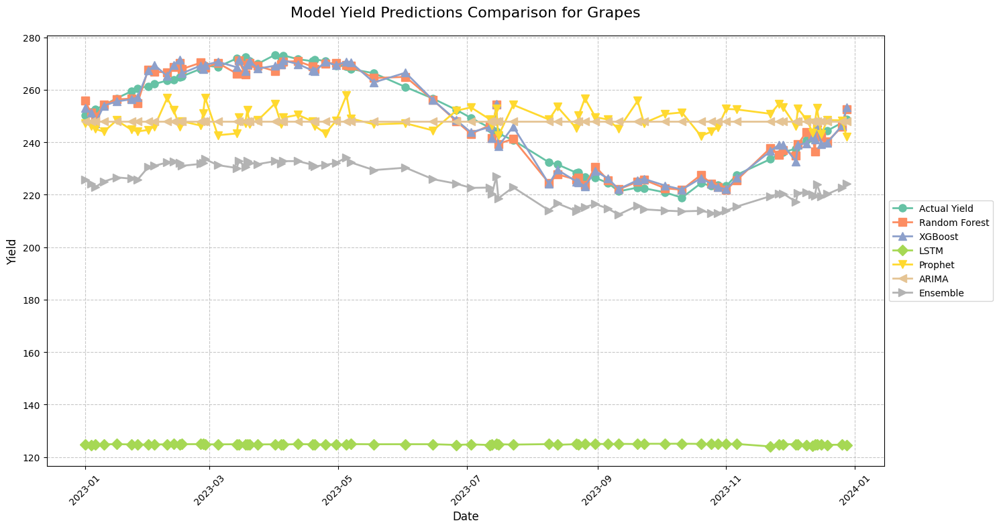


Plotting time comparison...
Forward filling 72 NaN values with previous row values


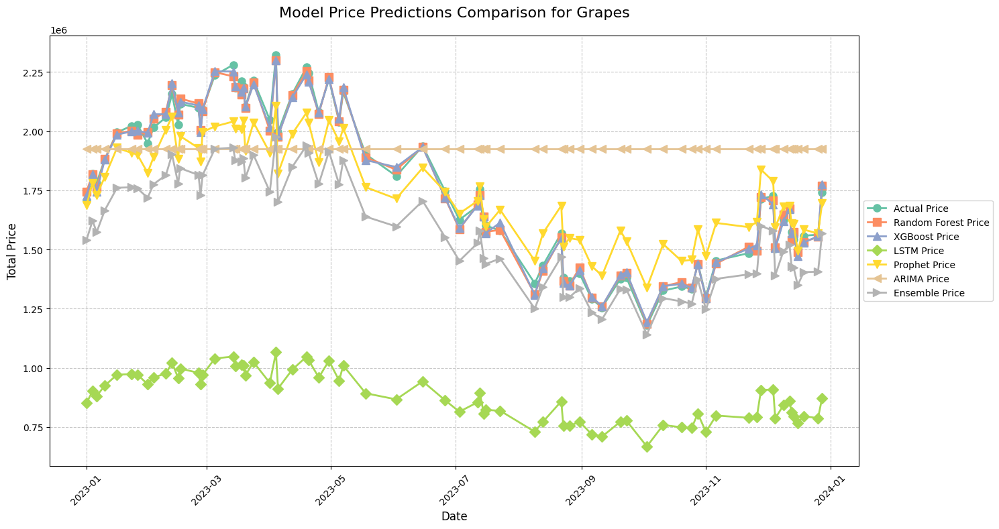


Model Insights:

Random Forest:
- RMSE: 3.45
- R2 Score: 0.96
- MAE: 2.73
- Captures non-linear feature relationships

XGBoost:
- RMSE: 3.52
- R2 Score: 0.96
- MAE: 2.83
- Captures non-linear feature relationships

LSTM:
- RMSE: 126.23
- R2 Score: -50.54
- MAE: 125.00
- Captures sequential patterns in the data

Prophet:
- RMSE: 18.43
- R2 Score: -0.10
- MAE: 16.28
- Accounts for seasonal trends

ARIMA:
- RMSE: 17.68
- R2 Score: -0.01
- MAE: 15.63
- Models time series dependencies

Ensemble:
- RMSE: 27.90
- R2 Score: -1.52
- MAE: 25.68

Analyzing Watermelon yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 88255.4688 - mae: 296.3423 - val_loss: 90008.2031 - val_mae: 299.2668
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 87681.7969 - mae: 295.3668 - val_loss: 89992.4922 - val_mae: 299.2406
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 88071.9375 - mae: 296.0618 - val_loss: 89973.8828 - val_mae: 299.2096
Epoch 4/100
8/8 ━━━━━━━━━━━━━━

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/vabq7n7n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/5ngxd6in.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15363', 'data', 'file=/tmp/tmprt5m2rxh/vabq7n7n.json', 'init=/tmp/tmprt5m2rxh/5ngxd6in.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelut3950ih/prophet_model-20241125062138.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:21:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:21:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost     LSTM  Prophet   ARIMA  Ensemble
MAE           3.956    4.387  167.195   19.430  18.594    34.212
RMSE          5.067    5.697  168.486   21.952  21.012    36.747
R2            0.941    0.925  -64.260   -0.108  -0.015    -2.104

Plotting feature importance...


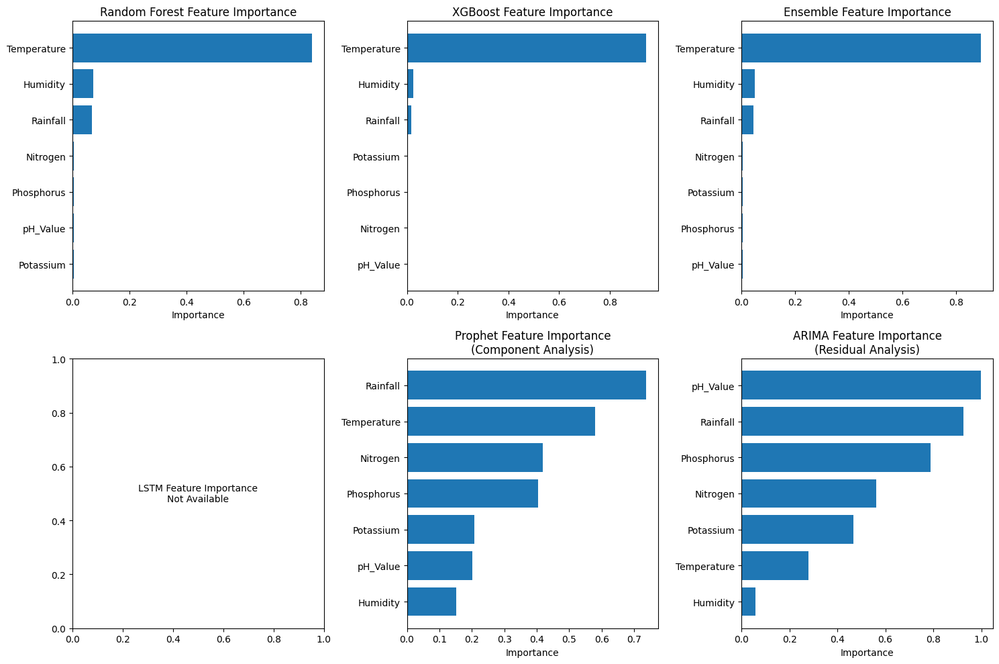


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


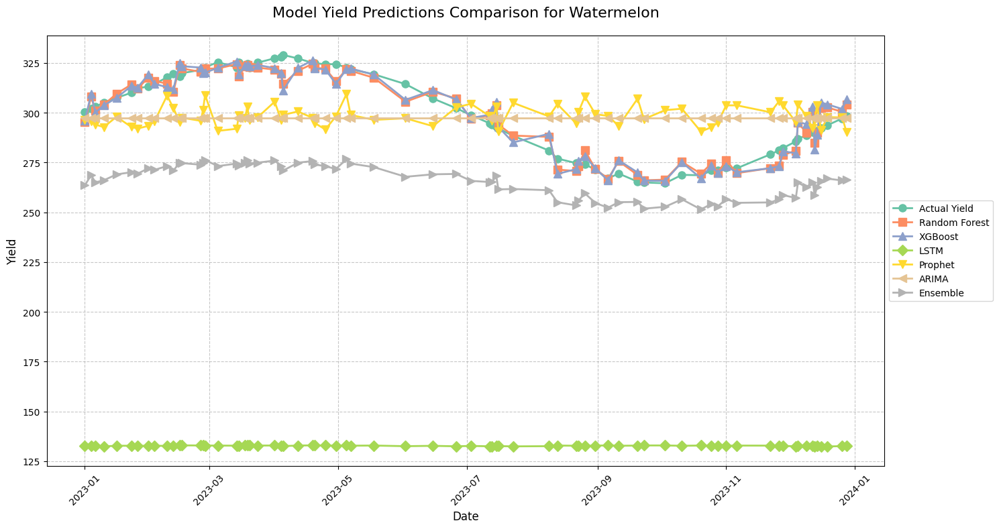


Plotting time comparison...
Forward filling 72 NaN values with previous row values


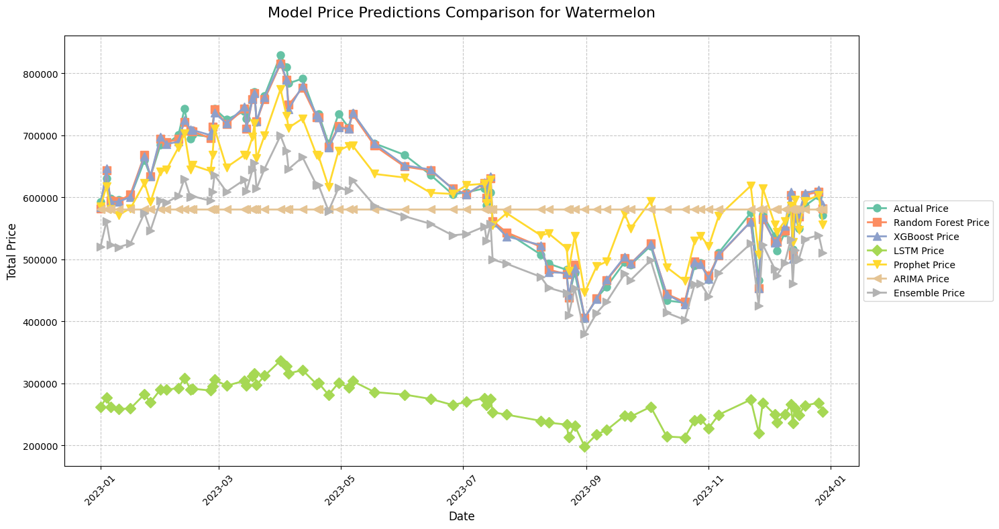


Model Insights:

Random Forest:
- RMSE: 5.07
- R2 Score: 0.94
- MAE: 3.96
- Captures non-linear feature relationships

XGBoost:
- RMSE: 5.70
- R2 Score: 0.93
- MAE: 4.39
- Captures non-linear feature relationships

LSTM:
- RMSE: 168.49
- R2 Score: -64.26
- MAE: 167.19
- Captures sequential patterns in the data

Prophet:
- RMSE: 21.95
- R2 Score: -0.11
- MAE: 19.43
- Accounts for seasonal trends

ARIMA:
- RMSE: 21.01
- R2 Score: -0.02
- MAE: 18.59
- Models time series dependencies

Ensemble:
- RMSE: 36.75
- R2 Score: -2.10
- MAE: 34.21

Analyzing Muskmelon yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 39618.9297 - mae: 198.5344 - val_loss: 40055.8672 - val_mae: 199.6291
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 39205.6641 - mae: 197.4684 - val_loss: 40046.2539 - val_mae: 199.6053
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 39300.0273 - mae: 197.7197 - val_loss: 40036.2031 - val_mae: 199.5803
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/liyobht6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/86ivmnq6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71676', 'data', 'file=/tmp/tmprt5m2rxh/liyobht6.json', 'init=/tmp/tmprt5m2rxh/86ivmnq6.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_model_itroigi/prophet_model-20241125062216.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:22:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:22:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost     LSTM  Prophet   ARIMA  Ensemble
MAE           2.471    2.554  111.547   13.118  12.540    23.054
RMSE          3.094    3.190  112.429   14.825  14.188    24.736
R2            0.952    0.949  -62.766   -0.109  -0.016    -2.087

Plotting feature importance...


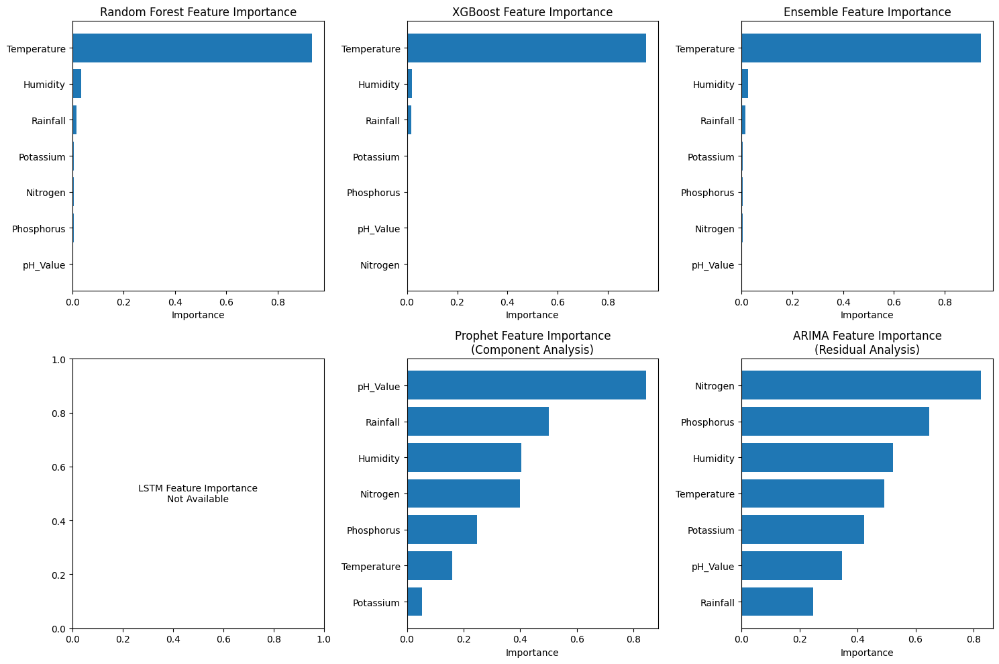


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


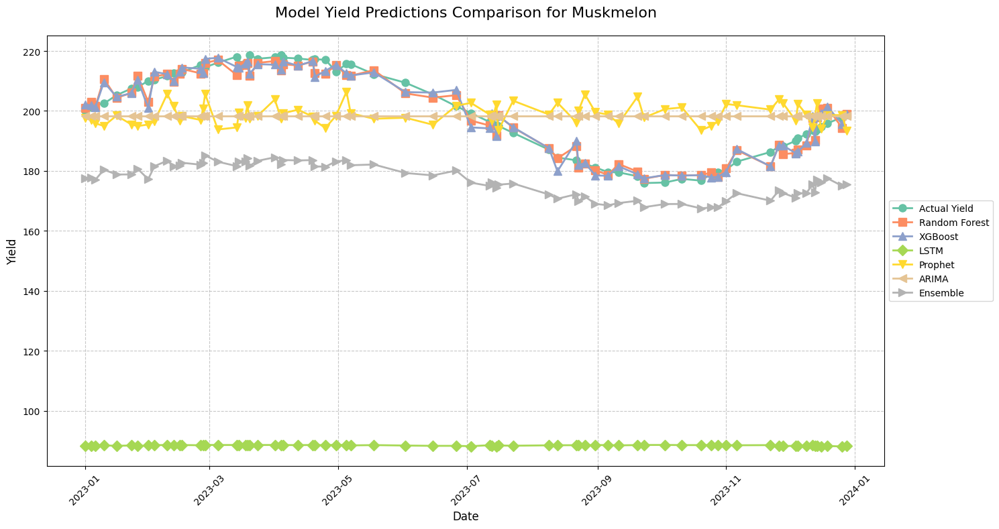


Plotting time comparison...
Forward filling 72 NaN values with previous row values


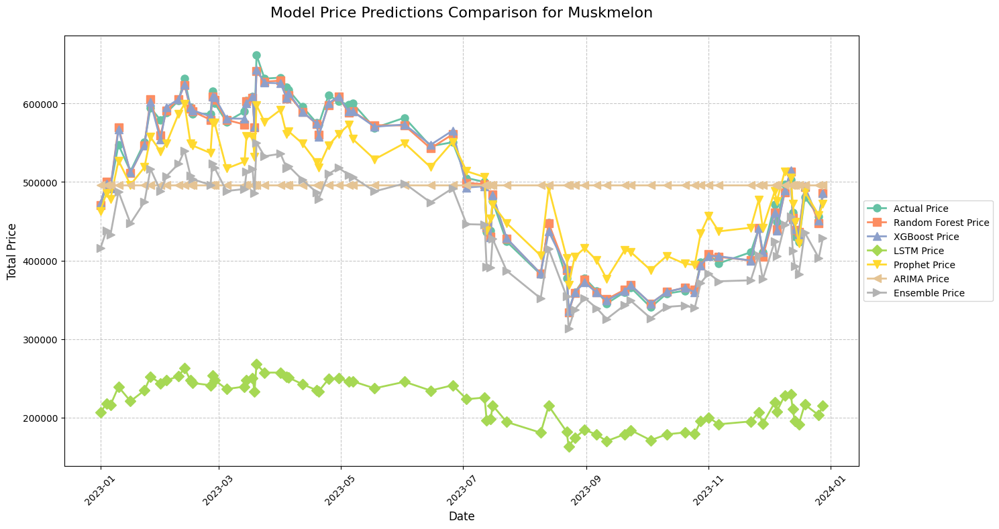


Model Insights:

Random Forest:
- RMSE: 3.09
- R2 Score: 0.95
- MAE: 2.47
- Captures non-linear feature relationships

XGBoost:
- RMSE: 3.19
- R2 Score: 0.95
- MAE: 2.55
- Captures non-linear feature relationships

LSTM:
- RMSE: 112.43
- R2 Score: -62.77
- MAE: 111.55
- Captures sequential patterns in the data

Prophet:
- RMSE: 14.82
- R2 Score: -0.11
- MAE: 13.12
- Accounts for seasonal trends

ARIMA:
- RMSE: 14.19
- R2 Score: -0.02
- MAE: 12.54
- Models time series dependencies

Ensemble:
- RMSE: 24.74
- R2 Score: -2.09
- MAE: 23.05

Analyzing Apple yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 31939.4512 - mae: 178.2795 - val_loss: 32482.6699 - val_mae: 179.7746
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 32070.4961 - mae: 178.6514 - val_loss: 32473.3535 - val_mae: 179.7482
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 31972.0605 - mae: 178.3558 - val_loss: 32464.4160 - val_mae: 179.7231
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/x2b35yrt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/42um0b69.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6533', 'data', 'file=/tmp/tmprt5m2rxh/x2b35yrt.json', 'init=/tmp/tmprt5m2rxh/42um0b69.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelyzc710zq/prophet_model-20241125062305.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:23:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:23:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost    LSTM  Prophet   ARIMA  Ensemble
MAE           2.114    2.231  97.419   11.703  11.231    20.347
RMSE          2.775    2.957  98.223   13.202  12.657    21.813
R2            0.951    0.945 -60.140   -0.105  -0.015    -2.015

Plotting feature importance...


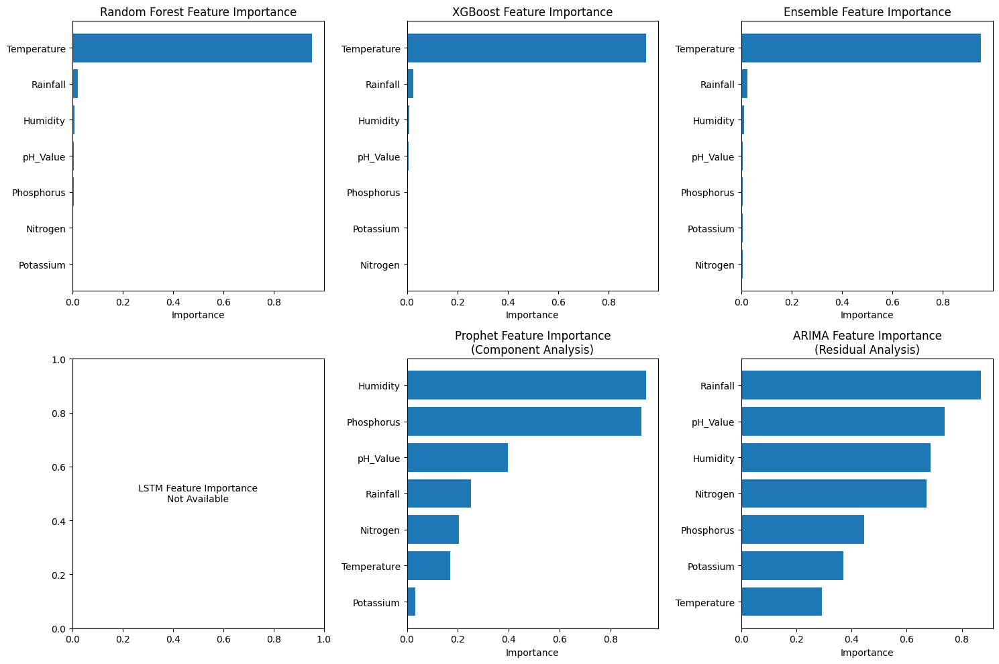


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


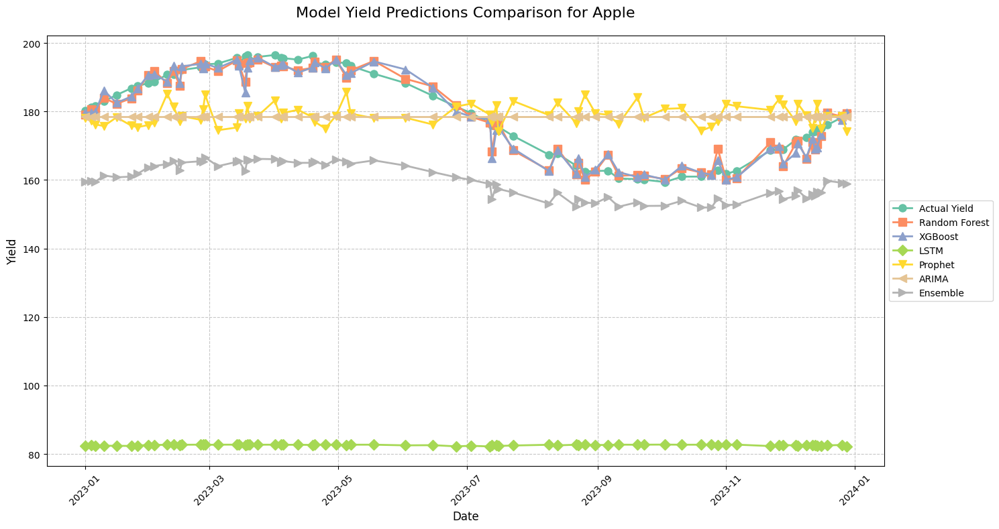


Plotting time comparison...
Forward filling 72 NaN values with previous row values


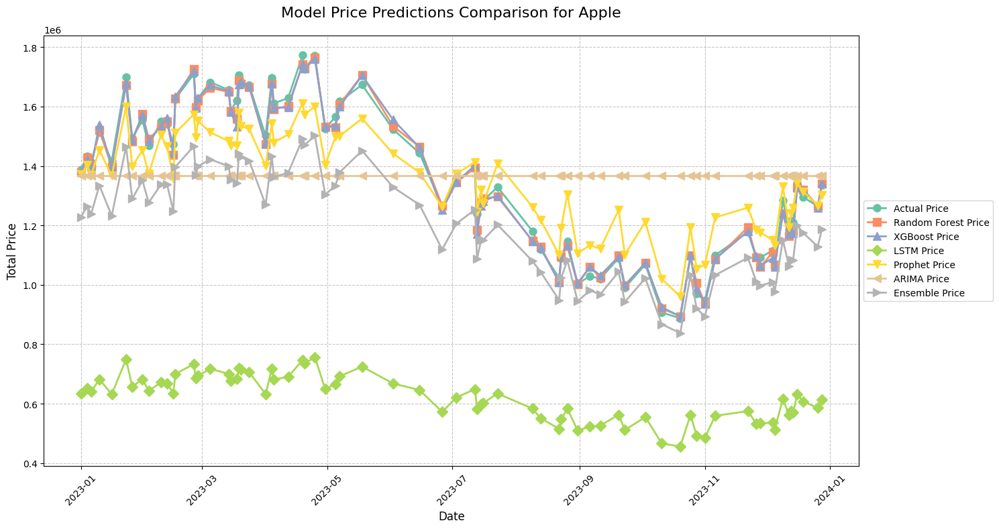


Model Insights:

Random Forest:
- RMSE: 2.77
- R2 Score: 0.95
- MAE: 2.11
- Captures non-linear feature relationships

XGBoost:
- RMSE: 2.96
- R2 Score: 0.94
- MAE: 2.23
- Captures non-linear feature relationships

LSTM:
- RMSE: 98.22
- R2 Score: -60.14
- MAE: 97.42
- Captures sequential patterns in the data

Prophet:
- RMSE: 13.20
- R2 Score: -0.10
- MAE: 11.70
- Accounts for seasonal trends

ARIMA:
- RMSE: 12.66
- R2 Score: -0.02
- MAE: 11.23
- Models time series dependencies

Ensemble:
- RMSE: 21.81
- R2 Score: -2.02
- MAE: 20.35

Analyzing Orange yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 48261.0938 - mae: 219.1112 - val_loss: 48491.7461 - val_mae: 219.6469
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 47222.5312 - mae: 216.7563 - val_loss: 48483.0664 - val_mae: 219.6272
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 47660.4922 - mae: 217.7968 - val_loss: 48473.6523 - val_mae: 219.6058
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/_e9bd4v0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/_ob_6uw7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90383', 'data', 'file=/tmp/tmprt5m2rxh/_e9bd4v0.json', 'init=/tmp/tmprt5m2rxh/_ob_6uw7.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_model_ribxebw/prophet_model-20241125062347.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:23:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:23:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost     LSTM  Prophet   ARIMA  Ensemble
MAE           2.964    3.252  143.578   14.189  13.621    28.983
RMSE          3.849    4.211  144.383   16.064  15.377    30.601
R2            0.936    0.924  -88.496   -0.108  -0.015    -3.020

Plotting feature importance...


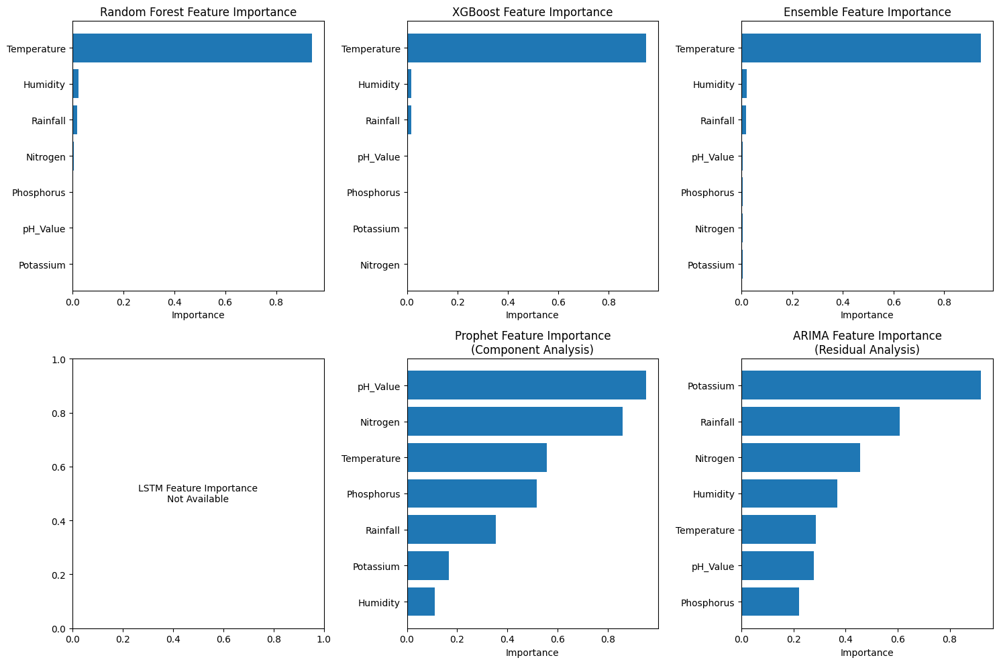


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


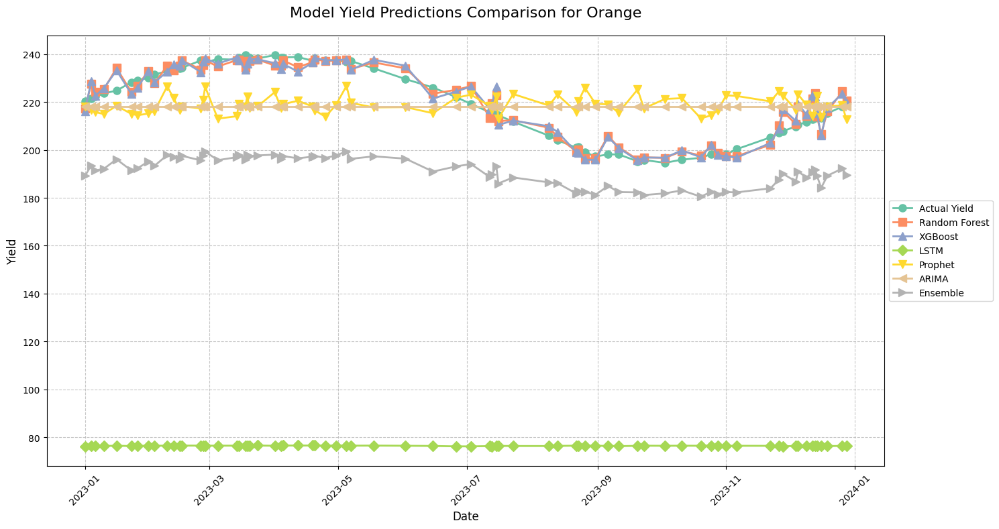


Plotting time comparison...
Forward filling 72 NaN values with previous row values


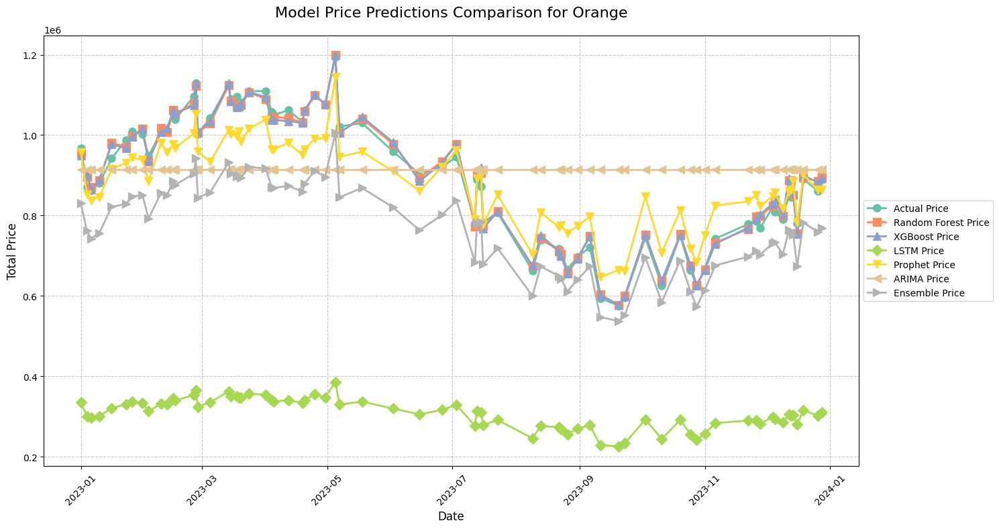


Model Insights:

Random Forest:
- RMSE: 3.85
- R2 Score: 0.94
- MAE: 2.96
- Captures non-linear feature relationships

XGBoost:
- RMSE: 4.21
- R2 Score: 0.92
- MAE: 3.25
- Captures non-linear feature relationships

LSTM:
- RMSE: 144.38
- R2 Score: -88.50
- MAE: 143.58
- Captures sequential patterns in the data

Prophet:
- RMSE: 16.06
- R2 Score: -0.11
- MAE: 14.19
- Accounts for seasonal trends

ARIMA:
- RMSE: 15.38
- R2 Score: -0.02
- MAE: 13.62
- Models time series dependencies

Ensemble:
- RMSE: 30.60
- R2 Score: -3.02
- MAE: 28.98

Analyzing Papaya yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 198427.1562 - mae: 444.3216 - val_loss: 202670.7656 - val_mae: 449.0519
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 198230.9062 - mae: 444.0347 - val_loss: 202637.0781 - val_mae: 449.0148
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 198355.7031 - mae: 444.2407 - val_loss: 202598.5469 - val_mae: 448.9722
Epoch 4/100
8/8 ━━━━━━━━━━━━━

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/vrxb3jv9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/pf5qondq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31607', 'data', 'file=/tmp/tmprt5m2rxh/vrxb3jv9.json', 'init=/tmp/tmprt5m2rxh/pf5qondq.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelmj7w0rgj/prophet_model-20241125062423.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:24:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:24:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost     LSTM  Prophet   ARIMA  Ensemble
MAE           5.406    5.197  285.644   29.355  28.046    58.593
RMSE          6.624    6.608  287.359   33.091  31.645    61.846
R2            0.956    0.956  -82.614   -0.109  -0.014    -2.873

Plotting feature importance...


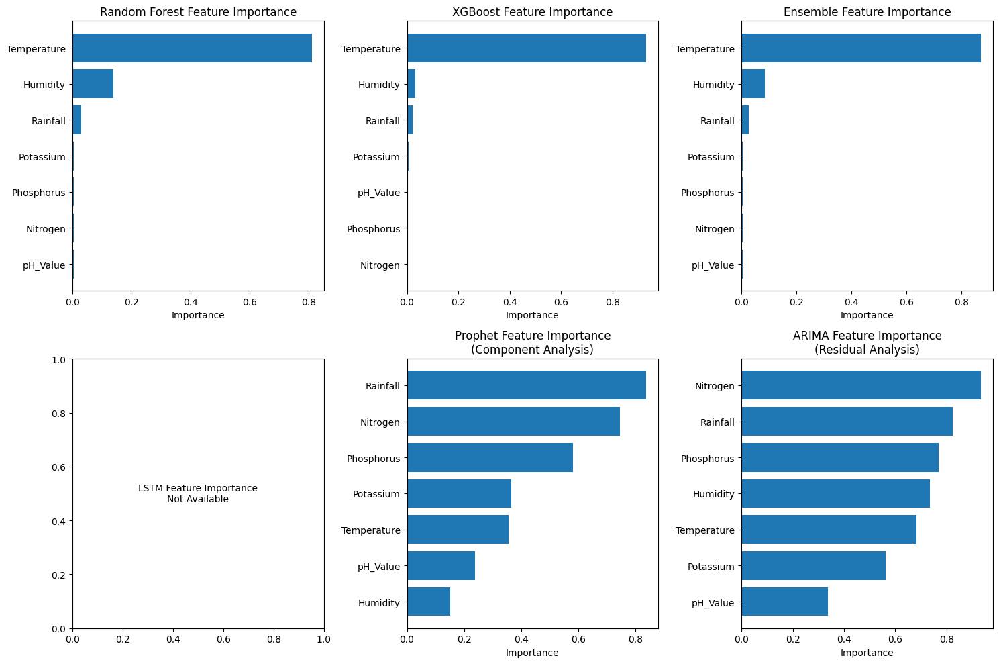


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


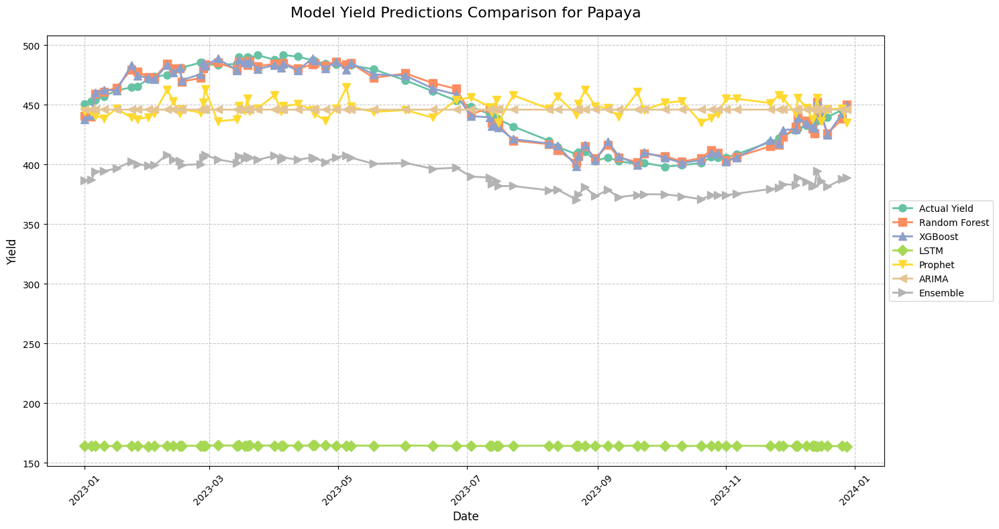


Plotting time comparison...
Forward filling 72 NaN values with previous row values


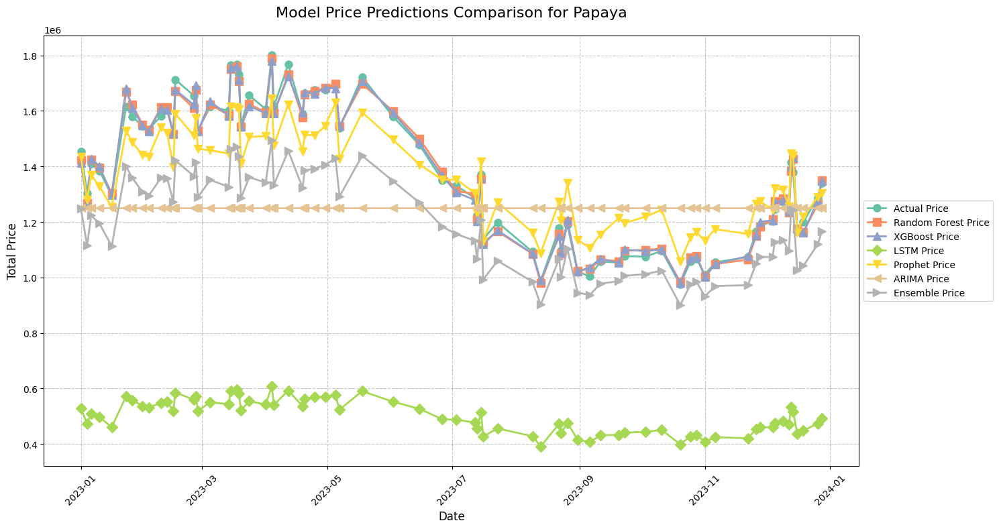


Model Insights:

Random Forest:
- RMSE: 6.62
- R2 Score: 0.96
- MAE: 5.41
- Captures non-linear feature relationships

XGBoost:
- RMSE: 6.61
- R2 Score: 0.96
- MAE: 5.20
- Captures non-linear feature relationships

LSTM:
- RMSE: 287.36
- R2 Score: -82.61
- MAE: 285.64
- Captures sequential patterns in the data

Prophet:
- RMSE: 33.09
- R2 Score: -0.11
- MAE: 29.35
- Accounts for seasonal trends

ARIMA:
- RMSE: 31.64
- R2 Score: -0.01
- MAE: 28.05
- Models time series dependencies

Ensemble:
- RMSE: 61.85
- R2 Score: -2.87
- MAE: 58.59

Analyzing Coconut yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 6296.8608 - mae: 79.1501 - val_loss: 6418.3794 - val_mae: 79.9109
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 6264.0210 - mae: 78.9424 - val_loss: 6415.0986 - val_mae: 79.8903
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 6271.5996 - mae: 78.9789 - val_loss: 6411.3457 - val_mae: 79.8667
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/s

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/94z0loky.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/8txzho1j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18376', 'data', 'file=/tmp/tmprt5m2rxh/94z0loky.json', 'init=/tmp/tmprt5m2rxh/8txzho1j.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelyam7knpt/prophet_model-20241125062456.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:24:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:24:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.814    0.947  6.561    5.155  4.947     3.161
RMSE          1.046    1.185  7.709    5.833  5.577     3.646
R2            0.964    0.954 -0.934   -0.107 -0.012     0.567

Plotting feature importance...


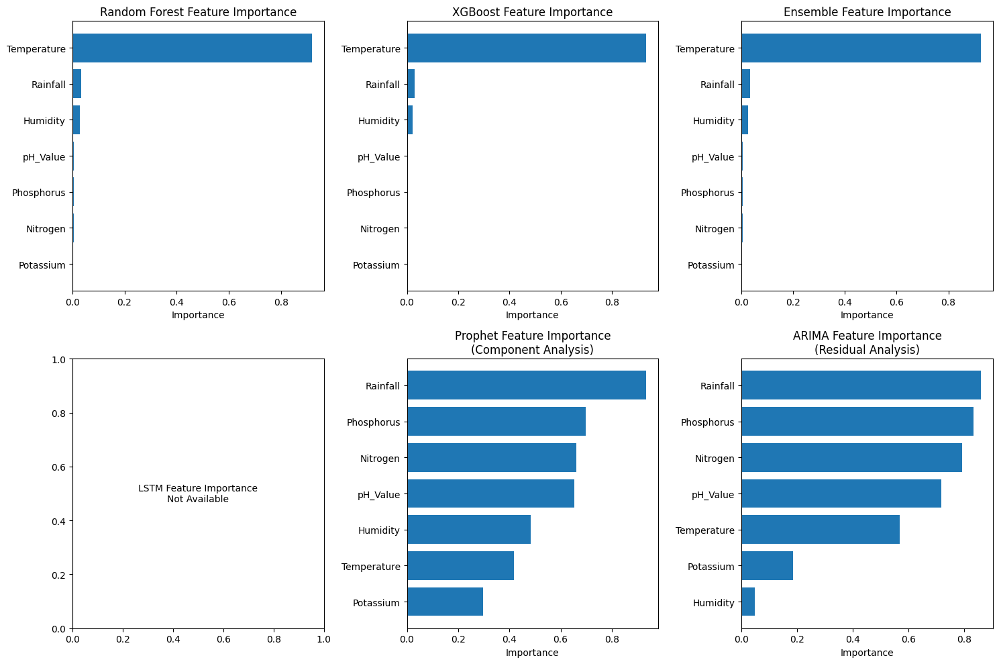


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


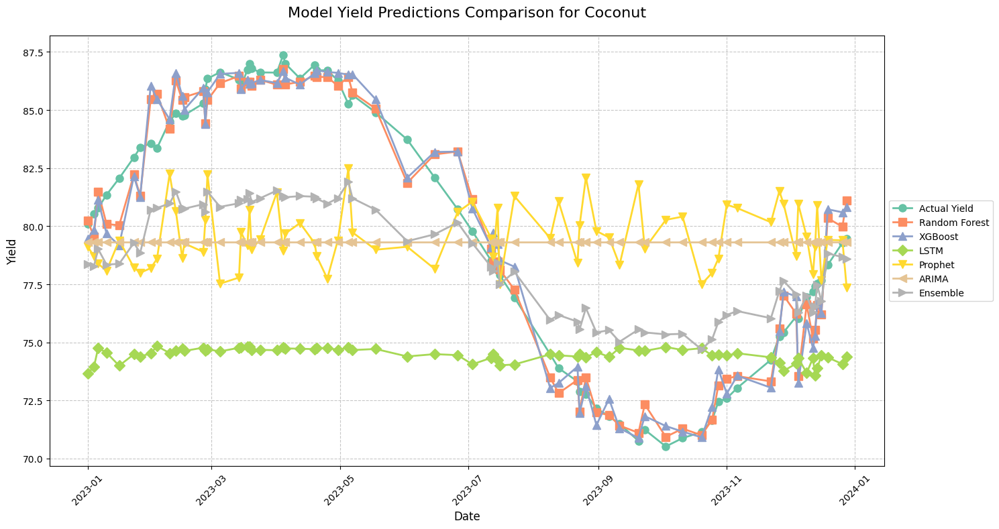


Plotting time comparison...
Forward filling 72 NaN values with previous row values


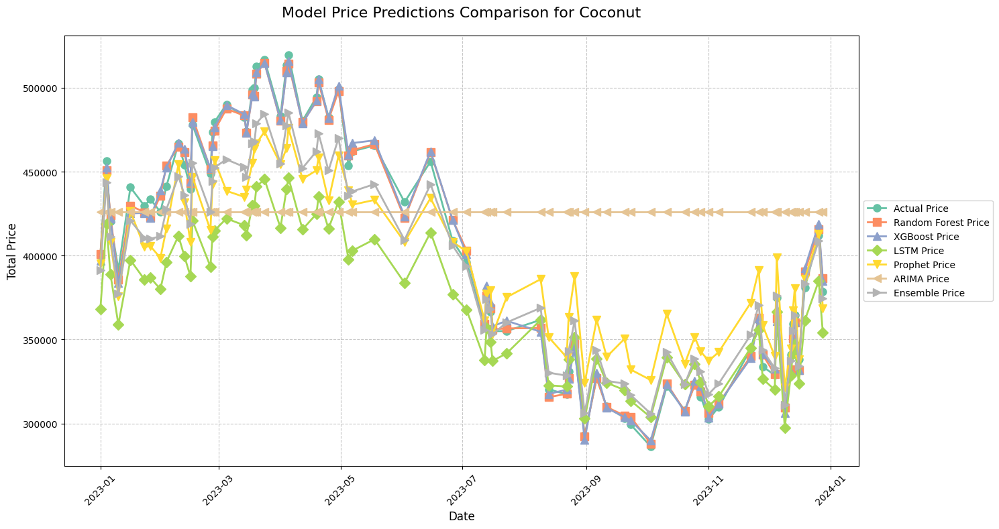


Model Insights:

Random Forest:
- RMSE: 1.05
- R2 Score: 0.96
- MAE: 0.81
- Captures non-linear feature relationships

XGBoost:
- RMSE: 1.18
- R2 Score: 0.95
- MAE: 0.95
- Captures non-linear feature relationships

LSTM:
- RMSE: 7.71
- R2 Score: -0.93
- MAE: 6.56
- Captures sequential patterns in the data

Prophet:
- RMSE: 5.83
- R2 Score: -0.11
- MAE: 5.15
- Accounts for seasonal trends

ARIMA:
- RMSE: 5.58
- R2 Score: -0.01
- MAE: 4.95
- Models time series dependencies

Ensemble:
- RMSE: 3.65
- R2 Score: 0.57
- MAE: 3.16

Analyzing Cotton yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 612.8238 - mae: 24.6912 - val_loss: 623.5381 - val_mae: 24.9089
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 613.8281 - mae: 24.7154 - val_loss: 621.1369 - val_mae: 24.8617
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 610.9869 - mae: 24.6563 - val_loss: 618.4478 - val_mae: 24.8088
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 609.428

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/e4ijubp_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/rgapzpqv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78530', 'data', 'file=/tmp/tmprt5m2rxh/e4ijubp_.json', 'init=/tmp/tmprt5m2rxh/rgapzpqv.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelul5px1ag/prophet_model-20241125062535.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:25:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:25:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.345    0.363  0.783    1.635  1.566     0.720
RMSE          0.479    0.498  0.972    1.845  1.767     0.831
R2            0.926    0.919  0.693   -0.106 -0.015     0.776

Plotting feature importance...


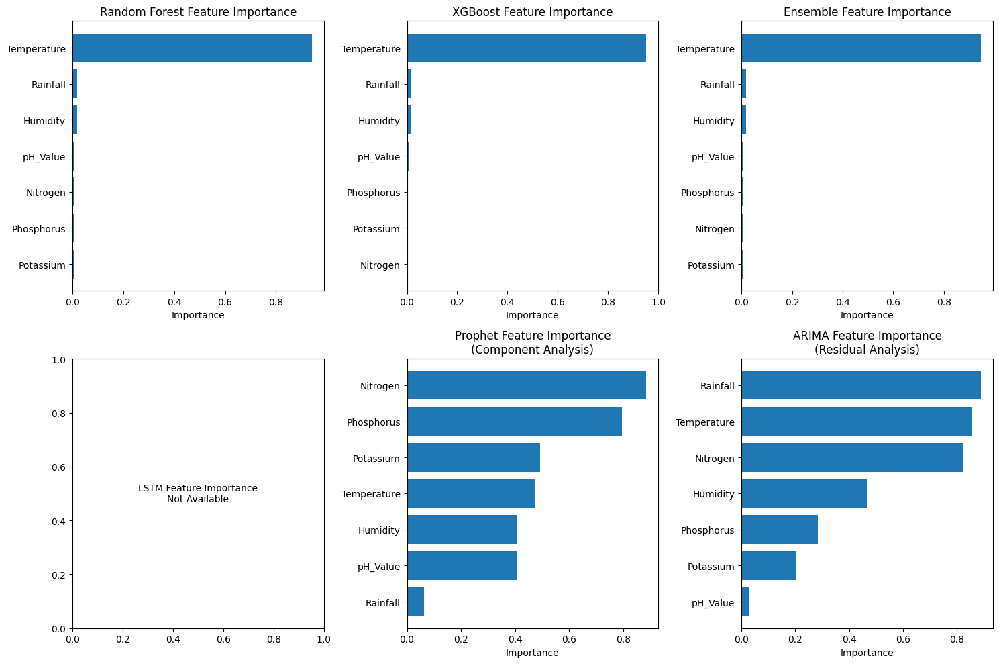


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


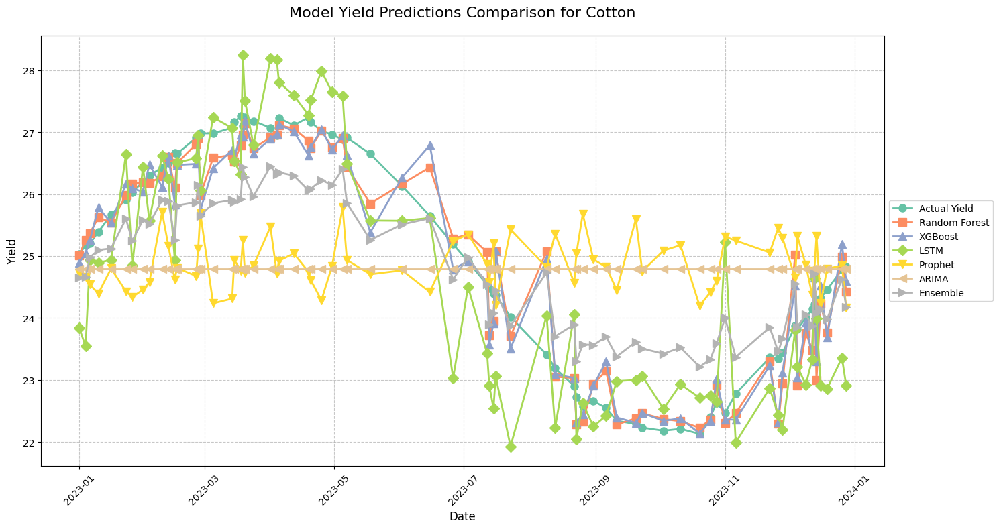


Plotting time comparison...
Forward filling 72 NaN values with previous row values


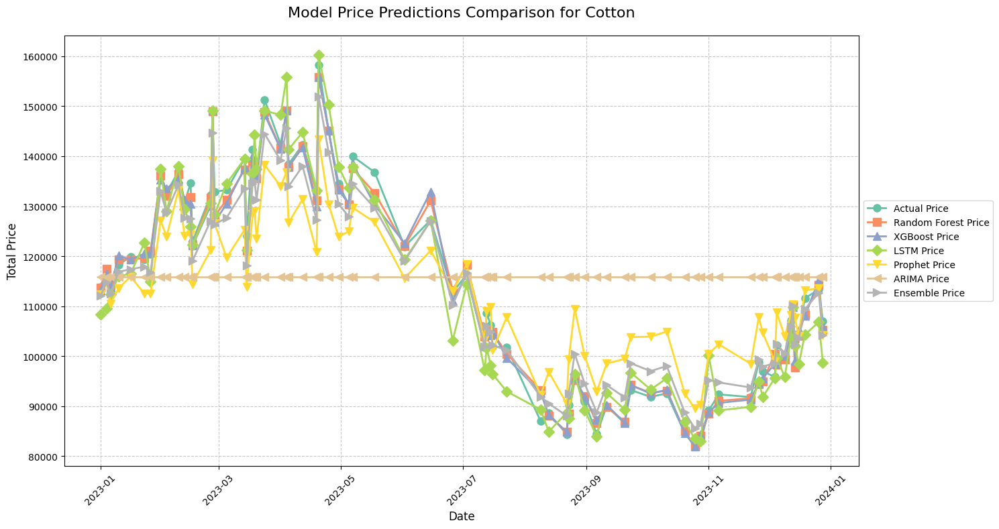


Model Insights:

Random Forest:
- RMSE: 0.48
- R2 Score: 0.93
- MAE: 0.34
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.50
- R2 Score: 0.92
- MAE: 0.36
- Captures non-linear feature relationships

LSTM:
- RMSE: 0.97
- R2 Score: 0.69
- MAE: 0.78
- Captures sequential patterns in the data

Prophet:
- RMSE: 1.85
- R2 Score: -0.11
- MAE: 1.63
- Accounts for seasonal trends

ARIMA:
- RMSE: 1.77
- R2 Score: -0.01
- MAE: 1.57
- Models time series dependencies

Ensemble:
- RMSE: 0.83
- R2 Score: 0.78
- MAE: 0.72

Analyzing Jute yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 771.6175 - mae: 27.7058 - val_loss: 782.9348 - val_mae: 27.9081
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 776.0203 - mae: 27.7822 - val_loss: 781.4648 - val_mae: 27.8807
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 768.2602 - mae: 27.6425 - val_loss: 779.7786 - val_mae: 27.8492
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 762.7504 -

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/6kvkw0tj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/lm3g3r57.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18547', 'data', 'file=/tmp/tmprt5m2rxh/6kvkw0tj.json', 'init=/tmp/tmprt5m2rxh/lm3g3r57.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modeljlpkxmf8/prophet_model-20241125062607.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:26:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.282    0.300  0.724    1.804  1.728     0.838
RMSE          0.368    0.378  0.839    2.038  1.947     0.956
R2            0.964    0.962  0.812   -0.111 -0.014     0.756

Plotting feature importance...


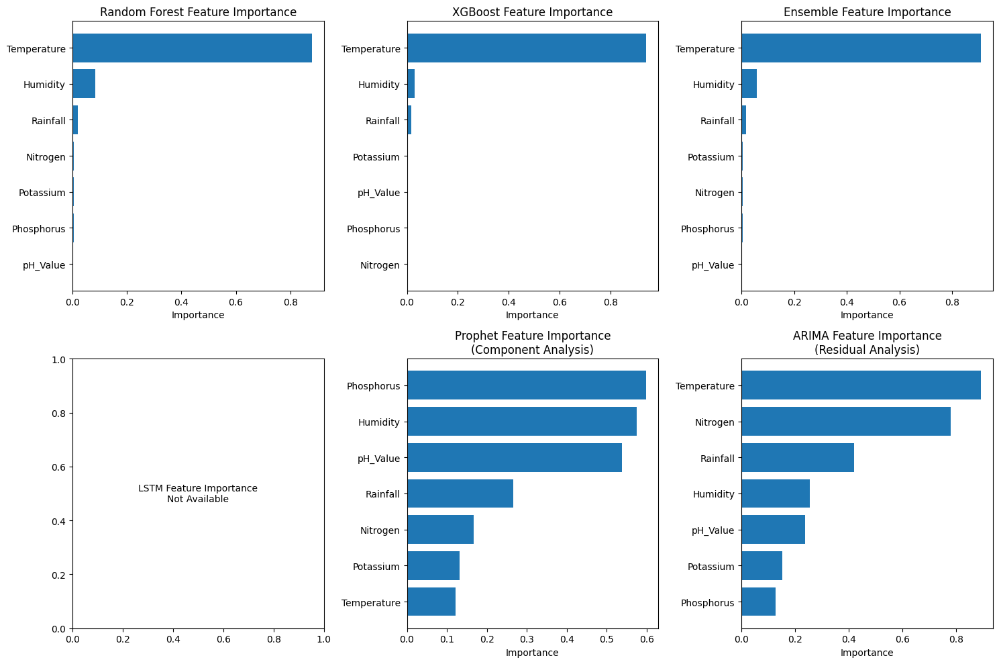


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


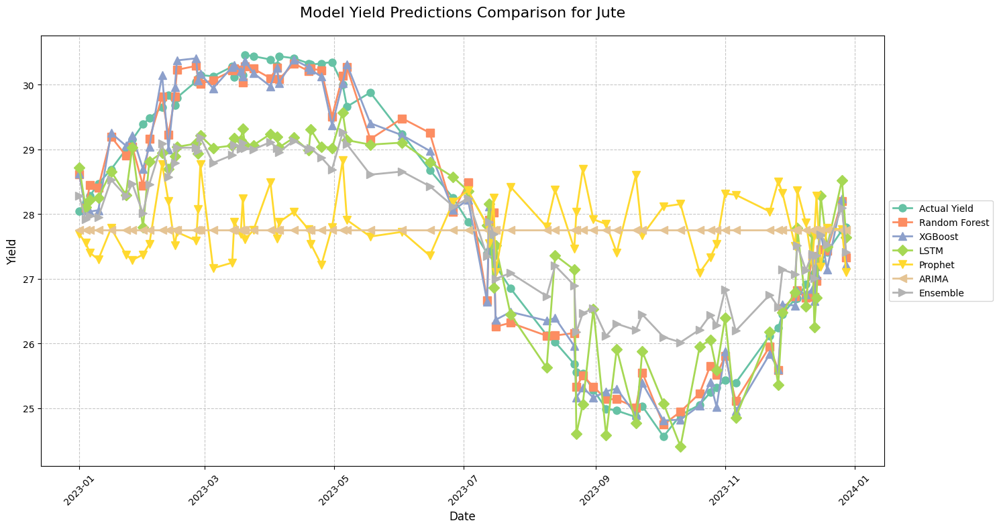


Plotting time comparison...
Forward filling 72 NaN values with previous row values


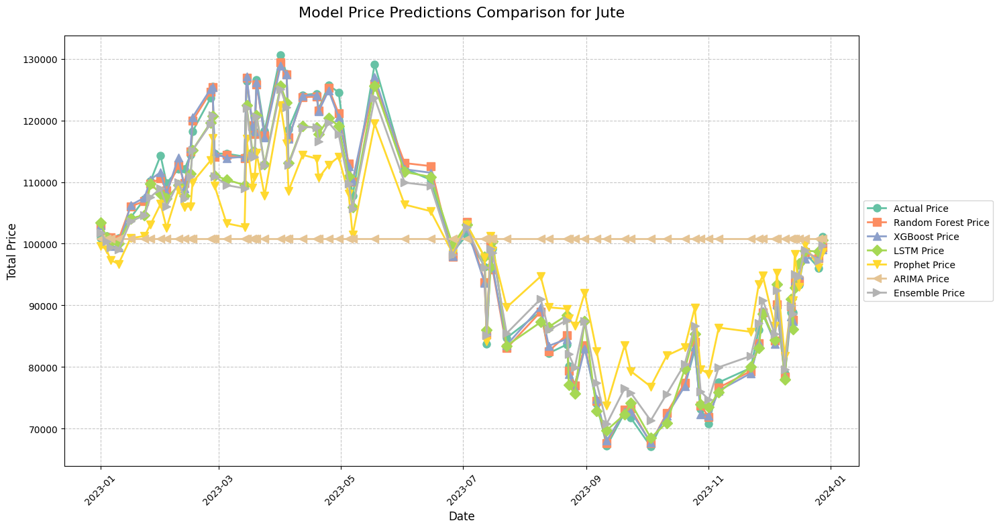


Model Insights:

Random Forest:
- RMSE: 0.37
- R2 Score: 0.96
- MAE: 0.28
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.38
- R2 Score: 0.96
- MAE: 0.30
- Captures non-linear feature relationships

LSTM:
- RMSE: 0.84
- R2 Score: 0.81
- MAE: 0.72
- Captures sequential patterns in the data

Prophet:
- RMSE: 2.04
- R2 Score: -0.11
- MAE: 1.80
- Accounts for seasonal trends

ARIMA:
- RMSE: 1.95
- R2 Score: -0.01
- MAE: 1.73
- Models time series dependencies

Ensemble:
- RMSE: 0.96
- R2 Score: 0.76
- MAE: 0.84

Analyzing Coffee yield predictions...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 221.0553 - mae: 14.8288 - val_loss: 224.9269 - val_mae: 14.9597
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 221.6772 - mae: 14.8506 - val_loss: 224.3954 - val_mae: 14.9421
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 219.4629 - mae: 14.7767 - val_loss: 223.8633 - val_mae: 14.9244
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 221.7205

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/b1soj0kw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprt5m2rxh/cp35im4s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19449', 'data', 'file=/tmp/tmprt5m2rxh/b1soj0kw.json', 'init=/tmp/tmprt5m2rxh/cp35im4s.json', 'output', 'file=/tmp/tmprt5m2rxh/prophet_modelu1dy771m/prophet_model-20241125062644.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:26:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Models trained successfully.

Model Evaluation Results:
      Random Forest  XGBoost   LSTM  Prophet  ARIMA  Ensemble
MAE           0.174    0.183  0.389    0.962  0.924     0.434
RMSE          0.221    0.247  0.528    1.085  1.041     0.498
R2            0.954    0.943  0.739   -0.101 -0.015     0.768

Plotting feature importance...


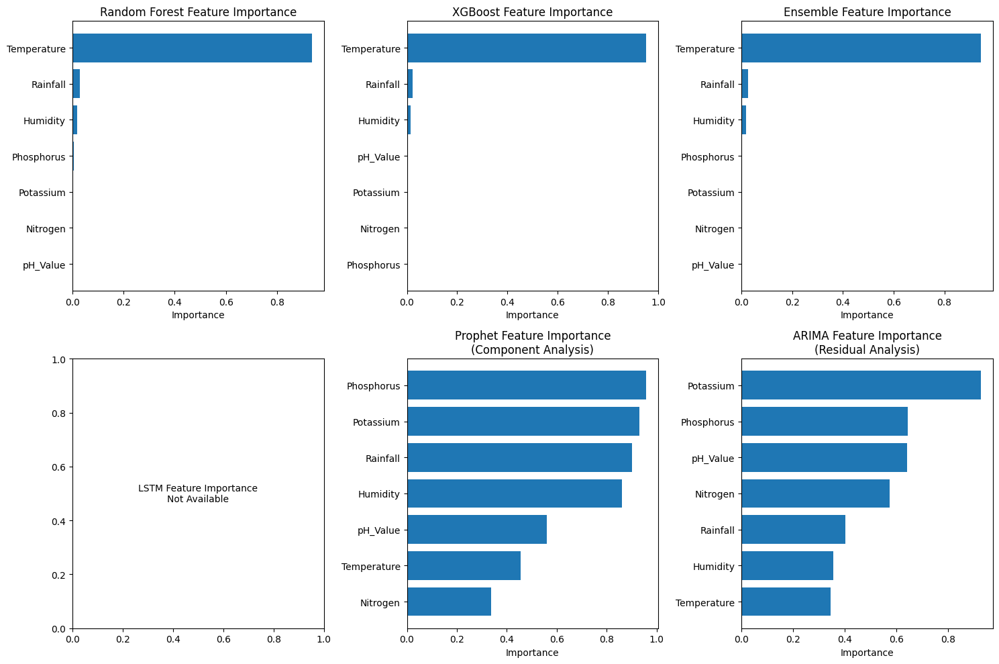


Plotting predictions comparison...
Forward filling 72 NaN values with previous row values


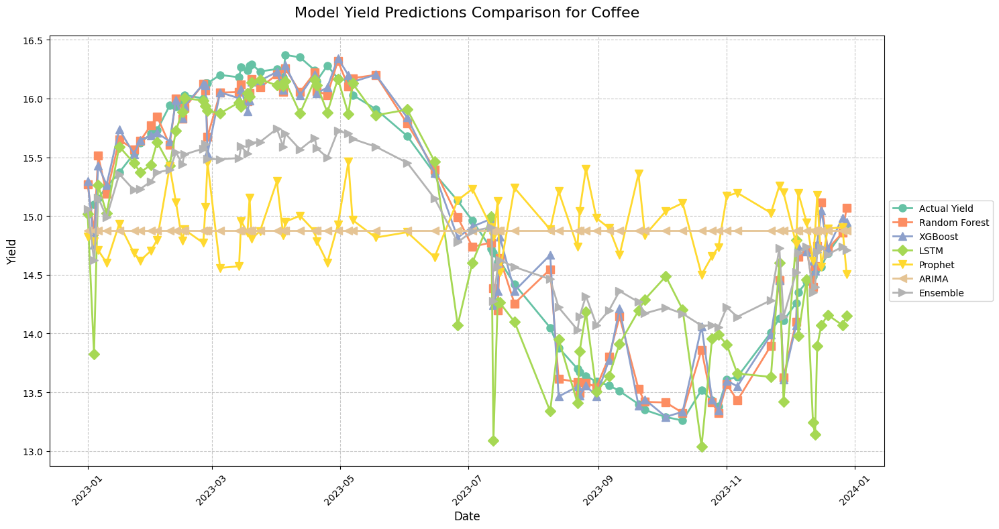


Plotting time comparison...
Forward filling 72 NaN values with previous row values


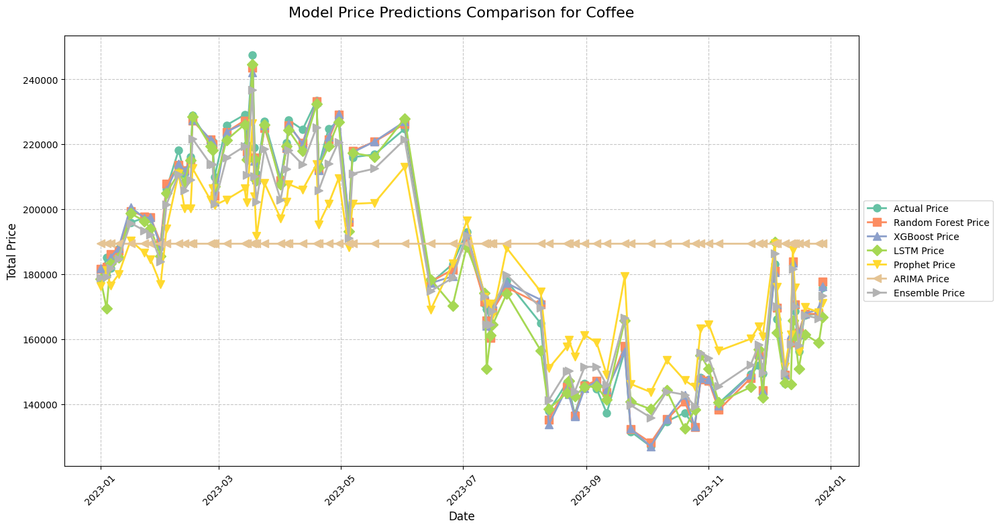


Model Insights:

Random Forest:
- RMSE: 0.22
- R2 Score: 0.95
- MAE: 0.17
- Captures non-linear feature relationships

XGBoost:
- RMSE: 0.25
- R2 Score: 0.94
- MAE: 0.18
- Captures non-linear feature relationships

LSTM:
- RMSE: 0.53
- R2 Score: 0.74
- MAE: 0.39
- Captures sequential patterns in the data

Prophet:
- RMSE: 1.08
- R2 Score: -0.10
- MAE: 0.96
- Accounts for seasonal trends

ARIMA:
- RMSE: 1.04
- R2 Score: -0.01
- MAE: 0.92
- Models time series dependencies

Ensemble:
- RMSE: 0.50
- R2 Score: 0.77
- MAE: 0.43


In [ ]:
commodities = [
    'Rice', 'Maize', 'ChickPea', 'KidneyBeans', 'PigeonPeas', 'MothBeans',
    'MungBean', 'Blackgram', 'Lentil', 'Pomegranate', 'Banana', 'Mango',
    'Grapes', 'Watermelon', 'Muskmelon', 'Apple', 'Orange', 'Papaya',
    'Coconut', 'Cotton', 'Jute', 'Coffee'
]
final_result = []
for crop in commodities:
  res = main_1(crop)
  final_result.append(res)

In [ ]:
final_result

[{'predictor': <__main__.CropYieldPredictor at 0x7a800c9459f0>,
  'results': {'Random Forest': {'MAE': 0.5653561643835661,
    'RMSE': 0.7062351742655362,
    'R2': 0.9493261321387605},
   'XGBoost': {'MAE': 0.6489668441145391,
    'RMSE': 0.8016115223806558,
    'R2': 0.9347150209650636},
   'LSTM': {'MAE': 2.1745815768307204,
    'RMSE': 2.361120364676592,
    'R2': 0.43360211789515357},
   'Prophet': {'MAE': 2.9218723145874037,
    'RMSE': 3.302094702080054,
    'R2': -0.1078077920643623},
   'ARIMA': {'MAE': 2.801567387443204,
    'RMSE': 3.158219816840125,
    'R2': -0.013374741578640048},
   'Ensemble': {'MAE': 1.5747151752972957,
    'RMSE': 1.7801033388704801,
    'R2': 0.6780593650263196}},
  'predictions': {'Random Forest': array([43.6937, 48.337 , 46.2431, 40.1321, 47.8835, 44.1656, 48.2801,
          48.2009, 46.2307, 48.2881, 42.1626, 46.6642, 40.4156, 47.5626,
          48.167 , 40.49  , 44.6069, 40.062 , 41.6655, 48.2304, 44.8565,
          45.798 , 48.6069, 40.2622, 41.